# Capstone Project - Data Science With Python
---

## **Problem Statement 1**

A retail store with multiple outlets across the country is facing issues in **managing inventory** — specifically, matching **demand with supply**.

You are provided with **weekly sales data** for their various outlets.  
Using **statistical analysis, EDA, outlier analysis, and missing value handling**, derive insights for the following questions.

---

## **Dataset Information**

The file `Walmart.csv` contains **6435 rows and 8 columns**.

### **Feature Description**

| Feature Name    | Description                                |
|-----------------|--------------------------------------------|
| Store           | Store number                               |
| Date            | Week of Sales                               |
| Weekly_Sales    | Sales for the given store in that week      |
| Holiday_Flag    | If it is a holiday week (1 = Yes, 0 = No)   |
| Temperature     | Temperature on the day of the sale          |
| Fuel_Price      | Cost of fuel in the region                  |
| CPI             | Consumer Price Index                        |
| Unemployment    | Unemployment Rate                           |

---

## **Task 1: Exploratory Data Analysis & Insights**

Perform EDA and statistical analysis to answer the following:

### **a. Impact of Unemployment on Weekly Sales**
- Are weekly sales affected by unemployment rate?
- If yes, which stores are affected the most?

### **b. Seasonality in Weekly Sales**
- Do weekly sales show seasonal trends?
- When does seasonality occur, and what could be the reason?

### **c. Impact of Temperature**
- Does temperature influence weekly sales?

### **d. Impact of CPI**
- How is CPI affecting weekly sales across stores?

### **e. Top Performing Stores**
- Identify the highest performing stores based on historical data.

### **f. Worst Performing Store**
- Identify the lowest performing store.
- How significant is the difference between the best and worst stores?

---

## **Task 2: Predictive Modeling**

Use **predictive modeling techniques** to **forecast the sales for each store for the next 12 weeks**.

Model suggestions:
- ARIMA / SARIMA
- SARIMAX
- Prophet
- Machine Learning regressors (Random Forest, XGBoost)
- Deep learning models (LSTM, RNN)

---



#### Step 0 — Notebook setup


In [363]:
# --quiet means suppress output in console, minimal output in console

# !pip install pmdarima xgboost --quiet

In [364]:
import os
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

# display settings
pd.set_option("display.max_columns", 50)
pd.set_option("display.max_rows", 100)

#### Step 1 — Load the CSV and inspection

[https://drive.google.com/drive/folders/1OwCRJW_xbuH2Gvjg33-1Edaqw_tK4BlZ?usp=sharing](https://drive.google.com/drive/folders/1OwCRJW_xbuH2Gvjg33-1Edaqw_tK4BlZ?usp=sharing)

**Use the above link to copy the folder into your google drive and use it in this file to load the models and results**

If not, it will take upto 3 hours to run all the models without loading models from files

**Name the folder as walmart_models and keep it under root of our google drive**. If not change the BASE_PATH in below cells

In [802]:
# https://drive.google.com/drive/folders/1OwCRJW_xbuH2Gvjg33-1Edaqw_tK4BlZ?usp=sharing

In [365]:
BASE_PATH = "/content/drive/MyDrive/walmart_models"
import os
os.makedirs(BASE_PATH, exist_ok=True)

In [366]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [801]:
csv_path = f"{BASE_PATH}/Walmart DataSet.csv"

df = pd.read_csv(csv_path)
print("Shape:", df.shape)
print("\nColumns and dtypes:\n", df.dtypes)
print("\nFirst 5 rows:")
display(df.head())

# display module provides functions to render various
# data types in a rich format within environments like Jupyter notebooks or Google Colab.

print("\nMissing values per column:")
display(df.isna().sum())

print("\nBasic descriptive stats for numeric cols:")
display(df.select_dtypes(include=[np.number]).describe().T) # T is transpose


Shape: (6435, 8)

Columns and dtypes:
 Store             int64
Date             object
Weekly_Sales    float64
Holiday_Flag      int64
Temperature     float64
Fuel_Price      float64
CPI             float64
Unemployment    float64
dtype: object

First 5 rows:


,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106



Missing values per column:


,0
Store,0
Date,0
Weekly_Sales,0
Holiday_Flag,0
Temperature,0
Fuel_Price,0
CPI,0
Unemployment,0



Basic descriptive stats for numeric cols:


,count,mean,std,min,25%,50%,75%,max
Store,6435.0,2.300000e+01,12.988182,1.000,12.000,23.000000,3.400000e+01,4.500000e+01
Weekly_Sales,6435.0,1.046965e+06,564366.622054,209986.250,553350.105,960746.040000,1.420159e+06,3.818686e+06
Holiday_Flag,6435.0,6.993007e-02,0.255049,0.000,0.000,0.000000,0.000000e+00,1.000000e+00
Temperature,6435.0,6.066378e+01,18.444933,-2.060,47.460,62.670000,7.494000e+01,1.001400e+02
Fuel_Price,6435.0,3.358607e+00,0.459020,2.472,2.933,3.445000,3.735000e+00,4.468000e+00
CPI,6435.0,1.715784e+02,39.356712,126.064,131.735,182.616521,2.127433e+02,2.272328e+02
Unemployment,6435.0,7.999151e+00,1.875885,3.879,6.891,7.874000,8.622000e+00,1.431300e+01


In [803]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [804]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


The "CPI" (Customer/Consumer Price Index) column represents the standard Consumer Price Index: a numeric indicator of the average price level of a basket of goods and services that households buy, used to track inflation over time.

So, for each week and region in Walmart data, CPI tells how "expensive" the general cost of living is at that time compared to a base period, not something specific to one Walmart customer.

In [805]:
# isnull and isna both are same

df.isna().sum().sum()

np.int64(0)

In [806]:
df.duplicated().sum()

np.int64(0)

In [807]:
df.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [808]:
for col in df.columns:
    print(f"{col} has {df[col].nunique()} unique values")

Store has 45 unique values
Date has 143 unique values
Weekly_Sales has 6435 unique values
Holiday_Flag has 2 unique values
Temperature has 3528 unique values
Fuel_Price has 892 unique values
CPI has 2145 unique values
Unemployment has 349 unique values


In [809]:
unique_count = dict(map(lambda x: (x, df[x].nunique()), df.columns.tolist()))

In [810]:
unique_count

{'Store': 45,
 'Date': 143,
 'Weekly_Sales': 6435,
 'Holiday_Flag': 2,
 'Temperature': 3528,
 'Fuel_Price': 892,
 'CPI': 2145,
 'Unemployment': 349}

In [811]:
unique_count['Store'] * unique_count['Date']

6435

In [812]:
unique_count['Store'] * unique_count['Date'] == len(df)

True

In [813]:
unique_count['Weekly_Sales'] == len(df)

True

In [814]:
df['Holiday_Flag'].value_counts()

,count
Holiday_Flag,
0,5985
1,450


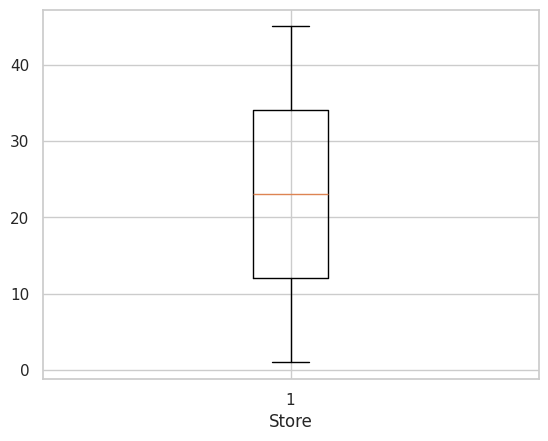

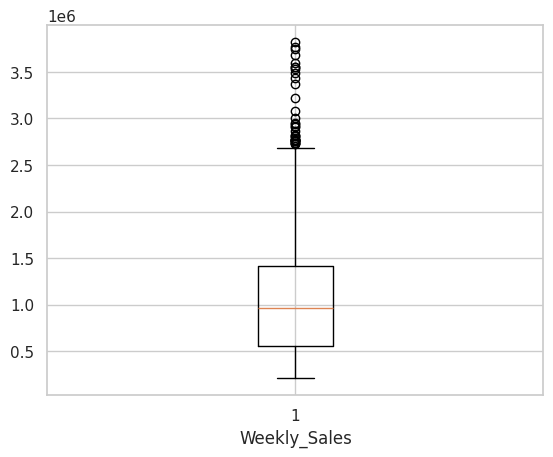

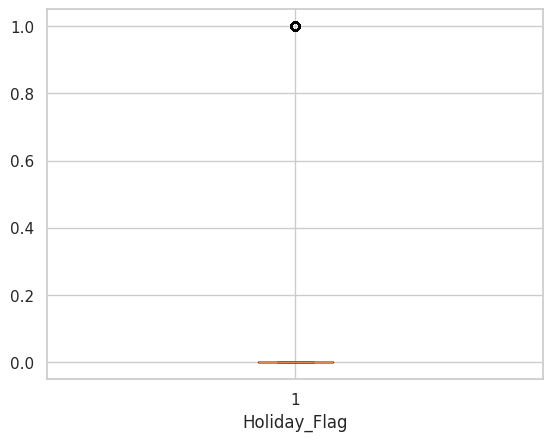

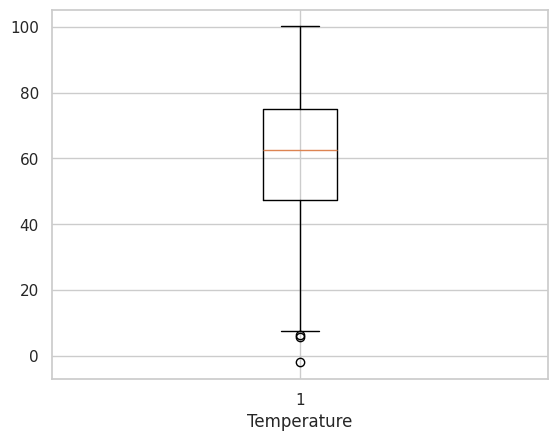

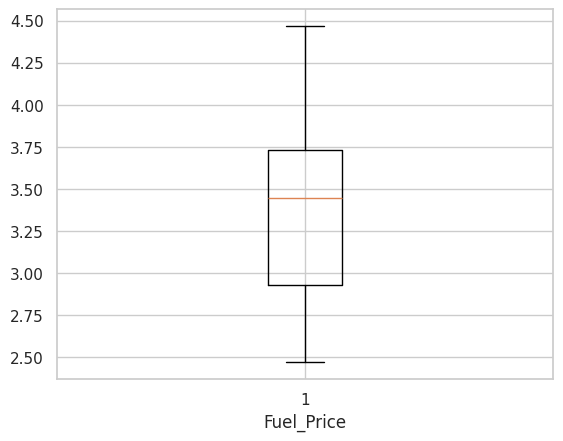

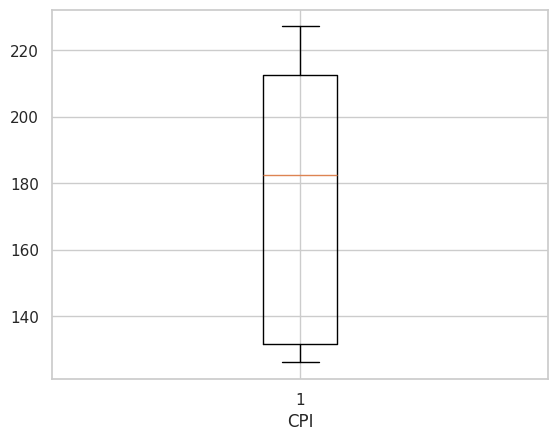

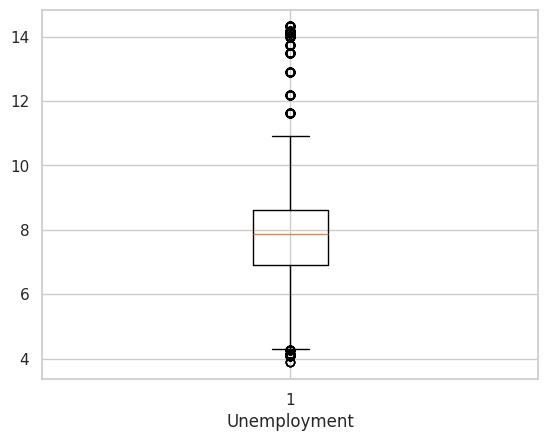

In [815]:
# Outliers

for col in df.columns:
  if df[col].dtype != 'object':
    plt.boxplot(df[col])
    plt.xlabel(col)
    plt.show()

**Outlier Analysis & Decision**

In this dataset, boxplots show several statistical outliers across variables such as **Temperature**, **Unemployment**, **Fuel Price**, and **Weekly Sales**.
However, after interpreting these values with **domain knowledge**, we decide **not to remove any outliers**.
The reasons are:

**1. Temperature Outliers**

Some weekly temperature values fall slightly below 0°F.
This is **not an error**—many U.S. regions naturally experience sub-zero temperatures during winter.

✔ These values reflect **seasonal climate patterns** and must be preserved.

---

**2. Unemployment Outliers**

The unemployment variable shows a few values above 10–14%.
This is realistic because unemployment varies significantly across different U.S. states and economic periods.

✔ These points represent **regional economic differences**, not data errors.

---

**3. Weekly Sales Outliers**

Large sales spikes appear as outliers on boxplots, especially near the end of each year.

These correspond to **holiday seasons** such as:

* Thanksgiving
* Black Friday
* Christmas

✔ These spikes are **important business events** and carry essential seasonal information for forecasting.

---

**4. Fuel Price Outliers**

Fuel prices range from ~2.5 to ~4.5, which is normal due to:

* Regional fuel taxes
* Seasonal price changes
* National oil price fluctuations

✔ No unrealistic values are observed.

---

**Final Decision**

We **retain all outliers** because they represent:

* Real-world climatic variations
* Economic fluctuations
* Seasonal holiday effects
* Retail demand spikes

Removing them would **distort the true behavior of Walmart's weekly sales** and reduce model accuracy.

**Therefore, no outlier removal or winsorization is applied.**

(Winsorization is a statistical technique that involves replacing extreme data values with less extreme ones to reduce the influence of outliers on a dataset)

---

#### Step 2 — Parse Date and set time index

In [816]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [817]:
df.dtypes['Date']

dtype('O')

In [818]:
# preserve raw copy
df_raw = df.copy()

In [819]:
  # to overcome this error

  # time data "19-02-2010" doesn't match format "%m-%d-%Y", at position 2. You might want to try:

  # we use dayfirst=True

# pd.to_datetime(df['Date'])

In [820]:
pd.to_datetime(df['Date'], dayfirst=True, ) # without errors='coerce' will raise error for invalid input

,Date
0,2010-02-05
1,2010-02-12
2,2010-02-19
3,2010-02-26
4,2010-03-05
...,...
6430,2012-09-28
6431,2012-10-05
6432,2012-10-12
6433,2012-10-19


In [821]:
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True, errors='coerce')

print("After parsing, null dates:", df['Date'].isna().sum())

After parsing, null dates: 0


In [822]:
# Drop rows with unparseable dates (if any). IT IS NOT NEEDED AS WE ALREADY CHECKED, for safety we run
if df['Date'].isna().sum() > 0:
    print("Dropping rows with unparseable dates...")
    df = df.dropna(subset=['Date']).copy()

In [823]:
# check if our data is sorted

df.equals(df.sort_values(['Store', 'Date']))

True

In [824]:
(df == (df.sort_values(['Store', 'Date']))).all().all()

np.True_

In [825]:
# is a date repeated for a store
df.duplicated(subset=["Store", "Date"]).sum()

np.int64(0)

In [826]:
# 0 is treated as False. Any non zero (-ve, +ve) treated as True

if not df.duplicated(subset=["Store", "Date"]).sum():
    print("not duplicated")

not duplicated


In [827]:
# Check if sorting or duplicate removal is needed
needs_sorting = not df.equals(df.sort_values(['Store', 'Date']))
num_duplicates = df.duplicated(subset=["Store", "Date"]).sum()

if needs_sorting or num_duplicates > 0:
    print("Sorting and removing duplicates...")

    # Sort
    df = df.sort_values(['Store', 'Date']).reset_index(drop=True)

    # Remove duplicates
    df = df.drop_duplicates(subset=["Store", "Date"]).reset_index(drop=True)

    print("Sorting completed.")
    print("Duplicates removed:", num_duplicates)
    print("New shape:", df.shape)

else:
    print("Data is already clean — no sorting or duplicate removal needed.")

Data is already clean — no sorting or duplicate removal needed.


#### Step 3 — cleaning checks and basic fixes

In [828]:
df.dtypes

,0
Store,int64
Date,datetime64[ns]
Weekly_Sales,float64
Holiday_Flag,int64
Temperature,float64
Fuel_Price,float64
CPI,float64
Unemployment,float64


In [829]:
if df['Store'].dtype != 'int64' or df['Holiday_Flag'].dtype != 'int64' :
    df['Store'] = pd.to_numeric(df['Store'], errors='coerce').astype('Int64')
    df['Holiday_Flag'] = pd.to_numeric(df['Holiday_Flag'], errors='coerce').astype('Int64')
    df['Store', 'Holiday_Flag'] = df['Store', 'Holiday_Flag'].fillna(0)
    print("Types fixed")
else :
    print("Already types are correct")

Already types are correct


In [830]:
for c in ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']:
    if c in df.columns:
        print(f"\n--- {c} ---")
        print("min, max, mean:", df[c].min(), df[c].max(), df[c].mean())
        display(df[c].describe())


--- Weekly_Sales ---
min, max, mean: 209986.25 3818686.45 1046964.8775617715


,Weekly_Sales
count,6.435000e+03
mean,1.046965e+06
std,5.643666e+05
min,2.099862e+05
25%,5.533501e+05
50%,9.607460e+05
75%,1.420159e+06
max,3.818686e+06



--- Temperature ---
min, max, mean: -2.06 100.14 60.66378243978244


,Temperature
count,6435.000000
mean,60.663782
std,18.444933
min,-2.060000
25%,47.460000
50%,62.670000
75%,74.940000
max,100.140000



--- Fuel_Price ---
min, max, mean: 2.472 4.468 3.358606837606838


,Fuel_Price
count,6435.000000
mean,3.358607
std,0.459020
min,2.472000
25%,2.933000
50%,3.445000
75%,3.735000
max,4.468000



--- CPI ---
min, max, mean: 126.064 227.2328068 171.57839384878014


,CPI
count,6435.000000
mean,171.578394
std,39.356712
min,126.064000
25%,131.735000
50%,182.616521
75%,212.743293
max,227.232807



--- Unemployment ---
min, max, mean: 3.879 14.313 7.99915104895105


,Unemployment
count,6435.000000
mean,7.999151
std,1.875885
min,3.879000
25%,6.891000
50%,7.874000
75%,8.622000
max,14.313000


In [831]:
for c in ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']:
    if c in df.columns:
        print(f"\n--- {c} ---")
        print("min, max, mean:", df[c].min(), df[c].max(), df[c].mean())


--- Weekly_Sales ---
min, max, mean: 209986.25 3818686.45 1046964.8775617715

--- Temperature ---
min, max, mean: -2.06 100.14 60.66378243978244

--- Fuel_Price ---
min, max, mean: 2.472 4.468 3.358606837606838

--- CPI ---
min, max, mean: 126.064 227.2328068 171.57839384878014

--- Unemployment ---
min, max, mean: 3.879 14.313 7.99915104895105


**Numeric Summary of Key Variables**

The descriptive statistics for the main numeric variables in the dataset indicate that all values fall within realistic and domain-appropriate ranges.

**Weekly_Sales**

* **Range:** $209,986 → $3,818,686
* **Mean:** ~ $1.05M
* **Insight:**

  * The large spread and high maximum values reflect **holiday season spikes**, which are expected in retail sales data.
  * No negative or zero values are present; therefore, no cleaning is required.

---

**Temperature**

* **Range:** **–2.06°F → 100.14°F**
* **Mean:** ~60.66°F
* **Insight:**

  * Values below freezing are **normal for many U.S. regions** during winter.
  * No unrealistic values (e.g., < –30°F or > 130°F).
  * All values represent natural climatic variation.

---

**Fuel_Price**

* **Range:** **2.47 → 4.47 USD/gallon**
* **Mean:** 3.36
* **Insight:**

  * This aligns with U.S. gasoline prices between 2010–2012.
  * No extreme or impossible values.

---

**CPI (Consumer Price Index)**

* **Range:** **126.06 → 227.23**
* **Mean:** 171.57
* **Insight:**

  * CPI rises steadily during this period (post-recession recovery).
  * The values follow a realistic economic pattern.

---

**Unemployment**

* **Range:** **3.88% → 14.31%**
* **Mean:** 8.00%
* **Insight:**

  * Variation is expected across different U.S. regions.
  * Higher values near 14% align with post-2008 recession recovery trends.
  * No unrealistic values like <0% or >30%.

---

All numeric variables show valid, realistic ranges with no erroneous or physically impossible values.
These statistics confirm that the dataset is **clean, reliable, and ready for further EDA and modeling** without the need for data correction or outlier removal.

---

In [832]:
(df['Weekly_Sales'] <= 0).sum()

np.int64(0)

In [833]:
print("\nRows with Weekly_Sales <= 0:", len(df[df['Weekly_Sales'] <= 0]))


Rows with Weekly_Sales <= 0: 0


In [834]:
# Check numeric ranges and obvious problems
num_cols = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
for c in num_cols:
    if c in df.columns:
        print(f"\n--- {c} ---")
        print("min, max, mean:", df[c].min(), df[c].max(), df[c].mean())
        display(df[c].describe())

# Flag rows with negative or zero Weekly_Sales (if any)
bad_sales = df[df['Weekly_Sales'] <= 0]
print("\nRows with Weekly_Sales <= 0:", len(bad_sales))



--- Weekly_Sales ---
min, max, mean: 209986.25 3818686.45 1046964.8775617715


,Weekly_Sales
count,6.435000e+03
mean,1.046965e+06
std,5.643666e+05
min,2.099862e+05
25%,5.533501e+05
50%,9.607460e+05
75%,1.420159e+06
max,3.818686e+06



--- Temperature ---
min, max, mean: -2.06 100.14 60.66378243978244


,Temperature
count,6435.000000
mean,60.663782
std,18.444933
min,-2.060000
25%,47.460000
50%,62.670000
75%,74.940000
max,100.140000



--- Fuel_Price ---
min, max, mean: 2.472 4.468 3.358606837606838


,Fuel_Price
count,6435.000000
mean,3.358607
std,0.459020
min,2.472000
25%,2.933000
50%,3.445000
75%,3.735000
max,4.468000



--- CPI ---
min, max, mean: 126.064 227.2328068 171.57839384878014


,CPI
count,6435.000000
mean,171.578394
std,39.356712
min,126.064000
25%,131.735000
50%,182.616521
75%,212.743293
max,227.232807



--- Unemployment ---
min, max, mean: 3.879 14.313 7.99915104895105


,Unemployment
count,6435.000000
mean,7.999151
std,1.875885
min,3.879000
25%,6.891000
50%,7.874000
75%,8.622000
max,14.313000



Rows with Weekly_Sales <= 0: 0


#### Step 4: make a grouped DataFrame (store-weekly)

In [835]:
store_weekly = df.pivot(index='Date', columns='Store', values='Weekly_Sales')
print("store_weekly shape:", store_weekly.shape)
store_weekly.iloc[:5, :6] # show first 5 dates, first 6 stores

store_weekly shape: (143, 45)


Store,1,2,3,4,5,6
Date,,,,,,
2010-02-05,1643690.90,2136989.46,461622.22,2135143.87,317173.10,1652635.10
2010-02-12,1641957.44,2137809.50,420728.96,2188307.39,311825.70,1606283.86
2010-02-19,1611968.17,2124451.54,421642.19,2049860.26,303447.57,1567138.07
2010-02-26,1409727.59,1865097.27,407204.86,1925728.84,270281.63,1432953.21
2010-03-05,1554806.68,1991013.13,415202.04,1971057.44,288855.71,1601348.82


In [836]:
store_weekly.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 143 entries, 2010-02-05 to 2012-10-26
Data columns (total 45 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   1       143 non-null    float64
 1   2       143 non-null    float64
 2   3       143 non-null    float64
 3   4       143 non-null    float64
 4   5       143 non-null    float64
 5   6       143 non-null    float64
 6   7       143 non-null    float64
 7   8       143 non-null    float64
 8   9       143 non-null    float64
 9   10      143 non-null    float64
 10  11      143 non-null    float64
 11  12      143 non-null    float64
 12  13      143 non-null    float64
 13  14      143 non-null    float64
 14  15      143 non-null    float64
 15  16      143 non-null    float64
 16  17      143 non-null    float64
 17  18      143 non-null    float64
 18  19      143 non-null    float64
 19  20      143 non-null    float64
 20  21      143 non-null    float64
 21  22      143 non-null

In [837]:
store_weekly.isna().sum().sum()

np.int64(0)

In [838]:
def check_date_continuity(g):
    g = g.sort_values('Date')

    # Detect weekday of the earliest record
    # Monday = 0, Tuesday = 1, ... Sunday = 6
    start_weekday = g['Date'].min().weekday()

    # Create rule like "W-MON", "W-TUE", ... depending on start weekday
    weekday_map = {
        0: "W-MON",
        1: "W-TUE",
        2: "W-WED",
        3: "W-THU",
        4: "W-FRI",
        5: "W-SAT",
        6: "W-SUN"
    }
    weekly_freq = weekday_map[start_weekday]

    # Build continuous weekly date range aligned to correct weekday
    all_dates = pd.date_range(
        start=g['Date'].min(),
        end=g['Date'].max(),
        freq=weekly_freq
    )

    missing = all_dates.difference(g['Date'])

    return pd.Series({
        'start_date': g['Date'].min(),
        'end_date': g['Date'].max(),
        'weekday': g['Date'].min().strftime("%A"),
        'expected_weeks': len(all_dates),
        'actual_weeks': g['Date'].nunique(),
        'missing_weeks': len(missing),
        'missing_dates': list(missing)
    })


In [839]:
dates_for_each_store = (
    df.groupby('Store')
      .apply(check_date_continuity, include_groups=True)
      .reset_index()
)

/tmp/ipython-input-667308548.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(check_date_continuity, include_groups=True)


In [840]:
dates_for_each_store

,Store,start_date,end_date,weekday,expected_weeks,actual_weeks,missing_weeks,missing_dates
0,1,2010-02-05,2012-10-26,Friday,143,143,0,[]
1,2,2010-02-05,2012-10-26,Friday,143,143,0,[]
2,3,2010-02-05,2012-10-26,Friday,143,143,0,[]
3,4,2010-02-05,2012-10-26,Friday,143,143,0,[]
4,5,2010-02-05,2012-10-26,Friday,143,143,0,[]
5,6,2010-02-05,2012-10-26,Friday,143,143,0,[]
6,7,2010-02-05,2012-10-26,Friday,143,143,0,[]
7,8,2010-02-05,2012-10-26,Friday,143,143,0,[]
8,9,2010-02-05,2012-10-26,Friday,143,143,0,[]
9,10,2010-02-05,2012-10-26,Friday,143,143,0,[]


In [841]:
dates_for_each_store['missing_weeks'].sum()

np.int64(0)

In [842]:
overall_minimum_date = df['Date'].min().date()
overall_maximum_date = df['Date'].max().date()

In [843]:
df.groupby('Store').apply(
    lambda g: ((g['Date'].min().date() == overall_minimum_date) and
               (g['Date'].max().date() == overall_maximum_date))
).sum()

/tmp/ipython-input-427503371.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df.groupby('Store').apply(


np.int64(45)

In [844]:
df.groupby('Store').apply(
    lambda g: ((g['Date'].min().date() != overall_minimum_date) or
               (g['Date'].max().date() != overall_maximum_date))
).sum()

/tmp/ipython-input-1456902061.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df.groupby('Store').apply(


np.int64(0)

In [845]:
df['Store'].nunique() == df.groupby('Store').apply(
    lambda g: ((g['Date'].min().date() == overall_minimum_date) and
               (g['Date'].max().date() == overall_maximum_date))
).sum()

/tmp/ipython-input-3542757322.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df['Store'].nunique() == df.groupby('Store').apply(


np.True_

Overall Min and max are same, all stores has no missing weeks within their min and max dates which is overall min and max. So the data has no missing weeks which is shown by store_weekly df with no Nan values

In [846]:
df.shape

(6435, 8)

In [847]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 402.3 KB


## 1. EDA Questions

Provided with the weekly sales data for their various outlets. Use statistical analysis, EDA, outlier analysis, and handle the missing values to come up with various insights

### a. If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most?

Step 1 - Compute Global Correlation

In [413]:
df.corr()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,1.000000e+00,1.577299e-13,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531
Date,1.577299e-13,1.000000e+00,0.006949,-1.328524e-02,0.145357,0.771444,0.077157,-0.248203
Weekly_Sales,-3.353320e-01,6.949360e-03,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,-4.386841e-16,-1.328524e-02,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-2.265908e-02,1.453566e-01,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158
Fuel_Price,6.002295e-02,7.714439e-01,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684
CPI,-2.094919e-01,7.715746e-02,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020
Unemployment,2.235313e-01,-2.482029e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000


In [414]:
df[['Weekly_Sales', 'Unemployment']].corr()

,Weekly_Sales,Unemployment
Weekly_Sales,1.000000,-0.106176
Unemployment,-0.106176,1.000000


In [415]:
# non diagonal value needed

weeklySales_unemployment_globalCorr = df[['Weekly_Sales', 'Unemployment']].corr().iloc[0,1]

In [416]:
weeklySales_unemployment_globalCorr

np.float64(-0.10617608965795235)

In [417]:
df.groupby('Store')[['Weekly_Sales', 'Unemployment']].corr()

Weekly_Sales  Unemployment
Store                                         
1     Weekly_Sales      1.000000     -0.097955
      Unemployment     -0.097955      1.000000
2     Weekly_Sales      1.000000      0.066325
      Unemployment      0.066325      1.000000
3     Weekly_Sales      1.000000     -0.230413
      Unemployment     -0.230413      1.000000
4     Weekly_Sales      1.000000     -0.337015
      Unemployment     -0.337015      1.000000
5     Weekly_Sales      1.000000     -0.207043
      Unemployment     -0.207043      1.000000
6     Weekly_Sales      1.000000      0.044251
      Unemployment      0.044251      1.000000
7     Weekly_Sales      1.000000     -0.165382
      Unemployment     -0.165382      1.000000
8     Weekly_Sales      1.000000     -0.052580
      Unemployment     -0.052580      1.000000
9     Weekly_Sales      1.000000     -0.191534
      Unemployment     -0.191534      1.000000
10    Weekly_Sales      1.000000      0.131908
      Unemployment      0.131908      1.000000
11    Weekly_Sales      1.000000     -0.020339
      Unemployment     -0.020339      1.000000
12    Weekly_Sales      1.000000     -0.009286
      Unemployment     -0.009286      1.000000
13    Weekly_Sales      1.000000     -0.171633
      Unemployment     -0.171633      1.000000
14    Weekly_Sales      1.000000      0.210786
      Unemployment      0.210786      1.000000
15    Weekly_Sales      1.000000      0.078905
      Unemployment      0.078905      1.000000
16    Weekly_Sales      1.000000     -0.070864
      Unemployment     -0.070864      1.000000
17    Weekly_Sales      1.000000     -0.263600
      Unemployment     -0.263600      1.000000
18    Weekly_Sales      1.000000      0.139179
      Unemployment      0.139179      1.000000
19    Weekly_Sales      1.000000      0.101464
      Unemployment      0.101464      1.000000
20    Weekly_Sales      1.000000     -0.095341
      Unemployment     -0.095341      1.000000
21    Weekly_Sales      1.000000      0.218367
      Unemployment      0.218367      1.000000
22    Weekly_Sales      1.000000      0.039043
      Unemployment      0.039043      1.000000
23    Weekly_Sales      1.000000     -0.077169
      Unemployment     -0.077169      1.000000
24    Weekly_Sales      1.000000     -0.012261
      Unemployment     -0.012261      1.000000
25    Weekly_Sales      1.000000     -0.004958
      Unemployment     -0.004958      1.000000
26    Weekly_Sales      1.000000     -0.066899
      Unemployment     -0.066899      1.000000
27    Weekly_Sales      1.000000     -0.014275
      Unemployment     -0.014275      1.000000
28    Weekly_Sales      1.000000      0.136671
      Unemployment      0.136671      1.000000
29    Weekly_Sales      1.000000      0.084682
      Unemployment      0.084682      1.000000
30    Weekly_Sales      1.000000      0.201862
      Unemployment      0.201862      1.000000
31    Weekly_Sales      1.000000     -0.064738
      Unemployment     -0.064738      1.000000
32    Weekly_Sales      1.000000     -0.099455
      Unemployment     -0.099455      1.000000
33    Weekly_Sales      1.000000      0.101175
      Unemployment      0.101175      1.000000
34    Weekly_Sales      1.000000      0.017010
      Unemployment      0.017010      1.000000
35    Weekly_Sales      1.000000      0.483865
      Unemployment      0.483865      1.000000
36    Weekly_Sales      1.000000      0.833734
      Unemployment      0.833734      1.000000
37    Weekly_Sales      1.000000     -0.221287
      Unemployment     -0.221287      1.000000
38    Weekly_Sales      1.000000     -0.785290
      Unemployment     -0.785290      1.000000
39    Weekly_Sales      1.000000     -0.384681
      Unemployment     -0.384681      1.000000
40    Weekly_Sales      1.000000     -0.112528
      Unemployment     -0.112528      1.000000
41    Weekly_Sales      1.000000     -0.350630
      Unemployment     -0.350630      1.000000
42    Weekly_Sales      1.000000     -0.356355
      Unemployment     -0

In [418]:
df.groupby('Store')[['Weekly_Sales', 'Unemployment']].corr().shape

(90, 2)

In [419]:
print(df.groupby('Store')[['Weekly_Sales', 'Unemployment']].corr())

                    Weekly_Sales  Unemployment
Store                                         
1     Weekly_Sales      1.000000     -0.097955
      Unemployment     -0.097955      1.000000
2     Weekly_Sales      1.000000      0.066325
      Unemployment      0.066325      1.000000
3     Weekly_Sales      1.000000     -0.230413
      Unemployment     -0.230413      1.000000
4     Weekly_Sales      1.000000     -0.337015
      Unemployment     -0.337015      1.000000
5     Weekly_Sales      1.000000     -0.207043
      Unemployment     -0.207043      1.000000
6     Weekly_Sales      1.000000      0.044251
      Unemployment      0.044251      1.000000
7     Weekly_Sales      1.000000     -0.165382
      Unemployment     -0.165382      1.000000
8     Weekly_Sales      1.000000     -0.052580
      Unemployment     -0.052580      1.000000
9     Weekly_Sales      1.000000     -0.191534
      Unemployment     -0.191534      1.000000
10    Weekly_Sales      1.000000      0.131908
      Unemplo

In [420]:
df.groupby('Store')[['Weekly_Sales', 'Unemployment']].corr().iloc[0, :] # takes index 1, Weekly_sales

,1
,Weekly_Sales
Weekly_Sales,1.000000
Unemployment,-0.097955


In [421]:
df.groupby('Store')[['Weekly_Sales', 'Unemployment']].corr().iloc[1, :] # takes index 1, Unemployemnt

,1
,Unemployment
Weekly_Sales,-0.097955
Unemployment,1.000000


Each store there will be 2 rows, one with index of store id and "Weekly sales" another with store id and "Unemployment"

So we need to make one jump that is step is 2. start and end is default.

in that we get 2 columns like seen above. so we are selecting starting from 1st row, means Weekly_sales indexed rows. so we need to select -1 for column that is last column

```
                1
            Weekly_Sales
Weekly_Sales	1.000000
Unemployment	-0.097955
```

In [422]:
df.groupby('Store')[['Weekly_Sales', 'Unemployment']].corr().iloc[::2,-1]

,,Unemployment
Store,,
1,Weekly_Sales,-0.097955
2,Weekly_Sales,0.066325
3,Weekly_Sales,-0.230413
4,Weekly_Sales,-0.337015
5,Weekly_Sales,-0.207043
6,Weekly_Sales,0.044251
7,Weekly_Sales,-0.165382
8,Weekly_Sales,-0.052580
9,Weekly_Sales,-0.191534


In [423]:
# the above is multi index we are dropping level 1
# 0 level is store ids , 1 level is "Weely_Sales"

store_corr = (
    df.groupby('Store')[['Weekly_Sales', 'Unemployment']]
      .corr()
      .iloc[::2,-1]  # select correlation between Weekly_Sales & Unemployment
      .droplevel(1)
)

In [424]:
store_corr

,Unemployment
Store,
1,-0.097955
2,0.066325
3,-0.230413
4,-0.337015
5,-0.207043
6,0.044251
7,-0.165382
8,-0.052580
9,-0.191534


In [425]:
store_corr.info() # Series

<class 'pandas.core.series.Series'>
Index: 45 entries, 1 to 45
Series name: Unemployment
Non-Null Count  Dtype  
--------------  -----  
45 non-null     float64
dtypes: float64(1)
memory usage: 720.0 bytes


In [426]:
store_corr.name = "Weekly_Sales Unemployment Correlation"

In [427]:
store_corr

,Weekly_Sales Unemployment Correlation
Store,
1,-0.097955
2,0.066325
3,-0.230413
4,-0.337015
5,-0.207043
6,0.044251
7,-0.165382
8,-0.052580
9,-0.191534


In [428]:
store_corr.sort_values()  # sort values ascending, means most negative

,Weekly_Sales Unemployment Correlation
Store,
38,-0.785290
44,-0.780076
39,-0.384681
42,-0.356355
41,-0.350630
4,-0.337015
17,-0.263600
3,-0.230413
37,-0.221287


In [429]:
store_corr.sort_values().head(10)  # worst affected stores

,Weekly_Sales Unemployment Correlation
Store,
38,-0.785290
44,-0.780076
39,-0.384681
42,-0.356355
41,-0.350630
4,-0.337015
17,-0.263600
3,-0.230413
37,-0.221287


In [430]:
print(store_corr.sort_values().head(10))

Store
38   -0.785290
44   -0.780076
39   -0.384681
42   -0.356355
41   -0.350630
4    -0.337015
17   -0.263600
3    -0.230413
37   -0.221287
5    -0.207043
Name: Weekly_Sales Unemployment Correlation, dtype: float64


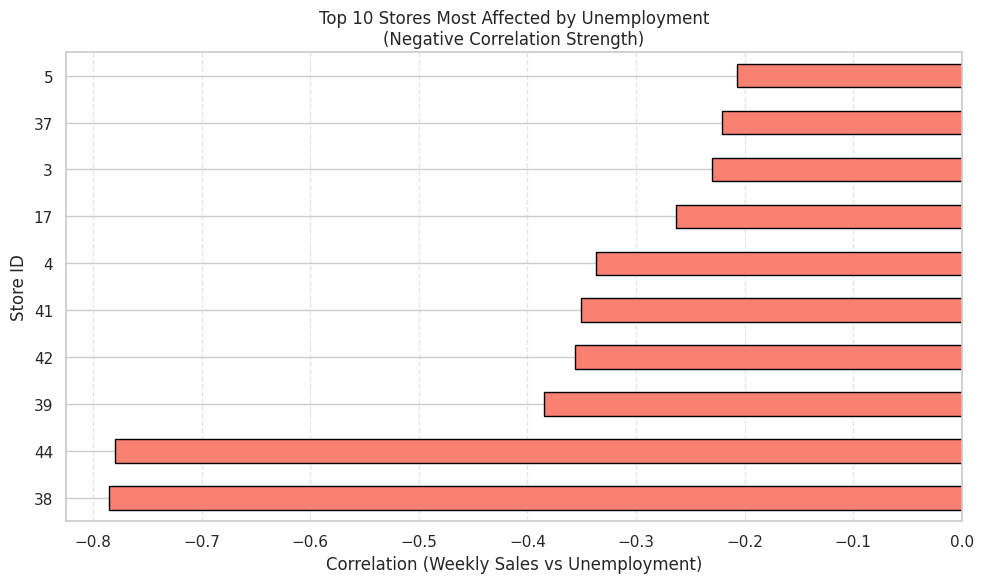

In [431]:
plt.figure(figsize=(10, 6))
store_corr.sort_values().head(10).plot(
    kind='barh',
    color='salmon',
    edgecolor='black'
)

plt.title("Top 10 Stores Most Affected by Unemployment\n(Negative Correlation Strength)")
plt.xlabel("Correlation (Weekly Sales vs Unemployment)")
plt.ylabel("Store ID")
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


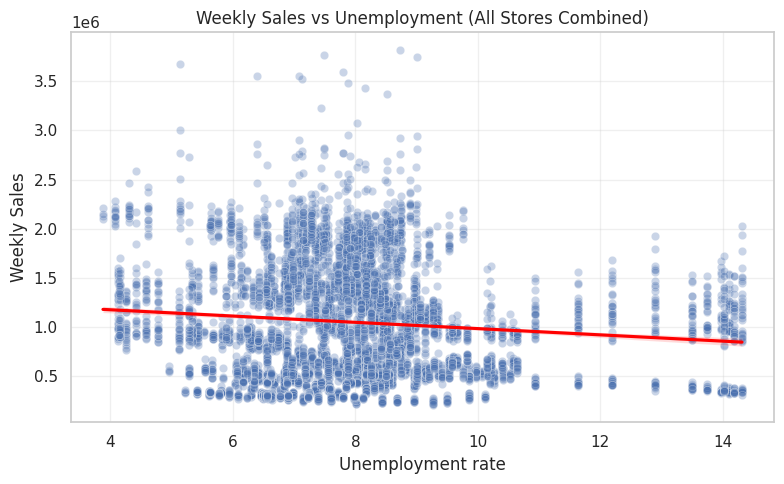

In [432]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='Unemployment', y='Weekly_Sales', data=df, alpha=0.3)

sns.regplot(
    x='Unemployment',
    y='Weekly_Sales',
    data=df,
    scatter=False,
    color='red'
)

plt.title("Weekly Sales vs Unemployment (All Stores Combined)")
plt.xlabel("Unemployment rate")
plt.ylabel("Weekly Sales")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


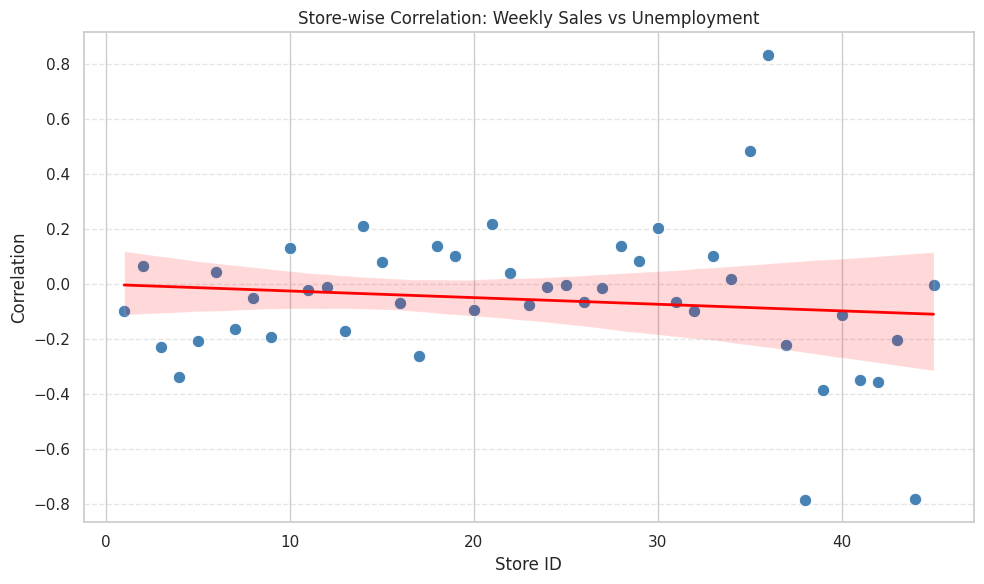

In [433]:
plt.figure(figsize=(10,6))

# Scatter plot: Store ID vs Correlation
sns.scatterplot(
    x=store_corr.index,
    y=store_corr.values,
    s=80,
    color='steelblue'
)

# Regression line (trend)
sns.regplot(
    x=store_corr.index,
    y=store_corr.values,
    scatter=False,
    color='red',
    line_kws={'linewidth':2}
)

plt.title('Store-wise Correlation: Weekly Sales vs Unemployment')
plt.xlabel('Store ID')
plt.ylabel('Correlation')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [434]:
sorted_corr = store_corr.sort_values()

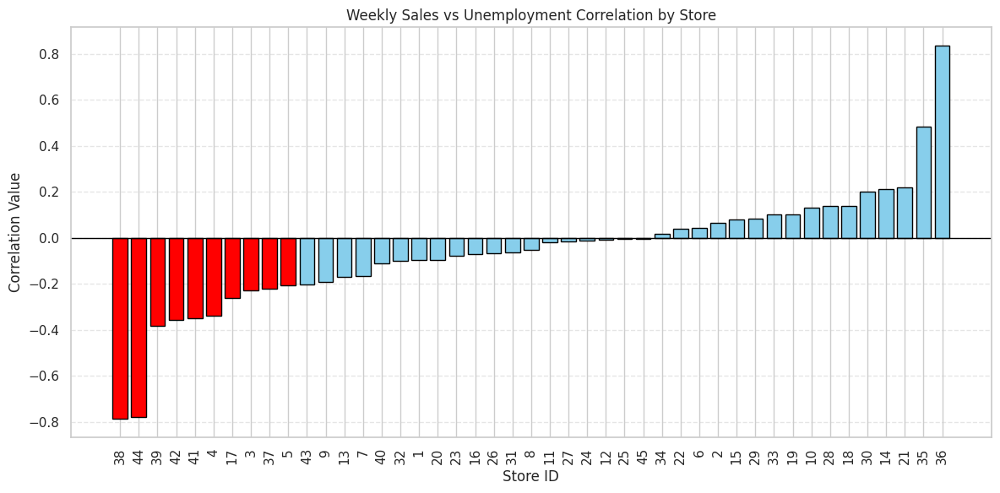

In [435]:
# Color stores suffering the most (top 10 negative)
colors = ['red' if i < 10 else 'skyblue' for i in range(len(sorted_corr))]

plt.figure(figsize=(12,6))
plt.bar(sorted_corr.index.astype(str), sorted_corr.values, color=colors, edgecolor='black')

plt.title("Weekly Sales vs Unemployment Correlation by Store")
plt.xlabel("Store ID")
plt.ylabel("Correlation Value")
plt.axhline(0, color='black', linewidth=1)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [436]:
store_corr.sort_values().head(2)

,Weekly_Sales Unemployment Correlation
Store,
38,-0.785290
44,-0.780076


In [437]:
store_corr.sort_values(ascending=False).head(2)

,Weekly_Sales Unemployment Correlation
Store,
36,0.833734
35,0.483865


**Stores most suffering because of Unemployment are 38 and 44**

**Stores with +ve correlation (benefitted) are 36 and 35**

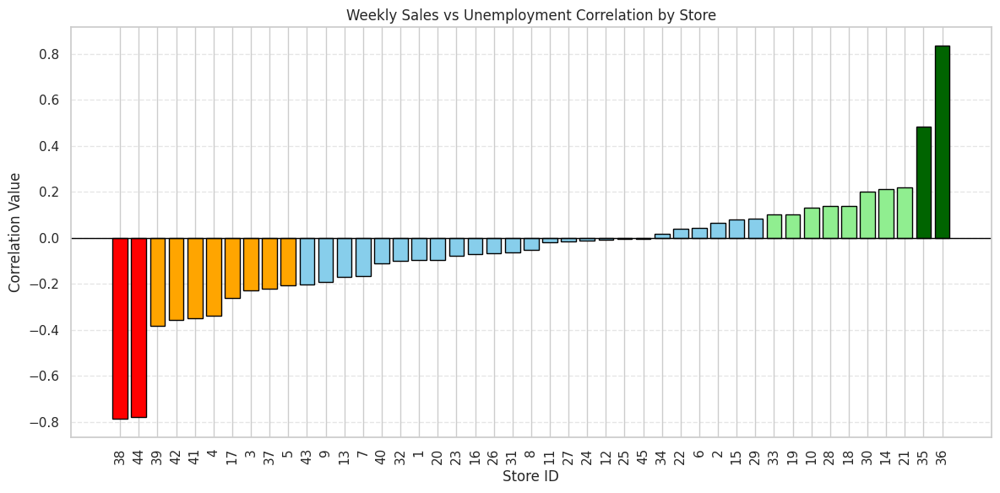

In [438]:
colors = []
n = len(sorted_corr)

# settings
strong_neg = 2         # first 2 (deep negative)
moderate_neg = 10      # first 10 total negative stores
strong_pos = 2         # last 2 (deep positive)
moderate_pos = 10      # total last 10 positive stores

colors = []

for i in range(n):

    # 1. Strong negative (first 2)
    if i < strong_neg:
        colors.append('red')

    # 2. Moderate negative (next 8 → up to total 10)
    elif i < moderate_neg:
        colors.append('orange')

    # 3. Strong positive (last 2)
    elif i >= n - strong_pos:
        colors.append('darkgreen')

    # 4. Moderate positive (previous 3–8 stores in the last 10)
    elif i >= n - moderate_pos:
        colors.append('lightgreen')

    # 5. Neutral middle
    else:
        colors.append('skyblue')


plt.figure(figsize=(12,6))
plt.bar(sorted_corr.index.astype(str), sorted_corr.values, color=colors, edgecolor='black')

plt.title("Weekly Sales vs Unemployment Correlation by Store")
plt.xlabel("Store ID")
plt.ylabel("Correlation Value")
plt.axhline(0, color='black', linewidth=1)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [439]:
top_corr_list = []

In [440]:
# Add strongest negative stores
for store_id, corr_value in sorted_corr.head(2).items():
    top_corr_list.append({
        'store_id': store_id,
        'column': 'Unemployment',
        'correlation': corr_value
    })

# Add strongest positive stores
for store_id, corr_value in sorted_corr.tail(2).items():
    top_corr_list.append({
        'store_id': store_id,
        'column': 'Unemployment',
        'correlation': corr_value
    })


In [441]:
top_corr_list

[{'store_id': 38,
  'column': 'Unemployment',
  'correlation': -0.7852902748572036},
 {'store_id': 44,
  'column': 'Unemployment',
  'correlation': -0.7800764432910212},
 {'store_id': 35,
  'column': 'Unemployment',
  'correlation': 0.48386541981924264},
 {'store_id': 36, 'column': 'Unemployment', 'correlation': 0.8337336178415088}]

###### **Weekly Sales vs Unemployment – Store-Level Impact Analysis**

**Overall Relationship**

The overall Pearson correlation between **Weekly Sales** and **Unemployment** across all stores is:

$\text{Correlation} = -0.106 $

This indicates a **weak negative relationship**.
In general, when unemployment rises, weekly sales tend to **slightly decline**, but the effect is not strong at the aggregate level.
This is expected in a large retail chain (like Walmart), where holiday seasons, promotions, and store size strongly influence sales, often overshadowing unemployment effects.


**Why the Overall Correlation is Weak (≈ –0.106)**

Although some individual stores show **strong negative** correlations (deep red) and others show **strong positive** correlations (dark green), the overall correlation across all stores is still weak. This happens for two main reasons:

1. **Opposing effects cancel each other out**

   * Stores with strong **negative** correlation (e.g., Store 38, 44) pull the overall value downward.
   * Stores with strong **positive** correlation (e.g., Store 35, 36) pull it upward.
   * These opposing forces **neutralize** each other when combined, resulting in a value near zero.

2. **Most stores have correlations close to zero (blue bars)**

   * The majority of stores show **very weak or no relationship** between unemployment and sales.
   * These neutral stores dilute the influence of both the highly negative and highly positive stores.

Because of these two factors, the aggregate correlation across all stores is only mildly negative, even though individual stores reveal strong and meaningful patterns.


---

##### **Store-Level Correlation Analysis**

Although the overall correlation is weak, individual stores behave very differently.

To capture store-specific impact, correlations were computed **per store**, then sorted from most negative to most positive.
The bar chart above highlights five distinct behavioral segments:

##### **1. Strong Negative Correlation (Deep Red – Worst 2 Stores)**

Stores **38** and **44** show the **highest sensitivity** to unemployment:

* Correlation around **–0.78**
* Sales decline sharply when unemployment rises
* These stores are located in regions that appear more economically vulnerable

These are the **stores suffering the most**.

---

##### **2. Moderate Negative Correlation (Orange – Next 8 Stores)**

Stores with moderately negative correlation (e.g., **39, 42, 41, 4, 17…**) show noticeable but not extreme decline in sales during higher unemployment periods.
These stores likely operate in regions where economic conditions influence customer spending more than other factors.

---

##### **3. Neutral or Slight Relationship (Blue – Middle Stores)**

Most stores fall into this category.
Their correlation values are close to **0**, meaning:

* Sales remain stable regardless of unemployment changes
* These stores may be located in economically stable regions
* Seasonality and holidays matter more than economic stress

This is typical for high-volume retail chains.

---

##### **4. Moderate Positive Correlation (Light Green)**

Some stores show **slightly positive correlation**, meaning sales tend to increase when unemployment rises.
Possible reasons:

* These stores may be in areas where people rely more on the retail store during tough times
* Increased demand for low-priced essentials

---

##### **5. Strong Positive Correlation (Dark Green – Best 2 Stores)**

Stores **36** and **35** exhibit the strongest positive correlation (up to **+0.83** by store 36).
These stores behave opposite to the deeply negative ones:

* Their sales rise when unemployment rises
* They may serve low-income regions where retail stores becomes the preferred store during economic downturns
* These stores are **not suffering**; they may be counter-cyclical

---

##### **Conclusion**

* **Overall**, Weekly Sales and Unemployment have only a **weak negative correlation**.
* **At store level**, the effect is far more pronounced:

  * A few stores (38 and 44) are **highly sensitive** to unemployment.
  * Many stores show **moderate to no impact**.
  * A handful of stores (like 36 and 35) show **positive impact**, meaning they may benefit from budget-shopping behavior during unemployment spikes.

This store-level variation is important for the chain of retail stores' strategic planning, regional pricing, and inventory management.

---

###  b. If the weekly sales show a seasonal trend, when and what could be the reason?


#### 1. Plot overall weekly sales across all stores

In [442]:
# how many weeks are there - unique dates

df['Date'].nunique()

143

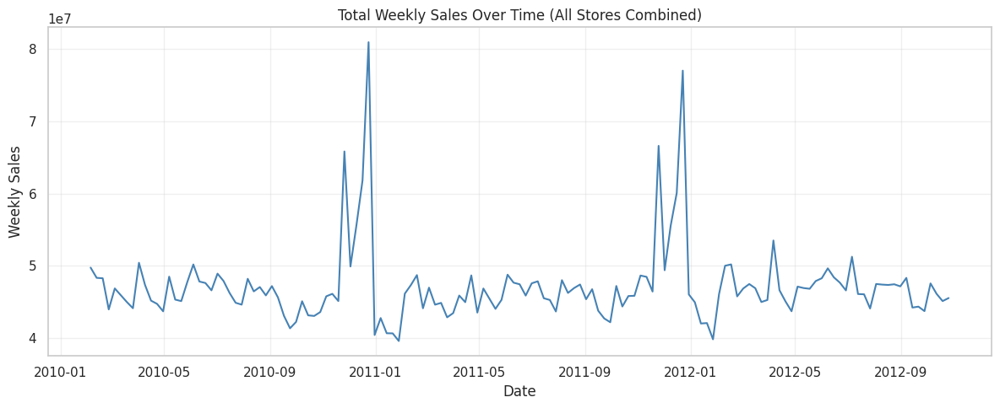

In [443]:
# Aggregate total weekly sales across all stores
weekly_total = df.groupby('Date')['Weekly_Sales'].sum()

plt.figure(figsize=(12,5))
plt.plot(weekly_total.index, weekly_total.values, color='steelblue')
plt.title("Total Weekly Sales Over Time (All Stores Combined)")
plt.xlabel("Date")
plt.ylabel("Weekly Sales")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


#### 2. Seasonal Decomposition (one sample store — Store 1)

In [444]:
from statsmodels.tsa.seasonal import seasonal_decompose

In below cell `plt.suptitle(f"Seasonal Decomposition for Store {store_id}", y=1.02)
`, y controls the vertical position of the figure's main title (the “suptitle”) in figure coordinates.


 Figure coordinates go from 0 at the bottom to 1 at the top, so y=1.02 places the title slightly above the top edge of the figure to avoid overlapping with the subplots


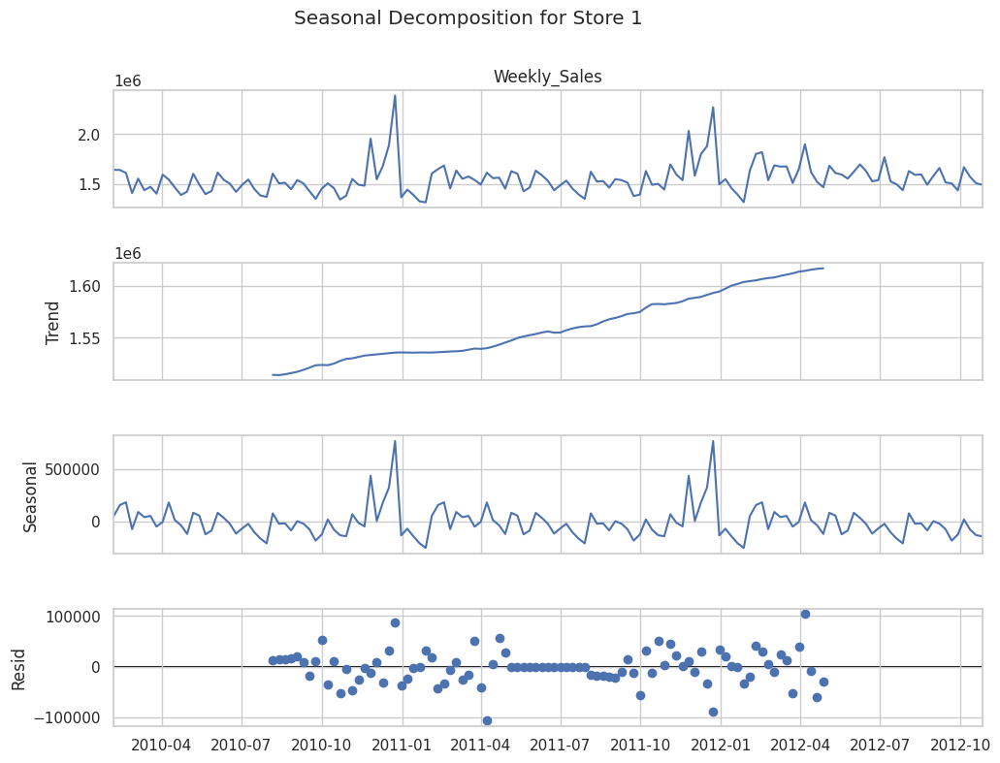

In [445]:
# choose one store for decomposition (Store 1 is typical)
store_id = 1
individual_store_data = df[df['Store'] == store_id].set_index('Date')['Weekly_Sales']

# Ensure date sorted
individual_store_data = individual_store_data.sort_index()

decomp = seasonal_decompose(individual_store_data, model='additive', period=52) # yearly seasonality (52 weeks)

fig = decomp.plot()
fig.set_size_inches(12, 8)
plt.suptitle(f"Seasonal Decomposition for Store {store_id}", y=1.02)
plt.show()

The trend component represents the long-term movement of weekly sales after removing
seasonal effects.

**Seasonal Decomposition – Key Observations for Store 1**

* **Weekly Sales:** Store 1 shows clear repeating peaks around the end of each year, indicating strong seasonality associated with major festive periods and year-end shopping events.

* **Trend:** The trend line shows a **gradual upward movement**, suggesting a slow but steady increase in baseline weekly sales over the years. It means the store's **baseline sales are growing slowly**.

* **Seasonal Component:** The seasonal pattern is highly consistent, with significant spikes occurring at fixed intervals each year. These spikes align with holiday seasons, while non-holiday weeks show smaller fluctuations.

* **Residuals:** Residual values mostly stay within a narrow band around zero, indicating the model captures the trend and seasonality well. No major irregular shocks are observed.

**Overall:** Store 1 exhibits a stable trend with strong annual seasonality driven by holiday-related demand surges.

In [446]:
decomp.seasonal

,seasonal
Date,
2010-02-05,52357.762287
2010-02-12,156391.364691
2010-02-19,182889.268105
2010-02-26,-72996.946799
2010-03-05,90833.297960
...,...
2012-09-28,-124349.358963
2012-10-05,19354.076134
2012-10-12,-76241.578530


In [447]:
decomp.seasonal.isna().sum()

np.int64(0)

**Why `model='additive'`?**

We use an additive decomposition model because the weekly sales data shows
seasonal fluctuations that are roughly constant in magnitude over time.
Holiday peaks increase sales by a similar absolute amount each year, rather than
a fixed percentage, which matches the behavior of an additive model:

$Y(t) = Trend(t) + Seasonal(t) + Residual(t)$

The overall sales trend is stable rather than exponential. Multiplicative
models require strictly positive values and proportional (percentage-based)
seasonality, which does not apply here.

Therefore, `model='additive'` is the correct and most realistic choice here.


#### 3. Average weekly pattern across years (week-of-year plot)

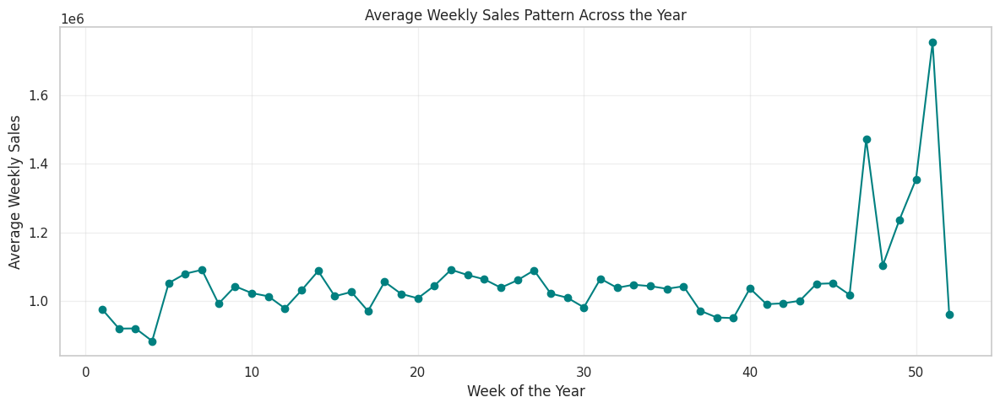

In [448]:
df_with_weekOfYear = df.copy()

# .isocalendar().week  in which week in the year the date falls
# always 1 to 53. rarely 53, not in ours, here we have 1 to 52
df_with_weekOfYear['WeekOfYear'] = df_with_weekOfYear['Date'].dt.isocalendar().week

# avg for a week number over all the given years and over all stores
weekly_average = df_with_weekOfYear.groupby('WeekOfYear')['Weekly_Sales'].mean().sort_index()

plt.figure(figsize=(12,5))
plt.plot(weekly_average.index, weekly_average.values, marker='o', color='teal')
plt.title("Average Weekly Sales Pattern Across the Year")
plt.xlabel("Week of the Year")
plt.ylabel("Average Weekly Sales")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Note: In this dataset, `groupby('WeekOfYear')` automatically returns the
weeks in sorted order (1–52) because GroupBy sorts numeric keys by default.
Therefore, `.sort_index()` is not strictly required here, but it is commonly
used to ensure correct ordering if keys are unsorted or extracted differently.


##### Insights from the Average Weekly Sales Pattern

- Weekly sales stay broadly stable throughout most of the year, averaging between 0.95M and 1.1M.
- Weeks 1–4 show noticeably lower sales, reflecting the expected post-holiday slowdown.
- Sales pick up again from Week 5 onwards and remain steady across the mid-year period.
- A sharp rise begins around Week 47, with the highest levels observed during Weeks 49–51.
- Week 51 shows the annual peak (over 1.7M), representing the strong festive and year-end shopping season.
- This confirms a clear and recurring **seasonal pattern**, with year-end weeks contributing the highest sales.


In [449]:
weekly_average

,Weekly_Sales
WeekOfYear,
1,9.747912e+05
2,9.188529e+05
3,9.192849e+05
4,8.826092e+05
5,1.051774e+06
6,1.079128e+06
7,1.090298e+06
8,9.915995e+05
9,1.042319e+06


In [450]:
df_with_weekOfYear['WeekOfYear'].unique()

<IntegerArray>
[ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42,
 43, 44, 45, 46, 47, 48, 49, 50, 51, 52,  1,  2,  3,  4]
Length: 52, dtype: UInt32

In [451]:
df_with_weekOfYear[df_with_weekOfYear['Store']==1]['WeekOfYear'].value_counts()

,count
WeekOfYear,
5,3
6,3
7,3
8,3
9,3
10,3
11,3
12,3
13,3


**The peak season occurs only 2 times**

From the graph clearly we can see the seasonal trend over last few weeks, that is Festival time, Christmas and before New Year. Also it marks the year end

#### 4. Seasonal decomposition for all stores (aggregated sum)

In [452]:
weekly_total.sort_index(inplace=True)

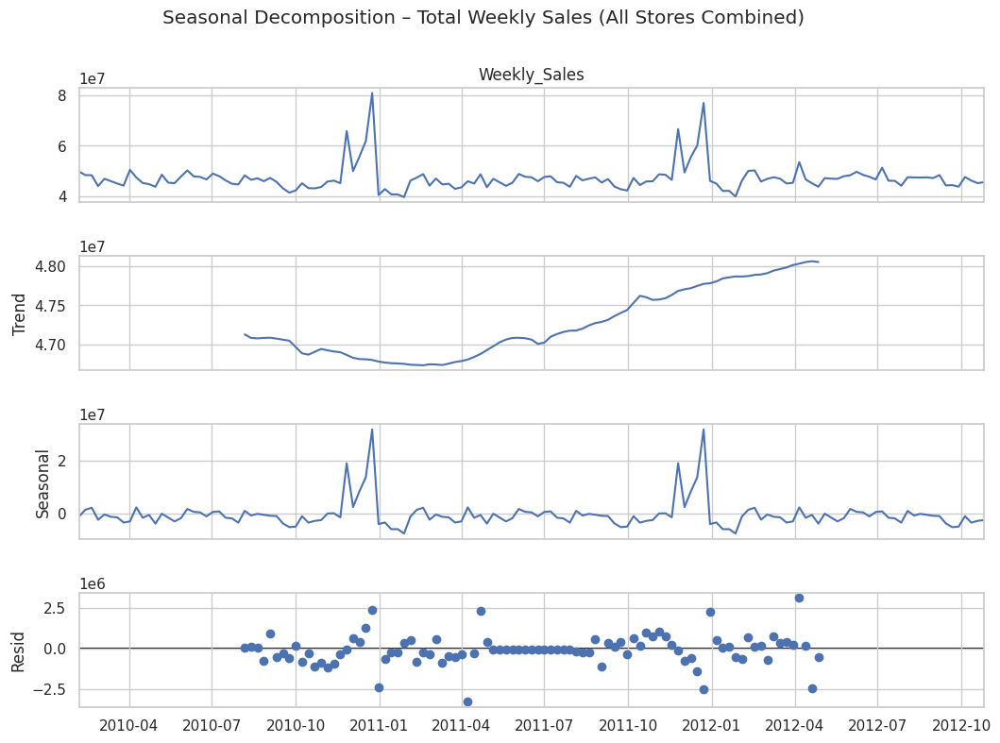

In [453]:
decomp_total = seasonal_decompose(weekly_total, period=52) # model='additive' by default

fig = decomp_total.plot()
fig.set_size_inches(12, 8)
plt.suptitle("Seasonal Decomposition – Total Weekly Sales (All Stores Combined)", y=1.02)
plt.show()

**Seasonal Decomposition – Total Weekly Sales (All Stores Combined)**

* The overall weekly sales series shows clear **repeating spikes** at the end of each year, representing strong seasonal demand during major festive and year-end shopping weeks.
* The **trend component** rises gradually, indicating a slow increase in total sales across the years.
* The **seasonal component** shows a stable, recurring pattern with its highest values in Weeks 49–51, confirming consistent yearly seasonality.
* Immediately after the seasonal peak, sales drop sharply, reflecting the typical **post-holiday decline**.
* The **residuals** remain relatively small and centered around zero, showing that the trend and seasonal patterns explain most of the variation.

---



#### 5. Seasonality in every store

In [454]:
seasonal_patterns = {}

In [455]:
for store_id in df['Store'].unique():
    store_ts = df[df['Store'] == store_id].set_index('Date')['Weekly_Sales'].sort_index()

    # 52 weeks yearly seasonality, default model='additive'
    decomp = seasonal_decompose(store_ts, period=52)

    seasonal_patterns[store_id] = decomp.seasonal

In [456]:
seasonal_patterns

{np.int64(1): Date
 2010-02-05     52357.762287
 2010-02-12    156391.364691
 2010-02-19    182889.268105
 2010-02-26    -72996.946799
 2010-03-05     90833.297960
                   ...      
 2012-09-28   -124349.358963
 2012-10-05     19354.076134
 2012-10-12    -76241.578530
 2012-10-19   -130072.314924
 2012-10-26   -140188.806703
 Name: seasonal, Length: 143, dtype: float64,
 np.int64(2): Date
 2010-02-05     12167.907208
 2010-02-12    215886.036583
 2010-02-19    219303.994612
 2010-02-26    -71713.392119
 2010-03-05     47444.981775
                   ...      
 2012-09-28   -183278.910581
 2012-10-05    -78293.717408
 2012-10-12   -154043.359811
 2012-10-19   -137262.988850
 2012-10-26   -137488.928465
 Name: seasonal, Length: 143, dtype: float64,
 np.int64(3): Date
 2010-02-05    24889.589766
 2010-02-12    44725.869622
 2010-02-19    46544.442506
 2010-02-26      -23.366532
 2010-03-05    44881.259910
                   ...     
 2012-09-28   -32986.094994
 2012-10-05     2

In [457]:
len(seasonal_patterns)

45

In [458]:
len(seasonal_patterns) == df['Store'].nunique()

True

In [459]:
seasonal_patterns[1] # no 0. store id starts from 1

,seasonal
Date,
2010-02-05,52357.762287
2010-02-12,156391.364691
2010-02-19,182889.268105
2010-02-26,-72996.946799
2010-03-05,90833.297960
...,...
2012-09-28,-124349.358963
2012-10-05,19354.076134
2012-10-12,-76241.578530


In [460]:
seasonal_patterns[1].dtype

dtype('float64')

In [461]:
type(seasonal_patterns[1])

pandas.core.series.Series

In [462]:
seasonal_patterns[1].index # Date is undex

DatetimeIndex(['2010-02-05', '2010-02-12', '2010-02-19', '2010-02-26',
               '2010-03-05', '2010-03-12', '2010-03-19', '2010-03-26',
               '2010-04-02', '2010-04-09',
               ...
               '2012-08-24', '2012-08-31', '2012-09-07', '2012-09-14',
               '2012-09-21', '2012-09-28', '2012-10-05', '2012-10-12',
               '2012-10-19', '2012-10-26'],
              dtype='datetime64[ns]', name='Date', length=143, freq=None)

In [463]:
# convert dictionary to dataframe where each column = store's seasonal component
# default orient='columns' means the keys store ids 1,2,3,.. become columns
# Date will remain as index as it is in series for each store
seasonal_df = pd.DataFrame(seasonal_patterns)

# compute correlation matrix
seasonal_corr = seasonal_df.corr()

# compute mean correlation of each store's seasonal pattern with others
# mean is axi=0 by default, mean of each column and in result the column name becomes index
mean_seasonal_correlation = seasonal_corr.mean().sort_values(ascending=False)

mean_seasonal_correlation.head()

,0
2,0.782404
14,0.780080
20,0.777805
13,0.777161
4,0.772997


In [464]:
seasonal_corr # 45x45 matrix 2d

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45
1,1.000000,0.930975,0.907261,0.896308,0.870813,0.852499,0.486927,0.950552,0.933467,0.880181,0.934528,0.896654,0.850085,0.876467,0.800146,0.474980,0.493850,0.836536,0.833229,0.924050,0.802868,0.822086,0.762426,0.781596,0.749133,0.744309,0.724091,0.858403,0.842755,0.566053,0.904157,0.800102,0.341175,0.914460,0.805631,0.306823,0.482501,0.430786,0.801877,0.799399,0.795691,0.422817,0.429371,0.519579,0.867453
2,0.930975,1.000000,0.901963,0.970152,0.871216,0.925969,0.638491,0.973274,0.953272,0.962147,0.971900,0.926286,0.953027,0.929358,0.903825,0.645180,0.535363,0.925108,0.906614,0.968279,0.923947,0.913550,0.875852,0.844444,0.873443,0.790047,0.815257,0.750647,0.927842,0.548897,0.952942,0.915692,0.158654,0.962135,0.875291,0.123062,0.430311,0.198139,0.897449,0.843225,0.878252,0.214815,0.221894,0.529745,0.950271
3,0.907261,0.901963,1.000000,0.874906,0.910300,0.816983,0.498511,0.927821,0.919312,0.899891,0.894574,0.908201,0.816738,0.832316,0.780820,0.439216,0.459202,0.848790,0.778456,0.904408,0.784440,0.806792,0.733523,0.692682,0.764748,0.659785,0.651549,0.862871,0.839653,0.534708,0.866313,0.762559,0.155496,0.882501,0.783348,0.059360,0.475237,0.363361,0.762874,0.735034,0.718799,0.286820,0.213332,0.328038,0.839227
4,0.896308,0.970152,0.874906,1.000000,0.844456,0.885987,0.616792,0.959567,0.929462,0.964402,0.962352,0.901654,0.952166,0.919767,0.898540,0.635982,0.575099,0.906177,0.898144,0.954230,0.918779,0.902820,0.865386,0.828948,0.864684,0.779959,0.806972,0.708778,0.911108,0.564867,0.952721,0.929651,0.110161,0.977256,0.874669,0.132744,0.454377,0.161189,0.904677,0.831591,0.888053,0.182465,0.240555,0.515367,0.930939
5,0.870813,0.871216,0.910300,0.844456,1.000000,0.861009,0.539785,0.891849,0.929731,0.864743,0.856239,0.922987,0.820168,0.844167,0.844379,0.481364,0.519931,0.840102,0.818751,0.863375,0.822118,0.831127,0.771623,0.730646,0.807166,0.679411,0.745666,0.823957,0.888366,0.451351,0.853446,0.794964,0.070020,0.873248,0.867244,0.004548,0.396810,0.273074,0.841216,0.742550,0.782651,0.116793,0.167279,0.378116,0.856577
6,0.852499,0.925969,0.816983,0.885987,0.861009,1.000000,0.720768,0.875079,0.899776,0.881974,0.894781,0.865648,0.924674,0.917149,0.928916,0.708144,0.540679,0.912639,0.874472,0.893043,0.908888,0.907049,0.892008,0.883164,0.894281,0.829429,0.895950,0.698892,0.928536,0.457327,0.885853,0.893498,0.116038,0.885167,0.911355,0.139774,0.235578,0.124571,0.908446,0.876169,0.892309,0.102683,0.159705,0.476937,0.930450
7,0.486927,0.638491,0.498511,0.616792,0.539785,0.720768,1.000000,0.541155,0.519569,0.611550,0.610270,0.560434,0.653756,0.577257,0.654338,0.921597,0.387993,0.582226,0.616231,0.575545,0.670465,0.576574,0.642063,0.697489,0.602372,0.702470,0.652566,0.448863,0.619631,0.154851,0.627153,0.630383,-0.113771,0.576623,0.652350,0.036812,-0.032804,-0.057068,0.674342,0.645247,0.683950,-0.064107,-0.070557,0.255652,0.593404
8,0.950552,0.973274,0.927821,0.959567,0.891849,0.875079,0.541155,1.000000,0.968909,0.949598,0.967023,0.946202,0.921146,0.911582,0.869332,0.545187,0.526335,0.911503,0.882048,0.955097,0.891871,0.890050,0.842073,0.794583,0.827404,0.748645,0.771834,0.800166,0.907678,0.566292,0.943703,0.879924,0.178760,0.954449,0.853101,0.145863,0.519098,0.275708,0.863612,0.814406,0.835521,0.253728,0.268520,0.513412,0.924385
9,0.933467,0.953272,0.919312,0.929462,0.929731,0.899776,0.519569,0.968909,1.000000,0.922157,0.929506,0.945991,0.913726,0.928072,0.903035,0.529819,0.539600,0.926057,0.892973,0.937010,0.896970,0.912747,0.861084,0.813359,0.872064,0.761440,0.814452,0.786946,0.939194,0.528178,0.915035,0.884117,0.124993,0.942724,0.894131,0.072816,0.459319,0.235500,0.885719,0.833423,0.860189,0.165708,0.234499,0.520504,0.942652
10,0.880181,0.962147,0.899891,0.964402,0.864743,0.881974,0.611550,0.949598,0.922157,1.000000,0.962323,0.933102,0.924728,0.883731,0.865739,0.575213,0.477097,0.895107,0.852753,0.932068,0.923031,0.874131,0.83

In [465]:
seasonal_corr[seasonal_corr<1].max() # maximum correlation of each store with ANY OTHER store

,0
1,0.950552
2,0.973274
3,0.927821
4,0.977256
5,0.929731
6,0.930450
7,0.921597
8,0.973274
9,0.968909
10,0.964402


In [466]:
print("Average seasonal correlation across all stores:")
print(mean_seasonal_correlation)

print("\nOverall Mean:", mean_seasonal_correlation.mean())

Average seasonal correlation across all stores:
2     0.782404
14    0.780080
20    0.777805
13    0.777161
4     0.772997
8     0.771957
45    0.770903
29    0.769243
9     0.768427
34    0.768189
31    0.767172
11    0.764981
22    0.760478
15    0.759149
19    0.759011
18    0.757941
32    0.756374
6     0.755872
41    0.754149
1     0.753446
39    0.749499
10    0.745362
35    0.744004
40    0.735924
23    0.734853
21    0.734119
24    0.731655
12    0.728538
25    0.726874
27    0.718830
5     0.710341
3     0.708505
26    0.701979
28    0.625429
16    0.540188
7     0.513737
17    0.513082
44    0.478301
30    0.461076
37    0.359546
43    0.259275
38    0.211083
42    0.207080
33    0.164591
36    0.154725
dtype: float64

Overall Mean: 0.6508074141879601


In [467]:
sum(mean_seasonal_correlation<0.6)/len(mean_seasonal_correlation)

0.24444444444444444

**Seasonal Similarity Across Stores**

The seasonal components of all stores show a strong degree of similarity, with most stores having a seasonal correlation between 0.70 and 0.78 when compared to all others. This indicates that stores share a common seasonal pattern, peaking consistently during the end-of-year festive weeks and dipping sharply in early January.

A few stores have weaker similarity (correlations below 0.40). Only 25% of stores show less than 0.60 correlations.

The overall mean seasonal correlation is ~0.65, confirming that, although sales volumes differ by store, the seasonal timing and shape of the pattern are largely the same across the entire chain.

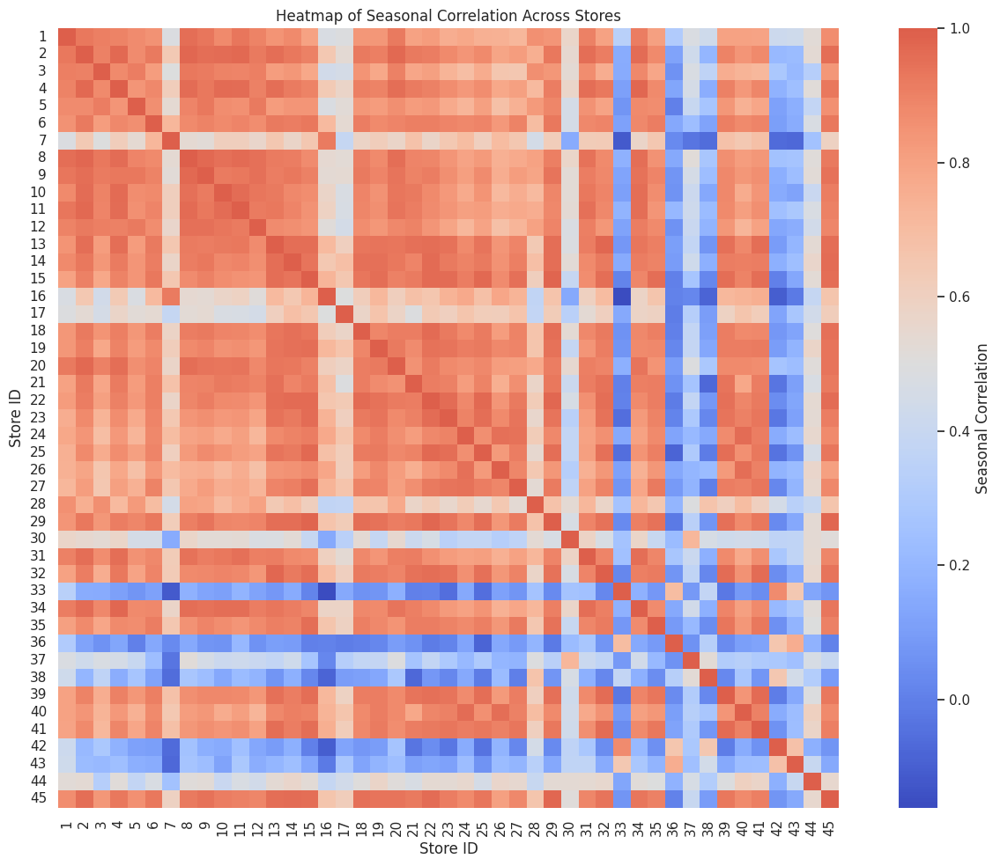

In [468]:
plt.figure(figsize=(14,10))

sns.heatmap(
    seasonal_corr,
    cmap='coolwarm',
    center=0.5,      # center around moderate similarity
    annot=False,
    square=True,
    cbar_kws={'label': 'Seasonal Correlation'}
)

plt.title("Heatmap of Seasonal Correlation Across Stores")
plt.xlabel("Store ID")
plt.ylabel("Store ID")
plt.tight_layout()
plt.show()

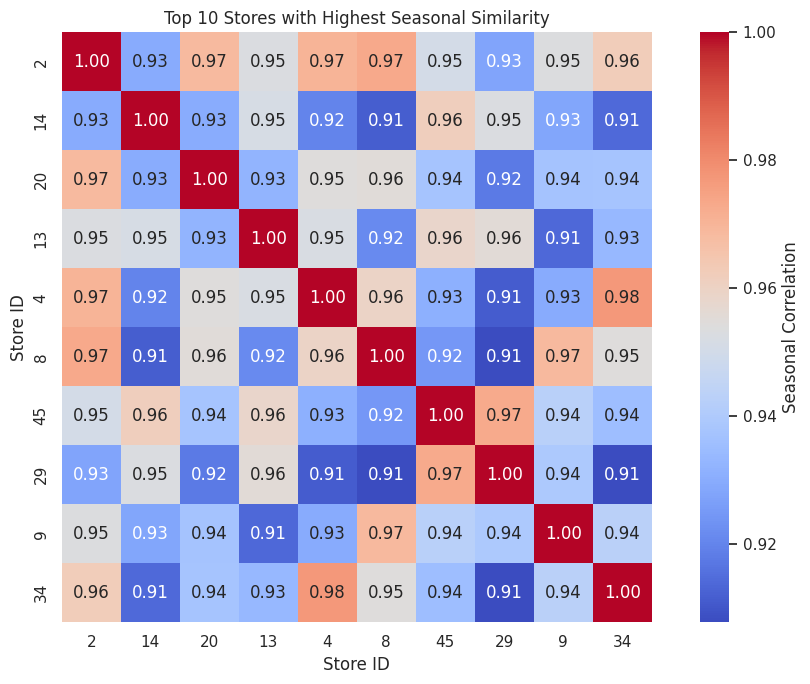

In [469]:
# Select top 10 stores based on seasonal similarity
top10_stores = mean_seasonal_correlation.head(10).index.tolist()

# Slice the correlation matrix for these 10 stores
top10_corr = seasonal_corr.loc[top10_stores, top10_stores]

# Plot heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(
    top10_corr,
    cmap='coolwarm',
    annot=True,
    fmt=".2f",
    square=True,
    cbar_kws={'label': 'Seasonal Correlation'}
)

plt.title("Top 10 Stores with Highest Seasonal Similarity")
plt.xlabel("Store ID")
plt.ylabel("Store ID")
plt.tight_layout()
plt.show()


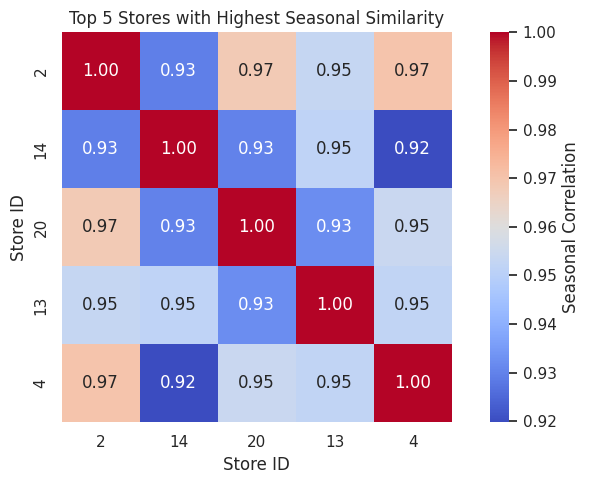

In [470]:
# Select top 5 stores based on seasonal similarity
top5_stores = mean_seasonal_correlation.head(5).index.tolist()

# Slice the correlation matrix for these 5 stores
top5_corr = seasonal_corr.loc[top5_stores, top5_stores]

# Plot heatmap
plt.figure(figsize=(8, 5))
sns.heatmap(
    top5_corr,
    cmap='coolwarm',
    annot=True,
    fmt=".2f",
    square=True,
    cbar_kws={'label': 'Seasonal Correlation'}
)

plt.title("Top 5 Stores with Highest Seasonal Similarity")
plt.xlabel("Store ID")
plt.ylabel("Store ID")
plt.tight_layout()
plt.show()


Seasonality Analysis – Do Weekly Sales Show a Seasonal Trend?

**Yes — the weekly sales clearly show a strong and recurring seasonal trend.**

The time-series plots and seasonal decomposition reveal the following patterns:

---

##### **1. Sales spike sharply in the final weeks of every year**

Across all stores, weekly sales rise dramatically during:

* **Week 47–52**
* Late November and December
* The period leading up to major holidays

These weeks correspond to:

* Thanksgiving
* End-of-year holiday period
* Seasonal shopping events (e.g., festive discounts, year-end promotions)

This pattern repeats consistently each year, confirming a **strong annual seasonal effect**.

---

##### **2. Sales drop immediately after the holiday season**

Right after the peak weeks (Week 1–3 of the next year), sales fall sharply.
This post-holiday decline is seen consistently in:

* the aggregated sales plot
* store-level seasonal decomposition
* week-of-year average patterns

---

##### **3. Mid-year weeks show relatively stable or moderate sales**

Between Week 10 and Week 40, sales stay fairly stable with smaller fluctuations.
This indicates **normal weekly operations** without major seasonal events.

---

##### **4. Seasonal decomposition confirms the trend**

The decomposition plot clearly separates:

* **Trend:** Long-term movement
* **Seasonal:** Strong recurring holiday peaks
* **Residual:** Remaining irregular patterns

The **seasonal component** shows a consistent wave pattern repeating every year, with major peaks during November–December.

---

##### **Conclusion**

Weekly sales exhibit **clear, strong, and predictable seasonality**:

* **When:**

  * Highest in the last weeks of the year (Nov–Dec)
  * Lowest in early January

* **Why:**

  * These periods align with **major holiday shopping seasons**, festive demand, and promotional events, which significantly increase customer purchases.
  * The early-year dip occurs because customers reduce spending after the holiday season, commonly known as the **post-festive slowdown**, when budgets are tight and non-essential shopping declines.

This seasonal structure is important for forecasting, inventory planning, and resource allocation across stores.

---

###  c. Does temperature affect the weekly sales in any manner?

Step 1 - Compute Global Correlation

In [471]:
df.corr()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,1.000000e+00,1.577299e-13,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531
Date,1.577299e-13,1.000000e+00,0.006949,-1.328524e-02,0.145357,0.771444,0.077157,-0.248203
Weekly_Sales,-3.353320e-01,6.949360e-03,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,-4.386841e-16,-1.328524e-02,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-2.265908e-02,1.453566e-01,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158
Fuel_Price,6.002295e-02,7.714439e-01,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684
CPI,-2.094919e-01,7.715746e-02,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020
Unemployment,2.235313e-01,-2.482029e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000


In [472]:
df[['Weekly_Sales', 'Temperature']].corr()

,Weekly_Sales,Temperature
Weekly_Sales,1.00000,-0.06381
Temperature,-0.06381,1.00000


In [473]:
# non diagonal value needed

weeklySales_temp_globalCorr = df[['Weekly_Sales', 'Temperature']].corr().iloc[0,1]

In [474]:
weeklySales_temp_globalCorr

np.float64(-0.06381001317946852)

In [475]:
df.groupby('Store')[['Weekly_Sales', 'Temperature']].corr()

Weekly_Sales  Temperature
Store                                        
1     Weekly_Sales      1.000000    -0.222701
      Temperature      -0.222701     1.000000
2     Weekly_Sales      1.000000    -0.297673
      Temperature      -0.297673     1.000000
3     Weekly_Sales      1.000000    -0.377524
      Temperature      -0.377524     1.000000
4     Weekly_Sales      1.000000    -0.225583
      Temperature      -0.225583     1.000000
5     Weekly_Sales      1.000000    -0.175517
      Temperature      -0.175517     1.000000
6     Weekly_Sales      1.000000    -0.084863
      Temperature      -0.084863     1.000000
7     Weekly_Sales      1.000000     0.015077
      Temperature       0.015077     1.000000
8     Weekly_Sales      1.000000    -0.312324
      Temperature      -0.312324     1.000000
9     Weekly_Sales      1.000000    -0.208343
      Temperature      -0.208343     1.000000
10    Weekly_Sales      1.000000    -0.432569
      Temperature      -0.432569     1.000000
11    Weekly_Sales      1.000000    -0.278503
      Temperature      -0.278503     1.000000
12    Weekly_Sales      1.000000    -0.379416
      Temperature      -0.379416     1.000000
13    Weekly_Sales      1.000000    -0.137746
      Temperature      -0.137746     1.000000
14    Weekly_Sales      1.000000    -0.199851
      Temperature      -0.199851     1.000000
15    Weekly_Sales      1.000000    -0.050541
      Temperature      -0.050541     1.000000
16    Weekly_Sales      1.000000     0.182948
      Temperature       0.182948     1.000000
17    Weekly_Sales      1.000000     0.081012
      Temperature       0.081012     1.000000
18    Weekly_Sales      1.000000    -0.144278
      Temperature      -0.144278     1.000000
19    Weekly_Sales      1.000000    -0.080805
      Temperature      -0.080805     1.000000
20    Weekly_Sales      1.000000    -0.264983
      Temperature      -0.264983     1.000000
21    Weekly_Sales      1.000000    -0.177084
      Temperature      -0.177084     1.000000
22    Weekly_Sales      1.000000    -0.082892
      Temperature      -0.082892     1.000000
23    Weekly_Sales      1.000000     0.056257
      Temperature       0.056257     1.000000
24    Weekly_Sales      1.000000     0.111833
      Temperature       0.111833     1.000000
25    Weekly_Sales      1.000000    -0.031311
      Temperature      -0.031311     1.000000
26    Weekly_Sales      1.000000     0.211722
      Temperature       0.211722     1.000000
27    Weekly_Sales      1.000000     0.121809
      Temperature       0.121809     1.000000
28    Weekly_Sales      1.000000    -0.376506
      Temperature      -0.376506     1.000000
29    Weekly_Sales      1.000000    -0.129144
      Temperature      -0.129144     1.000000
30    Weekly_Sales      1.000000    -0.330816
      Temperature      -0.330816     1.000000
31    Weekly_Sales      1.000000    -0.262192
      Temperature      -0.262192     1.000000
32    Weekly_Sales      1.000000    -0.111681
      Temperature      -0.111681     1.000000
33    Weekly_Sales      1.000000     0.019244
      Temperature       0.019244     1.000000
34    Weekly_Sales      1.000000    -0.278523
      Temperature      -0.278523     1.000000
35    Weekly_Sales      1.000000     0.043392
      Temperature       0.043392     1.000000
36    Weekly_Sales      1.000000    -0.094454
      Temperature      -0.094454     1.000000
37    Weekly_Sales      1.000000    -0.300493
      Temperature      -0.300493     1.000000
38    Weekly_Sales      1.000000     0.032993
      Temperature       0.032993     1.000000
39    Weekly_Sales      1.000000     0.064738
      Temperature       0.064738     1.000000
40    Weekly_Sales      1.000000     0.090598
      Temperature       0.090598     1.000000
41    Weekly_Sales      1.000000     0.106761
      Temperature       0.106761     1.000000
42    Weekly_Sales      1.000000    -0.151639
      Temperature      -0.151639     1.000000
43    Weekly_Sales      1.000000     0.095272
      Temperature 

NOTE : These steps are followed in Correlation between Weekly_sales and Unemployment

In [476]:
# the above is multi index we are dropping level 1
# 0 level is store ids , 1 level is "Weely_Sales"

store_sales_temp_corr = (
    df.groupby('Store')[['Weekly_Sales', 'Temperature']]
      .corr()
      .iloc[::2,-1]  # select correlation between Weekly_Sales & Temperature
      .droplevel(1)  # drop unwanted level
)

In [477]:
store_sales_temp_corr

,Temperature
Store,
1,-0.222701
2,-0.297673
3,-0.377524
4,-0.225583
5,-0.175517
6,-0.084863
7,0.015077
8,-0.312324
9,-0.208343


In [478]:
store_sales_temp_corr.info() # Series

<class 'pandas.core.series.Series'>
Index: 45 entries, 1 to 45
Series name: Temperature
Non-Null Count  Dtype  
--------------  -----  
45 non-null     float64
dtypes: float64(1)
memory usage: 720.0 bytes


In [479]:
store_sales_temp_corr.name = "Weekly_Sales Temperature Correlation"

In [480]:
store_sales_temp_corr

,Weekly_Sales Temperature Correlation
Store,
1,-0.222701
2,-0.297673
3,-0.377524
4,-0.225583
5,-0.175517
6,-0.084863
7,0.015077
8,-0.312324
9,-0.208343


In [481]:
store_sales_temp_corr.sort_values(inplace=True)  # sort values ascending, means most negative

In [482]:
store_sales_temp_corr.head(10)  # strong negative correlation

,Weekly_Sales Temperature Correlation
Store,
10,-0.432569
12,-0.379416
3,-0.377524
28,-0.376506
30,-0.330816
8,-0.312324
37,-0.300493
2,-0.297673
34,-0.278523


In [483]:
store_sales_temp_corr.tail(10)  # strong positive correlation

,Weekly_Sales Temperature Correlation
Store,
39,0.064738
17,0.081012
40,0.090598
43,0.095272
41,0.106761
24,0.111833
27,0.121809
16,0.182948
26,0.211722


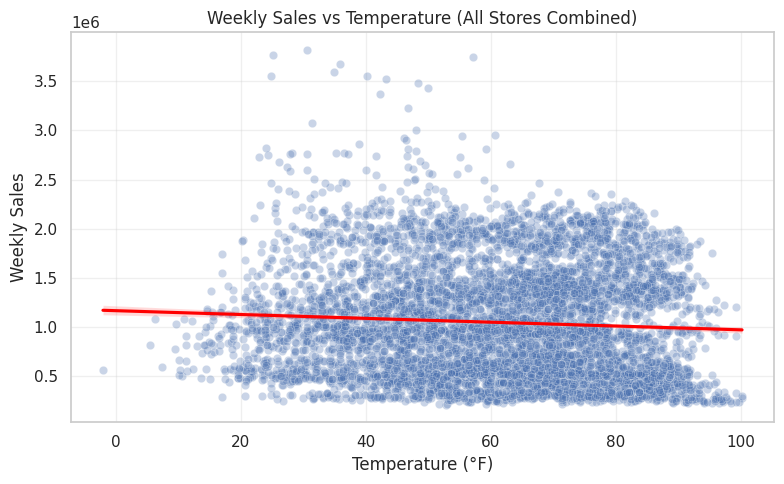

In [484]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='Temperature', y='Weekly_Sales', data=df, alpha=0.3)

sns.regplot(
    x='Temperature',
    y='Weekly_Sales',
    data=df,
    scatter=False,
    color='red'
)

plt.title("Weekly Sales vs Temperature (All Stores Combined)")
plt.xlabel("Temperature (°F)")
plt.ylabel("Weekly Sales")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


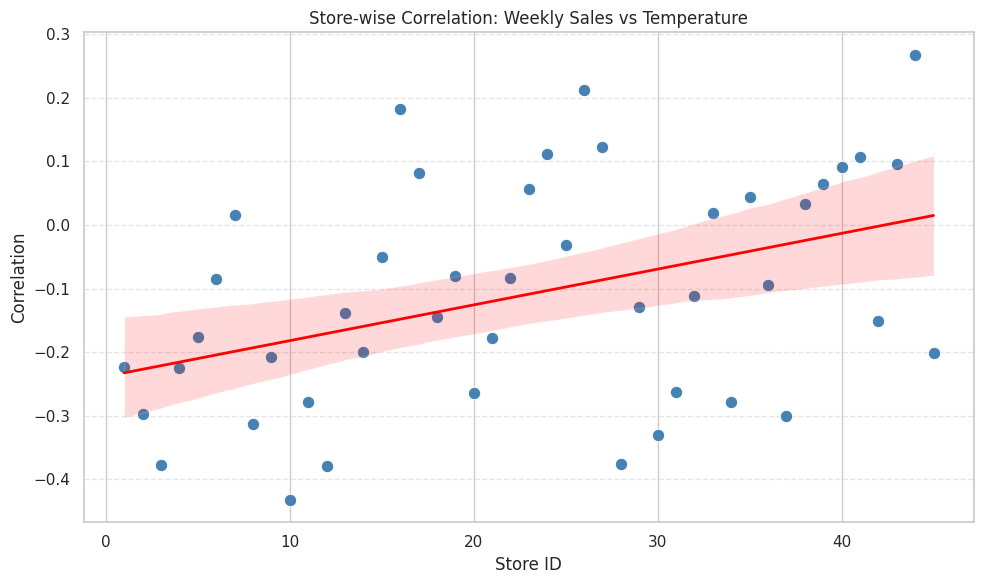

In [485]:
plt.figure(figsize=(10,6))

# Scatter plot: Store ID vs Correlation
sns.scatterplot(
    x=store_sales_temp_corr.index,
    y=store_sales_temp_corr.values,
    s=80,
    color='steelblue'
)

# Regression line (trend)
sns.regplot(
    x=store_sales_temp_corr.index,
    y=store_sales_temp_corr.values,
    scatter=False,
    color='red',
    line_kws={'linewidth':2}
)

plt.title('Store-wise Correlation: Weekly Sales vs Temperature')
plt.xlabel('Store ID')
plt.ylabel('Correlation')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

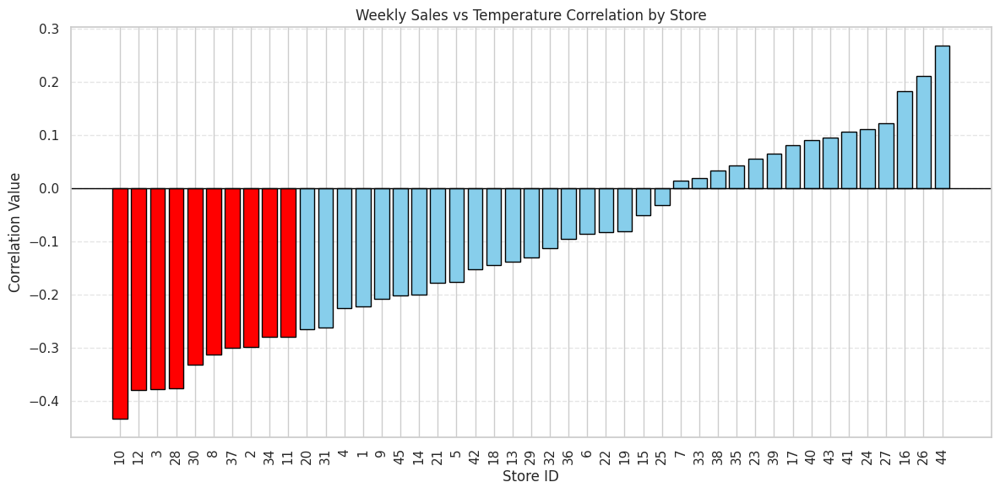

In [486]:
colors = ['red' if i < 10 else 'skyblue' for i in range(len(store_sales_temp_corr))]

plt.figure(figsize=(12,6))
plt.bar(store_sales_temp_corr.index.astype(str), store_sales_temp_corr.values, color=colors, edgecolor='black')

plt.title("Weekly Sales vs Temperature Correlation by Store")
plt.xlabel("Store ID")
plt.ylabel("Correlation Value")
plt.axhline(0, color='black', linewidth=1)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


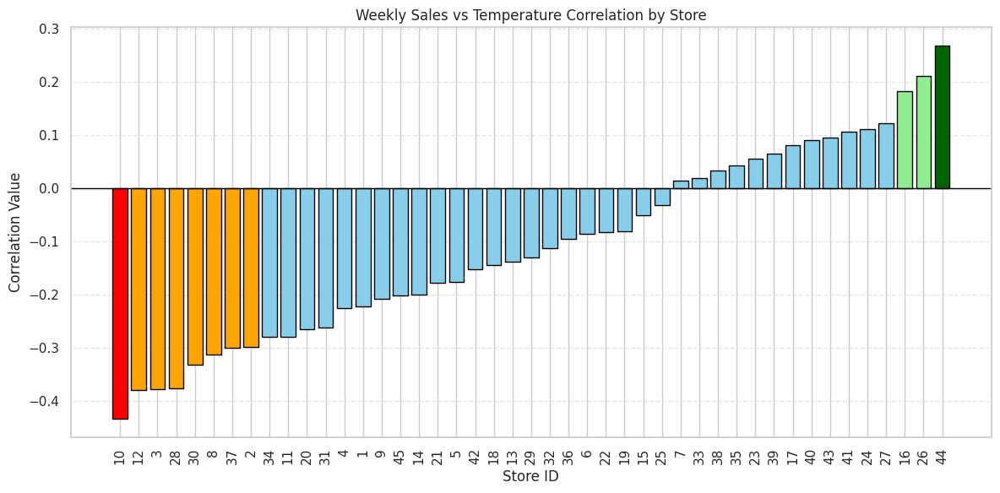

In [487]:
colors = []
n = len(store_sales_temp_corr)

# settings
strong_neg = 1
moderate_neg = 8
strong_pos = 1
moderate_pos = 3

colors = []

for i in range(n):

    # 1. Strong negative (first 2)
    if i < strong_neg:
        colors.append('red')

    # 2. Moderate negative (next 8 → up to total 10)
    elif i < moderate_neg:
        colors.append('orange')

    # 3. Strong positive (last 2)
    elif i >= n - strong_pos:
        colors.append('darkgreen')

    # 4. Moderate positive (previous 3–8 stores in the last 10)
    elif i >= n - moderate_pos:
        colors.append('lightgreen')

    # 5. Neutral middle
    else:
        colors.append('skyblue')

plt.figure(figsize=(12,6))
plt.bar(store_sales_temp_corr.index.astype(str), store_sales_temp_corr.values, color=colors, edgecolor='black')

plt.title("Weekly Sales vs Temperature Correlation by Store")
plt.xlabel("Store ID")
plt.ylabel("Correlation Value")
plt.axhline(0, color='black', linewidth=1)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


**Temperature vs Weekly Sales – Interpretation**

The correlation between weekly sales and temperature is weak (-0.06), indicating that
temperature alone does not strongly influence weekly sales patterns. Store-level
correlations also vary, but most stores show values close to zero, suggesting that
sales remain relatively stable regardless of temperature changes.

The scatter plot shows a nearly flat trend line, confirming that sales remain stable across different temperature ranges.
A slight negative trend is visible in the scatter plot, likely because cooler
periods often coincide with high-demand festive weeks. However, temperature itself
is not the cause of increased sales; it is the holiday season aligned with colder
months that drives the spike.

Overall, temperature has **minimal direct impact** on weekly sales, and any observed
association is largely due to overlapping seasonality rather than temperature-driven demand.


Temperature shows a very weak negative correlation with weekly sales, so there is no strong evidence that it meaningfully drive sales; other factors like holidays and promotions are likely much more important.


The overall correlation is –0.06, indicating a very weak negative relationship, meaning
temperature has almost no direct effect on weekly sales.

###  d. How is the Consumer Price index affecting the weekly sales of various stores?


#### Step 1 - Compute Global Correlation

In [488]:
df.corr()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,1.000000e+00,1.577299e-13,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531
Date,1.577299e-13,1.000000e+00,0.006949,-1.328524e-02,0.145357,0.771444,0.077157,-0.248203
Weekly_Sales,-3.353320e-01,6.949360e-03,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,-4.386841e-16,-1.328524e-02,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-2.265908e-02,1.453566e-01,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158
Fuel_Price,6.002295e-02,7.714439e-01,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684
CPI,-2.094919e-01,7.715746e-02,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020
Unemployment,2.235313e-01,-2.482029e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000


In [489]:
df[['Weekly_Sales', 'CPI']].corr()

,Weekly_Sales,CPI
Weekly_Sales,1.000000,-0.072634
CPI,-0.072634,1.000000


In [490]:
# non diagonal value needed

weeklySales_CPI_globalCorr = df[['Weekly_Sales', 'CPI']].corr().iloc[0,1]

In [491]:
weeklySales_CPI_globalCorr

np.float64(-0.07263416204017413)

In [492]:
df.groupby('Store')[['Weekly_Sales', 'CPI']].corr()

Weekly_Sales       CPI
Store                                     
1     Weekly_Sales      1.000000  0.225408
      CPI               0.225408  1.000000
2     Weekly_Sales      1.000000 -0.062431
      CPI              -0.062431  1.000000
3     Weekly_Sales      1.000000  0.317250
      CPI               0.317250  1.000000
4     Weekly_Sales      1.000000  0.351157
      CPI               0.351157  1.000000
5     Weekly_Sales      1.000000  0.308261
      CPI               0.308261  1.000000
6     Weekly_Sales      1.000000 -0.011357
      CPI              -0.011357  1.000000
7     Weekly_Sales      1.000000  0.289044
      CPI               0.289044  1.000000
8     Weekly_Sales      1.000000  0.120255
      CPI               0.120255  1.000000
9     Weekly_Sales      1.000000  0.294805
      CPI               0.294805  1.000000
10    Weekly_Sales      1.000000 -0.115374
      CPI              -0.115374  1.000000
11    Weekly_Sales      1.000000  0.069781
      CPI               0.069781  1.000000
12    Weekly_Sales      1.000000  0.084087
      CPI               0.084087  1.000000
13    Weekly_Sales      1.000000  0.163976
      CPI               0.163976  1.000000
14    Weekly_Sales      1.000000 -0.419755
      CPI              -0.419755  1.000000
15    Weekly_Sales      1.000000 -0.174467
      CPI              -0.174467  1.000000
16    Weekly_Sales      1.000000  0.124285
      CPI               0.124285  1.000000
17    Weekly_Sales      1.000000  0.348571
      CPI               0.348571  1.000000
18    Weekly_Sales      1.000000 -0.193541
      CPI              -0.193541  1.000000
19    Weekly_Sales      1.000000 -0.155341
      CPI              -0.155341  1.000000
20    Weekly_Sales      1.000000  0.058706
      CPI               0.058706  1.000000
21    Weekly_Sales      1.000000 -0.163649
      CPI              -0.163649  1.000000
22    Weekly_Sales      1.000000 -0.038602
      CPI              -0.038602  1.000000
23    Weekly_Sales      1.000000  0.084248
      CPI               0.084248  1.000000
24    Weekly_Sales      1.000000 -0.013684
      CPI              -0.013684  1.000000
25    Weekly_Sales      1.000000 -0.010914
      CPI              -0.010914  1.000000
26    Weekly_Sales      1.000000  0.131980
      CPI               0.131980  1.000000
27    Weekly_Sales      1.000000 -0.213082
      CPI              -0.213082  1.000000
28    Weekly_Sales      1.000000 -0.095908
      CPI              -0.095908  1.000000
29    Weekly_Sales      1.000000 -0.072530
      CPI              -0.072530  1.000000
30    Weekly_Sales      1.000000 -0.298188
      CPI              -0.298188  1.000000
31    Weekly_Sales      1.000000  0.132887
      CPI               0.132887  1.000000
32    Weekly_Sales      1.000000  0.196782
      CPI               0.196782  1.000000
33    Weekly_Sales      1.000000 -0.052271
      CPI              -0.052271  1.000000
34    Weekly_Sales      1.000000  0.115437
      CPI               0.115437  1.000000
35    Weekly_Sales      1.000000 -0.424107
      CPI              -0.424107  1.000000
36    Weekly_Sales      1.000000 -0.915095
      CPI              -0.915095  1.000000
37    Weekly_Sales      1.000000  0.244507
      CPI               0.244507  1.000000
38    Weekly_Sales      1.000000  0.812837
      CPI               0.812837  1.000000
39    Weekly_Sales      1.000000  0.428043
      CPI               0.428043  1.000000
40    Weekly_Sales      1.000000  0.113318
      CPI               0.113318  1.000000
41    Weekly_Sales      1.000000  0.392293
      CPI               0.392293  1.000000
42    Weekly_Sales      1.000000  0.360859
      CPI               0.360859  1.000000
43    Weekly_Sales      1.000000 -0.285686
      CPI              -0.285686  1.000000
44    Weekly_Sales      1.000000  0.740150
      CPI               0.740150  1.000000
45    Weekly_Sales      1.000000 -0.023548
      CPI              -0.023548  1.000000

NOTE : These steps are followed in Correlation between Weekly_sales and Unemployment

In [493]:
# the above is multi index we are dropping level 1
# 0 level is store ids , 1 level is "Weely_Sales"

store_sales_CPI_corr = (
    df.groupby('Store')[['Weekly_Sales', 'CPI']]
      .corr()
      .iloc[::2,-1]  # select correlation between Weekly_Sales & Temperature
      .droplevel(1)  # drop unwanted level
)

In [494]:
store_sales_CPI_corr

,CPI
Store,
1,0.225408
2,-0.062431
3,0.317250
4,0.351157
5,0.308261
6,-0.011357
7,0.289044
8,0.120255
9,0.294805


In [495]:
store_sales_CPI_corr.info() # Series

<class 'pandas.core.series.Series'>
Index: 45 entries, 1 to 45
Series name: CPI
Non-Null Count  Dtype  
--------------  -----  
45 non-null     float64
dtypes: float64(1)
memory usage: 720.0 bytes


In [496]:
store_sales_CPI_corr.name = "Weekly_Sales CPI Correlation"

In [497]:
store_sales_CPI_corr

,Weekly_Sales CPI Correlation
Store,
1,0.225408
2,-0.062431
3,0.317250
4,0.351157
5,0.308261
6,-0.011357
7,0.289044
8,0.120255
9,0.294805


In [498]:
store_sales_CPI_corr.sort_values(inplace=True)  # sort values ascending, means most negative

In [499]:
store_sales_CPI_corr.head(10)  # strong negative correlation

,Weekly_Sales CPI Correlation
Store,
36,-0.915095
35,-0.424107
14,-0.419755
30,-0.298188
43,-0.285686
27,-0.213082
18,-0.193541
15,-0.174467
21,-0.163649


In [500]:
store_sales_CPI_corr.tail(10)  # strong positive correlation

,Weekly_Sales CPI Correlation
Store,
9,0.294805
5,0.308261
3,0.317250
17,0.348571
4,0.351157
42,0.360859
41,0.392293
39,0.428043
44,0.740150


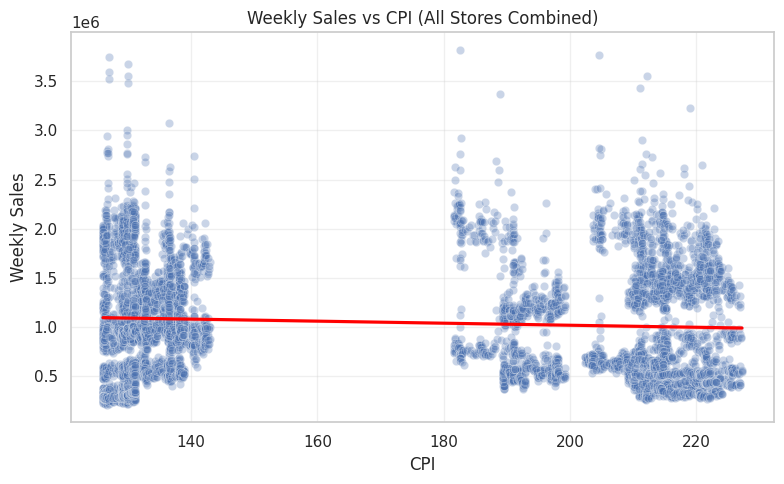

In [501]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='CPI', y='Weekly_Sales', data=df, alpha=0.3)

sns.regplot(
    x='CPI',
    y='Weekly_Sales',
    data=df,
    scatter=False,
    color='red'
)

plt.title("Weekly Sales vs CPI (All Stores Combined)")
plt.xlabel("CPI")
plt.ylabel("Weekly Sales")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


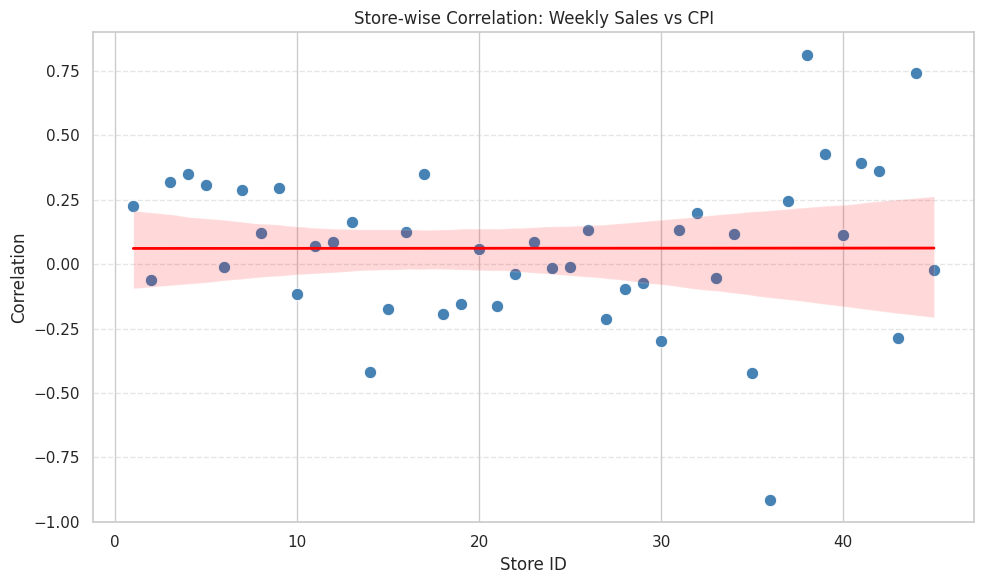

In [502]:
plt.figure(figsize=(10,6))

# Scatter plot: Store ID vs Correlation
sns.scatterplot(
    x=store_sales_CPI_corr.index,
    y=store_sales_CPI_corr.values,
    s=80,
    color='steelblue'
)

# Regression line (trend)
sns.regplot(
    x=store_sales_CPI_corr.index,
    y=store_sales_CPI_corr.values,
    scatter=False,
    color='red',
    line_kws={'linewidth':2}
)

plt.title('Store-wise Correlation: Weekly Sales vs CPI')
plt.xlabel('Store ID')
plt.ylabel('Correlation')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

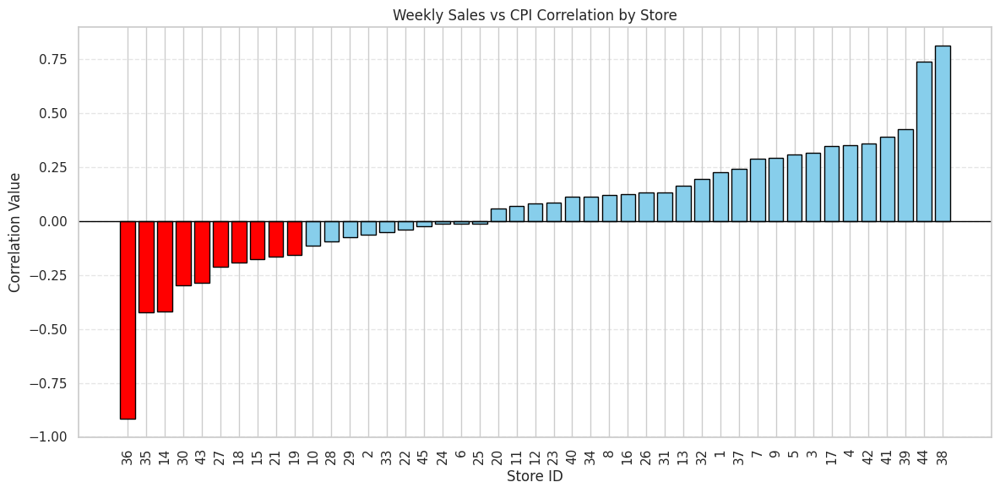

In [503]:
colors = ['red' if i < 10 else 'skyblue' for i in range(len(store_sales_CPI_corr))]

plt.figure(figsize=(12,6))
plt.bar(store_sales_CPI_corr.index.astype(str), store_sales_CPI_corr.values, color=colors, edgecolor='black')

plt.title("Weekly Sales vs CPI Correlation by Store")
plt.xlabel("Store ID")
plt.ylabel("Correlation Value")
plt.axhline(0, color='black', linewidth=1)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


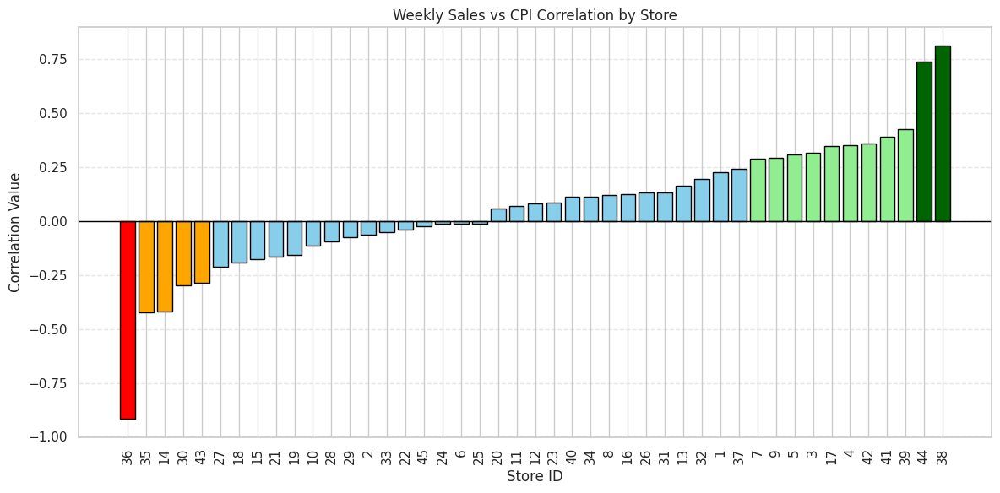

In [504]:
colors = []
n = len(store_sales_CPI_corr)

# settings
strong_neg = 1
moderate_neg = 5
strong_pos = 2
moderate_pos = 11

colors = []

for i in range(n):

    # 1. Strong negative (first 2)
    if i < strong_neg:
        colors.append('red')

    # 2. Moderate negative (next 8 → up to total 10)
    elif i < moderate_neg:
        colors.append('orange')

    # 3. Strong positive (last 2)
    elif i >= n - strong_pos:
        colors.append('darkgreen')

    # 4. Moderate positive (previous 3–8 stores in the last 10)
    elif i >= n - moderate_pos:
        colors.append('lightgreen')

    # 5. Neutral middle
    else:
        colors.append('skyblue')

plt.figure(figsize=(12,6))
plt.bar(store_sales_CPI_corr.index.astype(str), store_sales_CPI_corr.values, color=colors, edgecolor='black')

plt.title("Weekly Sales vs CPI Correlation by Store")
plt.xlabel("Store ID")
plt.ylabel("Correlation Value")
plt.axhline(0, color='black', linewidth=1)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [505]:
# Add strongest negative stores
for store_id, corr_value in store_sales_CPI_corr.head(1).items():
    top_corr_list.append({
        'store_id': store_id,
        'column': 'CPI',
        'correlation': corr_value
    })

# Add strongest positive stores
for store_id, corr_value in store_sales_CPI_corr.tail(2).items():
    top_corr_list.append({
        'store_id': store_id,
        'column': 'CPI',
        'correlation': corr_value
    })


In [506]:
top_corr_list

[{'store_id': 38,
  'column': 'Unemployment',
  'correlation': -0.7852902748572036},
 {'store_id': 44,
  'column': 'Unemployment',
  'correlation': -0.7800764432910212},
 {'store_id': 35,
  'column': 'Unemployment',
  'correlation': 0.48386541981924264},
 {'store_id': 36, 'column': 'Unemployment', 'correlation': 0.8337336178415088},
 {'store_id': 36, 'column': 'CPI', 'correlation': -0.9150952776725542},
 {'store_id': 44, 'column': 'CPI', 'correlation': 0.7401498169960975},
 {'store_id': 38, 'column': 'CPI', 'correlation': 0.8128368242188552}]

##### **Individual Store Level:**
- **Store 36:** Very strong negative correlation (-0.92) - As CPI rises, sales drop significantly
- **Store 38:** Strong positive correlation (+0.81) - As CPI rises, sales increase significantly  
- **Store 44:** Strong positive correlation (+0.74)
- Many stores show **moderate to strong** relationships (> ±0.40)

##### **Overall Aggregated Level:**
- Combined correlation across all stores: **-0.07** (very weak)

----

##### **Reason:**

**1. Stores React Differently to CPI**
- Some stores are in **regions where high inflation drives customers to budget retail stores** (positive correlation - Stores 38, 44). These stores show strong positive correlation (sales rise with inflation) due to increased low-budget shopping during inflationary times.

- Other stores are in **areas where high inflation reduces consumer spending power** (negative correlation - Store 36). These stores show strong negative correlation (sales fall when CPI rises) due to lower consumer spending, local economic stress, or regional customer behavior differences.

**2. Simpson's Paradox**
- When you **aggregate** all stores together, the strong positive and negative effects cancel each other out, producing a misleading weak overall correlation
- This is why the global -0.07 doesn't represent the true story

**3. Regional Economic Differences**
- Stores in different locations experience different:
  - Customer demographics (income levels)
  - Local competition
  - Economic conditions
  - Shopping behaviors during inflation

##### **Conclusion**:

CPI DOES significantly affect weekly sales of **some stores**, but the direction and magnitude vary by store. Some stores (like 38, 44) benefit from inflation with strong positive correlations (+0.81, +0.74), while others (like 36) suffer with strong negative correlations (-0.92). The overall weak correlation (-0.07) is misleading because it masks these strong store-specific effects.

###  e. Top performing stores according to the historical data.


In [507]:
store_weekly

Store,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-02-05,1643690.90,2136989.46,461622.22,2135143.87,317173.10,1652635.10,496725.44,1004137.09,549505.55,2193048.75,1528008.64,1100046.37,1967220.53,2623469.95,652122.44,477409.30,789036.02,1205307.50,1507637.17,2401395.47,798593.88,1033017.37,1364721.58,1388725.63,677231.63,1034119.21,1874289.79,1672352.29,538634.46,465108.52,1469252.05,1087616.19,274593.43,956228.96,1230613.50,467546.74,536006.73,358496.14,1230596.80,1001943.80,1086533.18,543384.01,647029.28,281090.95,890689.51
2010-02-12,1641957.44,2137809.50,420728.96,2188307.39,311825.70,1606283.86,524104.92,994801.40,552677.48,2176028.52,1574684.08,1117863.33,2030933.46,1704218.84,682447.10,472044.28,841951.91,1187880.70,1536549.95,2109107.90,809321.44,1022571.25,1380892.08,1414107.10,583364.02,1015684.09,1745362.72,1558968.49,529672.95,497374.57,1543947.23,1123566.12,294882.83,994610.99,1168815.31,469563.70,529852.70,342214.90,1266229.07,955338.29,1075656.34,575709.96,682918.99,286857.13,656988.64
2010-02-19,1611968.17,2124451.54,421642.19,2049860.26,303447.57,1567138.07,506760.54,963960.37,511327.90,2113432.58,1503298.70,1095421.65,1970274.64,2204556.70,660838.75,469868.70,800714.00,1150663.42,1515976.11,2161549.76,867283.25,988467.61,1319588.04,1385362.49,676260.67,999348.55,1945070.33,1491300.42,542399.07,463513.26,1473386.75,1082559.06,296850.83,983963.07,1270658.64,470281.03,510382.50,327237.92,1230591.97,916289.20,1052034.74,508794.87,658997.55,267956.30,841264.04
2010-02-26,1409727.59,1865097.27,407204.86,1925728.84,270281.63,1432953.21,496083.24,847592.11,473773.27,2006774.96,1336404.65,1048617.17,1817850.32,2095591.63,564883.20,443242.17,749549.55,1068157.45,1373270.06,1898193.95,749597.24,899761.48,1198709.65,1158722.74,628516.57,855385.01,1390934.27,1542173.33,488417.61,472330.71,1344354.41,1053247.10,284052.77,905756.13,1020651.74,447519.44,513615.82,334222.73,1168582.02,863917.41,991941.73,491510.58,618702.79,273079.07,741891.65
2010-03-05,1554806.68,1991013.13,415202.04,1971057.44,288855.71,1601348.82,491419.55,881503.95,507297.88,1987090.09,1426622.65,1077018.27,1939980.43,2237544.75,605325.43,444181.85,783300.05,1179738.50,1495844.57,2119213.72,747444.32,1009201.24,1311175.93,1412387.37,665750.06,1005669.58,1313729.72,1608435.45,535087.91,472591.07,1384870.51,1066566.74,291484.89,918295.79,1162610.27,480203.43,519255.68,372239.89,1266254.21,990152.28,1063557.49,554972.42,658600.05,284617.27,777951.22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-09-28,1437059.26,1746470.56,389813.02,2027620.23,310141.68,1369131.46,525545.76,884724.41,516361.06,1694862.41,1227430.73,880415.67,1927664.11,1522512.20,553901.97,469607.73,972716.24,1002856.20,1338299.02,2008350.58,647097.65,976479.51,1319035.06,1259278.36,683300.84,964726.37,1540687.63,1129508.61,489674.23,425410.04,1279080.58,1157111.15,242813.51,928629.31,814099.86,270677.98,527953.14,398468.08,1495607.07,919595.44,1307928.01,505978.46,577792.32,355307.94,713173.95
2012-10-05,1670785.97,1998321.04,443557.65,2209835.43,343048.29,1518177.71,505830.56,976436.02,606755.30,1758971.38,1422794.26,979825.92,2041918.74,1687592.16,573498.64,471281.68,952609.17,1092204.79,1408016.10,2246411.89,651768.91,1009887.36,1464616.59,1416720.54,699536.73,1095504.26,1591816.88,1462941.03,520632.80,446751.45,1363365.05,1202775.24,265444.90,968896.68,866064.40,277137.86,546122.37,458479.01,1574408.67,1069112.00,1400160.95,593162.53,642614.89,337390.44,733455.07
2012-10-12,1573072.81,1900745.13,410804.39,2133026.07,325345.41,1459396.84,503463.93,927511.99,558464.80,1713889.11,1311965.09,934917.47,1999079.44,1639585.61,551799.63,491817.19,919878.34,1074079.00,1352809.50,2162951.36,653043.44,1004039.84,1412925.25,

In [508]:
store_weekly.sum()

,0
Store,
1,2.224028e+08
2,2.753824e+08
3,5.758674e+07
4,2.995440e+08
5,4.547569e+07
6,2.237561e+08
7,8.159828e+07
8,1.299512e+08
9,7.778922e+07


In [509]:
df.groupby('Store')['Weekly_Sales'].sum().sort_index()

,Weekly_Sales
Store,
1,2.224028e+08
2,2.753824e+08
3,5.758674e+07
4,2.995440e+08
5,4.547569e+07
6,2.237561e+08
7,8.159828e+07
8,1.299512e+08
9,7.778922e+07


In [510]:
np.allclose(store_weekly.sum(), df.groupby('Store')['Weekly_Sales'].sum().sort_index())

True

In [511]:
np.allclose(store_weekly.mean(), df.groupby('Store')['Weekly_Sales'].mean().sort_index(), rtol=1e-6, atol=1e-6)

True

So instead of directly grouping, we can take from our pivoted sd store_weekly

In [512]:
store_weekly_total = store_weekly.sum().sort_values(ascending=False)

store_weekly_total.head(10) # top 10 total sales stores

,0
Store,
20,3.013978e+08
4,2.995440e+08
14,2.889999e+08
13,2.865177e+08
2,2.753824e+08
10,2.716177e+08
27,2.538559e+08
6,2.237561e+08
1,2.224028e+08


In [513]:
store_weekly_avg = store_weekly.mean().sort_values(ascending=False)

store_weekly_avg.head(10) # top 10 stores' avg sales

,0
Store,
20,2.107677e+06
4,2.094713e+06
14,2.020978e+06
13,2.003620e+06
2,1.925751e+06
10,1.899425e+06
27,1.775216e+06
6,1.564728e+06
1,1.555264e+06


In [514]:
df['Date'].nunique()

143

In [515]:
(store_weekly_avg).equals(store_weekly_total/(df['Date'].nunique()))

True

Both avg and total comes in same order of stores only because the number of Weekly_sales recorded in df are same for each store because same dates are there for all stores

Because average weekly sales are simply the total sales divided
by the same constant number of weeks, the ranking of stores remains identical for
both metrics.

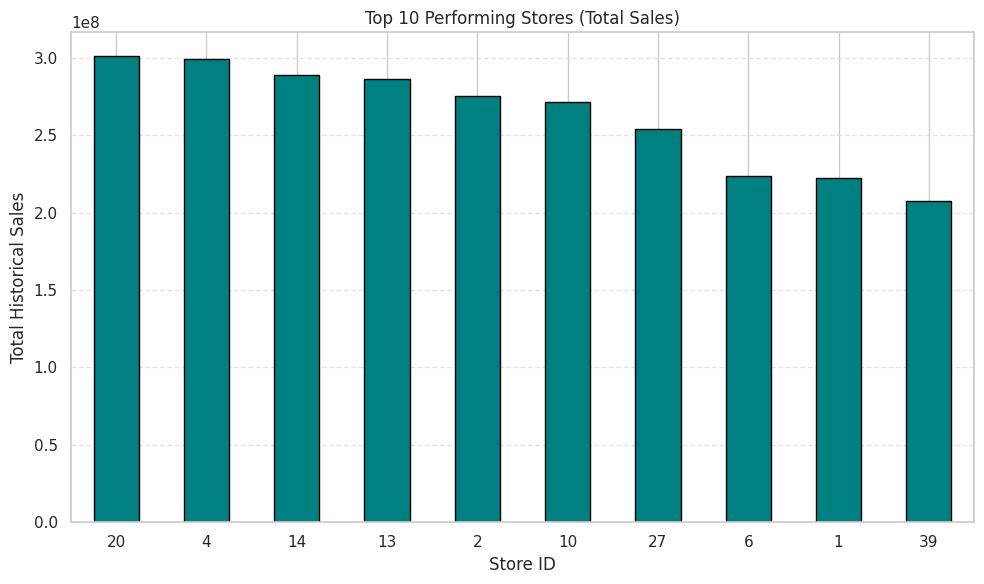

In [516]:
plt.figure(figsize=(10,6))
store_weekly_total.head(10).plot(kind='bar', color='teal', edgecolor='black')  # top 10 only

plt.title("Top 10 Performing Stores (Total Sales)")
plt.xlabel("Store ID")
plt.ylabel("Total Historical Sales")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

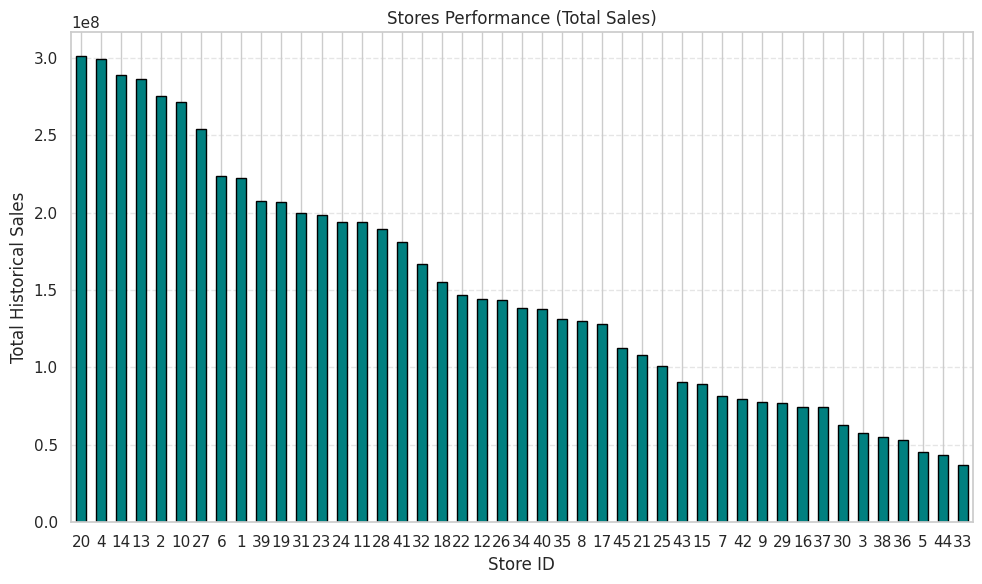

In [517]:
plt.figure(figsize=(10,6))
store_weekly_total.plot(kind='bar', color='teal', edgecolor='black')

plt.title("Stores Performance (Total Sales)")
plt.xlabel("Store ID")
plt.ylabel("Total Historical Sales")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

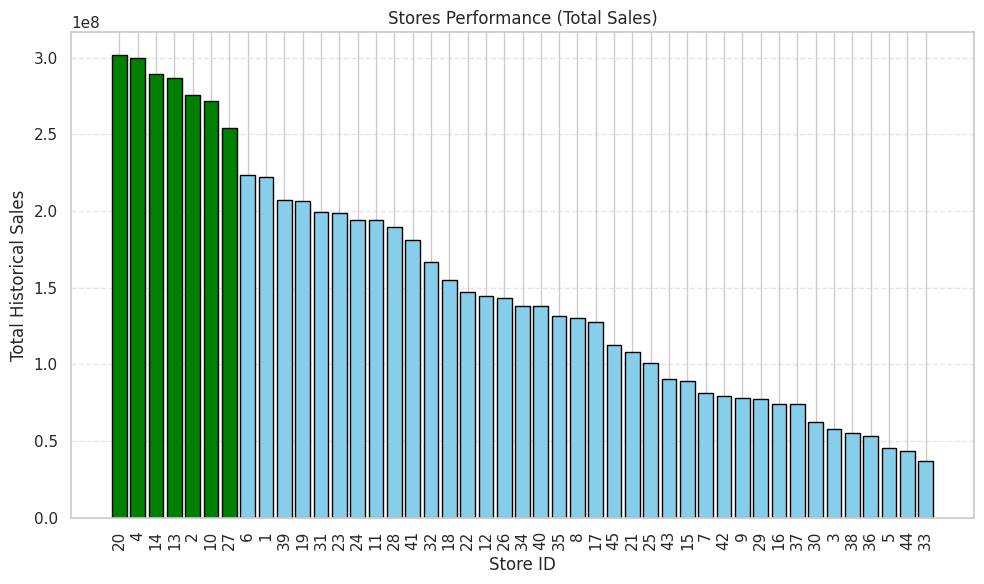

In [518]:
plt.figure(figsize=(10,6))

colors = ['green' if i < 7 else 'skyblue' for i in range(len(store_weekly_total))]


plt.bar(store_weekly_total.index.astype(str), store_weekly_total.values, color=colors, edgecolor='black')

plt.title("Stores Performance (Total Sales)")
plt.xlabel("Store ID")
plt.ylabel("Total Historical Sales")
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

The bar chart highlights the top-performing stores based on total historical sales.
The top 7 stores are colored green, showing which locations consistently contribute the
highest sales across all weeks in the dataset. The remaining stores are shown in blue.

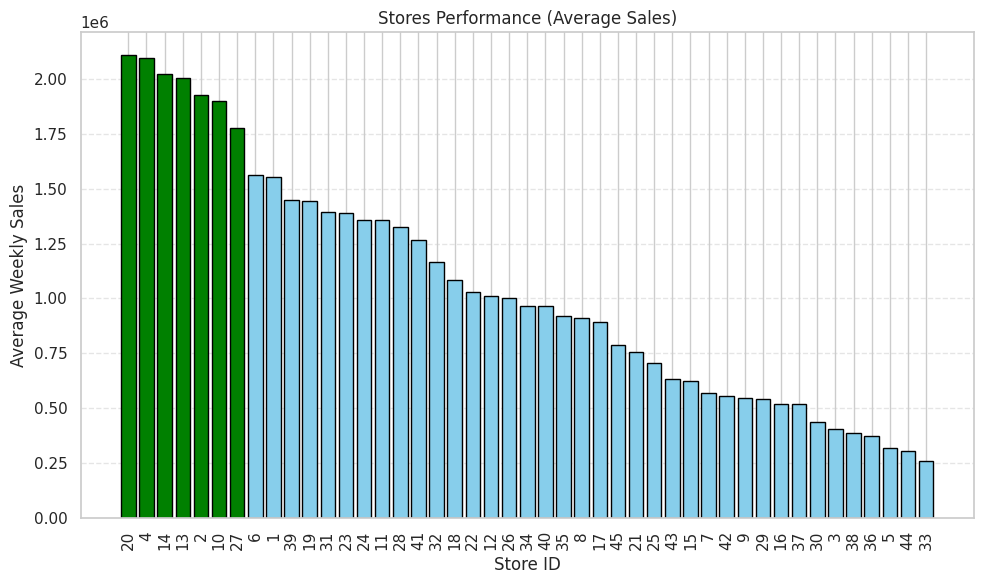

In [519]:
plt.figure(figsize=(10,6))

colors = ['green' if i < 7 else 'skyblue' for i in range(len(store_weekly_avg))]


plt.bar(store_weekly_avg.index.astype(str), store_weekly_avg.values, color=colors, edgecolor='black')

plt.title("Stores Performance (Average Sales)")
plt.xlabel("Store ID")
plt.ylabel("Average Weekly Sales")
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

From the Bar chart we selected top 7 stores

In [520]:
# Top 7 store's total sales

store_weekly_total.head(7)

,0
Store,
20,3.013978e+08
4,2.995440e+08
14,2.889999e+08
13,2.865177e+08
2,2.753824e+08
10,2.716177e+08
27,2.538559e+08


In [521]:
# Top 7 store's average sales

store_weekly_avg.head(7)

,0
Store,
20,2.107677e+06
4,2.094713e+06
14,2.020978e+06
13,2.003620e+06
2,1.925751e+06
10,1.899425e+06
27,1.775216e+06


In [522]:
# Top 7 stores are

store_weekly_avg.head(7).index

Index([20, 4, 14, 13, 2, 10, 27], dtype='int64', name='Store')

Here is a **clean, concise, assignment-ready Markdown conclusion** for **Q1(e): Top-performing stores**, based entirely on your actual results.

---

**Top-Performing Stores – Conclusion**

Both the total sales and average weekly sales analysis identify the same set of top-performing stores, since each store has the same number of weekly observations. The highest-performing stores based on historical data are:

* **Store 20**
* **Store 4**
* **Store 14**
* **Store 13**
* **Store 2**
* **Store 10**
* **Store 27**

These stores consistently generated the highest weekly sales throughout the time period.
Store **20** recorded the highest total sales (≈ 301 million), followed closely by Stores **4**, **14**, and **13**, all crossing or nearing the 280–300 million range. Their average weekly sales also exceed 1.9–2.1 million, confirming strong and steady performance across the entire duration.

These stores represent the most successful locations in the dataset and can be prioritized for resource allocation, strategic planning, and deeper analysis.

###  f. The worst performing store, and how significant is the difference between the highest and lowest performing stores.

since they are sorted

In [523]:
store_weekly_total.tail(5)

,0
Store,
38,55159626.42
36,53412214.97
5,45475688.90
44,43293087.84
33,37160221.96


In [524]:
store_weekly_total.index[0] ==  store_weekly_total.idxmax()

np.True_

In [525]:
store_weekly_total.index[-1] ==  store_weekly_total.idxmin()

np.True_

In [526]:
store_weekly_avg.index[0] ==  store_weekly_avg.idxmax()

np.True_

In [527]:
store_weekly_avg.index[-1] ==  store_weekly_avg.idxmin()

np.True_

In [528]:
# Top and bottom stores by TOTAL sales
high_performing_store = store_weekly_total.index[0]
top_total_value = store_weekly_total.iloc[0]

low_performing_store = store_weekly_total.index[-1]
bottom_total_value = store_weekly_total.iloc[-1]

print(f"Top total store: {high_performing_store} -- {top_total_value:,.2f} ({top_total_value/1e6:.2f} M)")
print(f"Bottom total store: {low_performing_store} -- {bottom_total_value:,.2f} ({bottom_total_value/1e6:.2f} M)")


Top total store: 20 -- 301,397,792.46 (301.40 M)
Bottom total store: 33 -- 37,160,221.96 (37.16 M)


In [529]:
# Top and bottom stores by AVERAGE weekly sales
top_avg_value = store_weekly_avg.iloc[0]
bottom_avg_value = store_weekly_avg.iloc[-1]

print(f"Top average store: {high_performing_store} -- {top_avg_value:,.2f} ({top_avg_value/1e6:.2f} M)")
print(f"Bottom average store: {low_performing_store} -- {bottom_avg_value:,.2f} ({bottom_avg_value/1e6:.2f} M)")


Top average store: 20 -- 2,107,676.87 (2.11 M)
Bottom average store: 33 -- 259,861.69 (0.26 M)


In [530]:
# Absolute difference (total)
abs_diff_total = top_total_value - bottom_total_value

# Percent difference relative to top (how much less bottom is vs top)
pct_diff_total_vs_top = (abs_diff_total / top_total_value) * 100

# Percent difference relative to bottom (how much more top is vs bottom)
pct_diff_total_vs_bottom = (abs_diff_total / bottom_total_value) * 100

# Ratio bottom / top
bottom_top_ratio = bottom_total_value / top_total_value

print(f"Total absolute difference : {abs_diff_total:,.2f} ({abs_diff_total/1e6:.2f} M)")
print("Bottom is {:.2f}% less than Top (relative to Top).".format(pct_diff_total_vs_top))
print("Top is {:.2f}% more than Bottom (relative to Bottom).".format(pct_diff_total_vs_bottom))
print(f"Bottom/Top ratio          : {bottom_top_ratio:.4f}")
print(f"Bottom total sales is only {bottom_top_ratio*100:.2f}% of top total sales.")

Total absolute difference : 264,237,570.50 (264.24 M)
Bottom is 87.67% less than Top (relative to Top).
Top is 711.08% more than Bottom (relative to Bottom).
Bottom/Top ratio          : 0.1233
Bottom total sales is only 12.33% of top total sales.


In [531]:
# Absolute difference (average weekly)
abs_diff_avg = top_avg_value - bottom_avg_value

pct_diff_avg_vs_top = (abs_diff_avg / top_avg_value) * 100
pct_diff_avg_vs_bottom = (abs_diff_avg / bottom_avg_value) * 100

avg_bottom_top_ratio = bottom_avg_value / top_avg_value # ratio would be sane as total ratio one

print(f"Average weekly absolute difference : {abs_diff_avg:,.2f} ({abs_diff_avg/1e6:.2f} M)")
print("Bottom average is {:.2f}% less than Top average (relative to Top).".format(pct_diff_avg_vs_top))
print("Top average is {:.2f}% more than Bottom average (relative to Bottom).".format(pct_diff_avg_vs_bottom))
print(f"Bottom average weekly sales is only {avg_bottom_top_ratio*100:.2f}% of top average weekly sales.")

Average weekly absolute difference : 1,847,815.18 (1.85 M)
Bottom average is 87.67% less than Top average (relative to Top).
Top average is 711.08% more than Bottom average (relative to Bottom).
Bottom average weekly sales is only 12.33% of top average weekly sales.


##### **Interpretation**

The analysis shows a very large performance gap between the highest- and lowest-performing stores. Store 20 stands out as the top-performing location with total sales of about 301.4 million and an average weekly sale of 2.11 million, whereas Store 33 is the weakest performer with only 37.16 million in total sales and 0.26 million in average weekly sales. The difference is substantial: the best store sells 264.24 million more than the worst store, meaning the lowest-performing location achieves only 12.33% of the top store's sales. This gap highlights clear disparities in regional demand, customer footfall, store size, and operational efficiency. Such a stark difference suggests that the weakest stores may require focused attention, strategic changes, or resource realignment to improve their performance.

## 2. Predictive modeling techniques to forecast the sales for each store for the next 12 weeks.

All the numeric attributes except Holiday flag (which is like a Boolean only) and Fuel Price.

Now we shall analyse the fuel prie also

### Fuel Price Correlation

#### Step 1 - Compute Global Correlation

In [532]:
df.corr()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,1.000000e+00,1.577299e-13,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531
Date,1.577299e-13,1.000000e+00,0.006949,-1.328524e-02,0.145357,0.771444,0.077157,-0.248203
Weekly_Sales,-3.353320e-01,6.949360e-03,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,-4.386841e-16,-1.328524e-02,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-2.265908e-02,1.453566e-01,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158
Fuel_Price,6.002295e-02,7.714439e-01,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684
CPI,-2.094919e-01,7.715746e-02,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020
Unemployment,2.235313e-01,-2.482029e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000


In [533]:
df[['Weekly_Sales', 'Fuel_Price']].corr()

,Weekly_Sales,Fuel_Price
Weekly_Sales,1.000000,0.009464
Fuel_Price,0.009464,1.000000


In [534]:
# non diagonal value needed

weeklySales_Fuel_globalCorr = df[['Weekly_Sales', 'Fuel_Price']].corr().iloc[0,1]

In [535]:
weeklySales_Fuel_globalCorr

np.float64(0.009463786314475474)

In [536]:
df.groupby('Store')[['Weekly_Sales', 'Fuel_Price']].corr()

Weekly_Sales  Fuel_Price
Store                                       
1     Weekly_Sales      1.000000    0.124592
      Fuel_Price        0.124592    1.000000
2     Weekly_Sales      1.000000   -0.196375
      Fuel_Price       -0.196375    1.000000
3     Weekly_Sales      1.000000    0.140886
      Fuel_Price        0.140886    1.000000
4     Weekly_Sales      1.000000    0.211549
      Fuel_Price        0.211549    1.000000
5     Weekly_Sales      1.000000    0.167352
      Fuel_Price        0.167352    1.000000
6     Weekly_Sales      1.000000   -0.103356
      Fuel_Price       -0.103356    1.000000
7     Weekly_Sales      1.000000    0.110356
      Fuel_Price        0.110356    1.000000
8     Weekly_Sales      1.000000    0.029752
      Fuel_Price        0.029752    1.000000
9     Weekly_Sales      1.000000    0.205404
      Fuel_Price        0.205404    1.000000
10    Weekly_Sales      1.000000   -0.185058
      Fuel_Price       -0.185058    1.000000
11    Weekly_Sales      1.000000   -0.041299
      Fuel_Price       -0.041299    1.000000
12    Weekly_Sales      1.000000    0.015072
      Fuel_Price        0.015072    1.000000
13    Weekly_Sales      1.000000    0.076500
      Fuel_Price        0.076500    1.000000
14    Weekly_Sales      1.000000   -0.350340
      Fuel_Price       -0.350340    1.000000
15    Weekly_Sales      1.000000   -0.190398
      Fuel_Price       -0.190398    1.000000
16    Weekly_Sales      1.000000   -0.002426
      Fuel_Price       -0.002426    1.000000
17    Weekly_Sales      1.000000    0.311631
      Fuel_Price        0.311631    1.000000
18    Weekly_Sales      1.000000   -0.275051
      Fuel_Price       -0.275051    1.000000
19    Weekly_Sales      1.000000   -0.190684
      Fuel_Price       -0.190684    1.000000
20    Weekly_Sales      1.000000   -0.013507
      Fuel_Price       -0.013507    1.000000
21    Weekly_Sales      1.000000   -0.136542
      Fuel_Price       -0.136542    1.000000
22    Weekly_Sales      1.000000   -0.074896
      Fuel_Price       -0.074896    1.000000
23    Weekly_Sales      1.000000    0.018392
      Fuel_Price        0.018392    1.000000
24    Weekly_Sales      1.000000   -0.105005
      Fuel_Price       -0.105005    1.000000
25    Weekly_Sales      1.000000   -0.084262
      Fuel_Price       -0.084262    1.000000
26    Weekly_Sales      1.000000    0.023475
      Fuel_Price        0.023475    1.000000
27    Weekly_Sales      1.000000   -0.227238
      Fuel_Price       -0.227238    1.000000
28    Weekly_Sales      1.000000   -0.142722
      Fuel_Price       -0.142722    1.000000
29    Weekly_Sales      1.000000   -0.092129
      Fuel_Price       -0.092129    1.000000
30    Weekly_Sales      1.000000   -0.431441
      Fuel_Price       -0.431441    1.000000
31    Weekly_Sales      1.000000    0.109563
      Fuel_Price        0.109563    1.000000
32    Weekly_Sales      1.000000    0.118010
      Fuel_Price        0.118010    1.000000
33    Weekly_Sales      1.000000   -0.059887
      Fuel_Price       -0.059887    1.000000
34    Weekly_Sales      1.000000    0.013688
      Fuel_Price        0.013688    1.000000
35    Weekly_Sales      1.000000   -0.498197
      Fuel_Price       -0.498197    1.000000
36    Weekly_Sales      1.000000   -0.727462
      Fuel_Price       -0.727462    1.000000
37    Weekly_Sales      1.000000    0.208218
      Fuel_Price        0.208218    1.000000
38    Weekly_Sales      1.000000    0.697184
      Fuel_Price        0.697184    1.000000
39    Weekly_Sales      1.000000    0.266659
      Fuel_Price        0.266659    1.000000
40    Weekly_Sales      1.000000    0.029627
      Fuel_Price        0.029627    1.000000
41    Weekly_Sales      1.000000    0.305745
      Fuel_Price        0.305745    1.000000
42    Weekly_Sales      1.000000    0.323031
      Fuel_Price        0.323031    1.000000
43    Weekly_Sales      1.000000   -0.342037
      Fuel_Price       -0.342037    1.000000
44    Weekly_Sales      1.000000    0.607367
      Fuel_Pric

NOTE : These steps are followed in Correlation between Weekly_sales and Unemployment

In [537]:
# the above is multi index we are dropping level 1
# 0 level is store ids , 1 level is "Weely_Sales"

store_sales_Fuel_corr = (
    df.groupby('Store')[['Weekly_Sales', 'Fuel_Price']]
      .corr()
      .iloc[::2,-1]  # select correlation between Weekly_Sales & Temperature
      .droplevel(1)  # drop unwanted level
)

In [538]:
store_sales_Fuel_corr

,Fuel_Price
Store,
1,0.124592
2,-0.196375
3,0.140886
4,0.211549
5,0.167352
6,-0.103356
7,0.110356
8,0.029752
9,0.205404


In [539]:
store_sales_Fuel_corr.info() # Series

<class 'pandas.core.series.Series'>
Index: 45 entries, 1 to 45
Series name: Fuel_Price
Non-Null Count  Dtype  
--------------  -----  
45 non-null     float64
dtypes: float64(1)
memory usage: 720.0 bytes


In [540]:
store_sales_Fuel_corr.name = "Weekly_Sales Fuel Correlation"

In [541]:
store_sales_Fuel_corr

,Weekly_Sales Fuel Correlation
Store,
1,0.124592
2,-0.196375
3,0.140886
4,0.211549
5,0.167352
6,-0.103356
7,0.110356
8,0.029752
9,0.205404


In [542]:
store_sales_Fuel_corr.sort_values(inplace=True)  # sort values ascending, means most negative

In [543]:
store_sales_Fuel_corr.head(10)  # strong negative correlation

,Weekly_Sales Fuel Correlation
Store,
36,-0.727462
35,-0.498197
30,-0.431441
14,-0.350340
43,-0.342037
18,-0.275051
27,-0.227238
2,-0.196375
19,-0.190684


In [544]:
store_sales_Fuel_corr.tail(10)  # strong positive correlation

,Weekly_Sales Fuel Correlation
Store,
5,0.167352
9,0.205404
37,0.208218
4,0.211549
39,0.266659
41,0.305745
17,0.311631
42,0.323031
44,0.607367


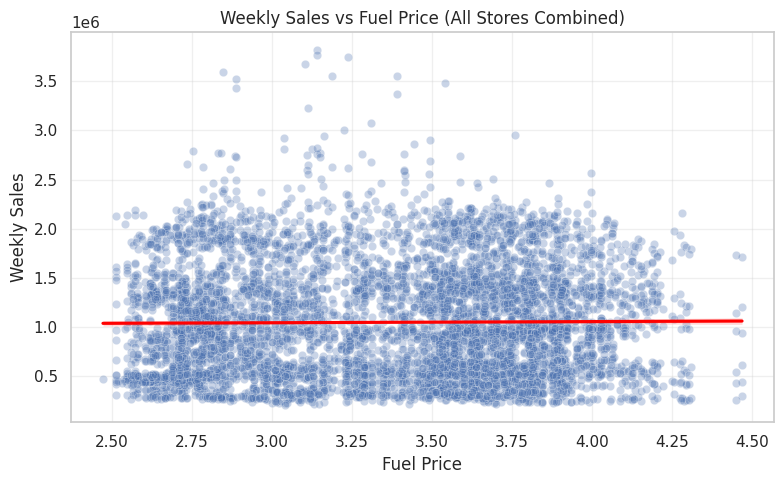

In [545]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='Fuel_Price', y='Weekly_Sales', data=df, alpha=0.3)

sns.regplot(
    x='Fuel_Price',
    y='Weekly_Sales',
    data=df,
    scatter=False,
    color='red'
)

plt.title("Weekly Sales vs Fuel Price (All Stores Combined)")
plt.xlabel("Fuel Price")
plt.ylabel("Weekly Sales")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


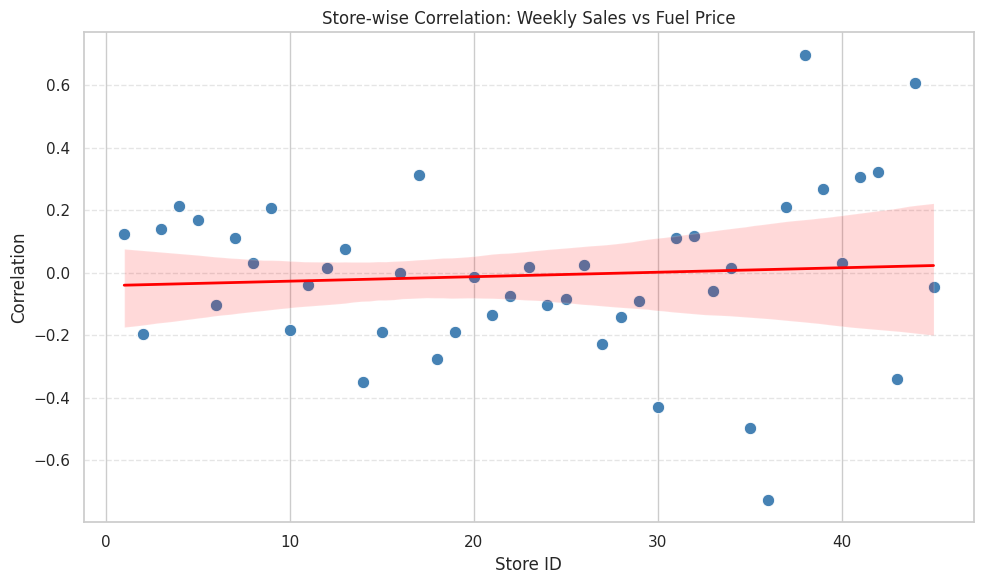

In [546]:
plt.figure(figsize=(10,6))

# Scatter plot: Store ID vs Correlation
sns.scatterplot(
    x=store_sales_Fuel_corr.index,
    y=store_sales_Fuel_corr.values,
    s=80,
    color='steelblue'
)

# Regression line (trend)
sns.regplot(
    x=store_sales_Fuel_corr.index,
    y=store_sales_Fuel_corr.values,
    scatter=False,
    color='red',
    line_kws={'linewidth':2}
)

plt.title('Store-wise Correlation: Weekly Sales vs Fuel Price')
plt.xlabel('Store ID')
plt.ylabel('Correlation')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

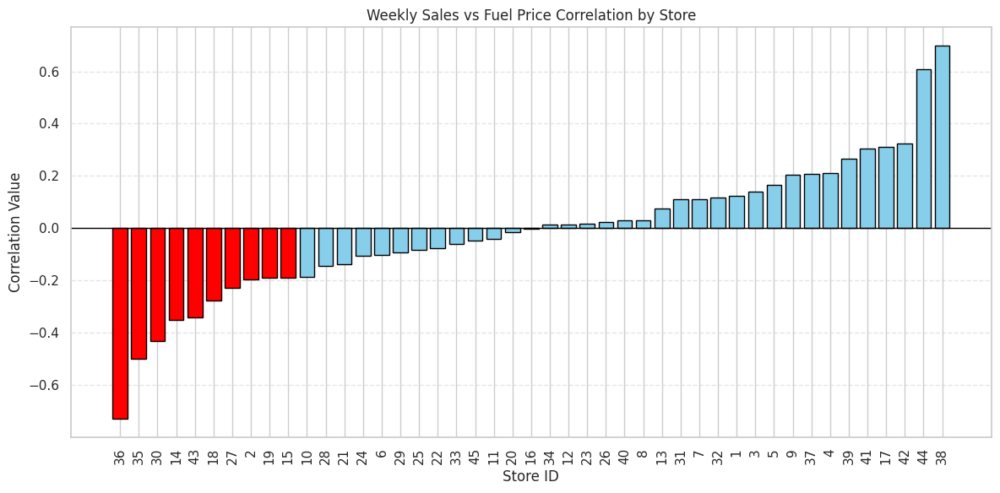

In [547]:
colors = ['red' if i < 10 else 'skyblue' for i in range(len(store_sales_Fuel_corr))]

plt.figure(figsize=(12,6))
plt.bar(store_sales_Fuel_corr.index.astype(str), store_sales_Fuel_corr.values, color=colors, edgecolor='black')

plt.title("Weekly Sales vs Fuel Price Correlation by Store")
plt.xlabel("Store ID")
plt.ylabel("Correlation Value")
plt.axhline(0, color='black', linewidth=1)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


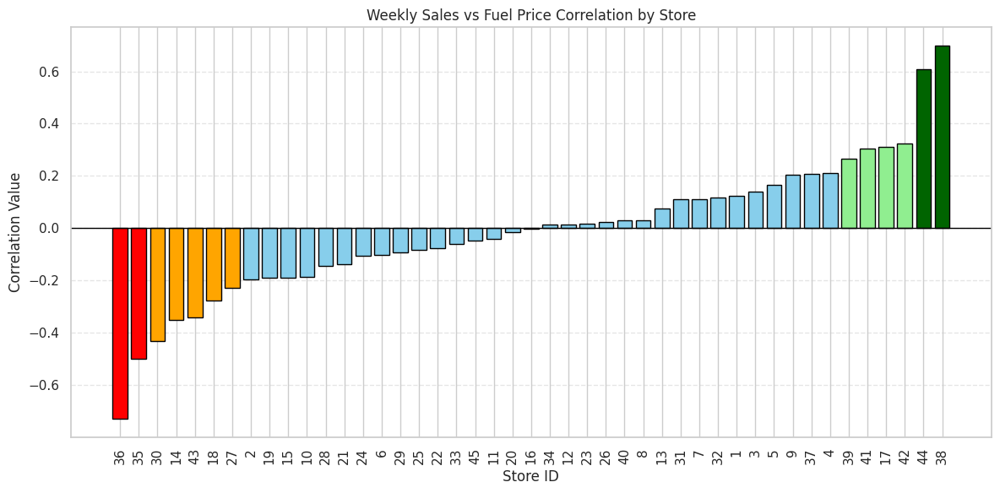

In [548]:
colors = []
n = len(store_sales_Fuel_corr)

# settings
strong_neg = 2
moderate_neg = 7
strong_pos = 2
moderate_pos = 6

colors = []

for i in range(n):

    # 1. Strong negative (first 2)
    if i < strong_neg:
        colors.append('red')

    # 2. Moderate negative (next 8 → up to total 10)
    elif i < moderate_neg:
        colors.append('orange')

    # 3. Strong positive (last 2)
    elif i >= n - strong_pos:
        colors.append('darkgreen')

    # 4. Moderate positive (previous 3–8 stores in the last 10)
    elif i >= n - moderate_pos:
        colors.append('lightgreen')

    # 5. Neutral middle
    else:
        colors.append('skyblue')

plt.figure(figsize=(12,6))
plt.bar(store_sales_Fuel_corr.index.astype(str), store_sales_Fuel_corr.values, color=colors, edgecolor='black')

plt.title("Weekly Sales vs Fuel Price Correlation by Store")
plt.xlabel("Store ID")
plt.ylabel("Correlation Value")
plt.axhline(0, color='black', linewidth=1)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [549]:
# Add strongest negative stores
for store_id, corr_value in store_sales_Fuel_corr.head(2).items():
    top_corr_list.append({
        'store_id': store_id,
        'column': 'Fuel_Price',
        'correlation': corr_value
    })

# Add strongest positive stores
for store_id, corr_value in store_sales_Fuel_corr.tail(2).items():
    top_corr_list.append({
        'store_id': store_id,
        'column': 'Fuel_Price',
        'correlation': corr_value
    })


In [550]:
top_corr_list

[{'store_id': 38,
  'column': 'Unemployment',
  'correlation': -0.7852902748572036},
 {'store_id': 44,
  'column': 'Unemployment',
  'correlation': -0.7800764432910212},
 {'store_id': 35,
  'column': 'Unemployment',
  'correlation': 0.48386541981924264},
 {'store_id': 36, 'column': 'Unemployment', 'correlation': 0.8337336178415088},
 {'store_id': 36, 'column': 'CPI', 'correlation': -0.9150952776725542},
 {'store_id': 44, 'column': 'CPI', 'correlation': 0.7401498169960975},
 {'store_id': 38, 'column': 'CPI', 'correlation': 0.8128368242188552},
 {'store_id': 36, 'column': 'Fuel_Price', 'correlation': -0.7274618540899402},
 {'store_id': 35, 'column': 'Fuel_Price', 'correlation': -0.49819689903350917},
 {'store_id': 44, 'column': 'Fuel_Price', 'correlation': 0.6073673757269517},
 {'store_id': 38, 'column': 'Fuel_Price', 'correlation': 0.697184051977453}]

Although the overall correlation between fuel price and weekly sales is almost zero (0.009), the store-level analysis shows that a few individual locations behave very differently. Stores 36 and 35 exhibit a strong negative correlation (-0.73 and -0.498), indicating that their sales drop noticeably when fuel prices rise. On the other hand, Stores 38 and 44 display strong positive correlations (+0.697 and +0.607), meaning their sales increase during periods of higher fuel prices. Most other stores remain clustered close to zero, showing minimal sensitivity. These extreme positive and negative effects cancel each other out in the combined dataset, resulting in a weak overall correlation—even though certain stores are significantly affected. This illustrates aggregation bias, where important store-specific patterns disappear when all stores are analyzed together.

### TimeSeries Prediction

In [775]:
top_corr_list  # Store 35 is in CPI also, just we did not add

[{'store_id': 38,
  'column': 'Unemployment',
  'correlation': -0.7852902748572036},
 {'store_id': 44,
  'column': 'Unemployment',
  'correlation': -0.7800764432910212},
 {'store_id': 35,
  'column': 'Unemployment',
  'correlation': 0.48386541981924264},
 {'store_id': 36, 'column': 'Unemployment', 'correlation': 0.8337336178415088},
 {'store_id': 36, 'column': 'CPI', 'correlation': -0.9150952776725542},
 {'store_id': 44, 'column': 'CPI', 'correlation': 0.7401498169960975},
 {'store_id': 38, 'column': 'CPI', 'correlation': 0.8128368242188552},
 {'store_id': 36, 'column': 'Fuel_Price', 'correlation': -0.7274618540899402},
 {'store_id': 35, 'column': 'Fuel_Price', 'correlation': -0.49819689903350917},
 {'store_id': 44, 'column': 'Fuel_Price', 'correlation': 0.6073673757269517},
 {'store_id': 38, 'column': 'Fuel_Price', 'correlation': 0.697184051977453},
 {'store_id': 37,
  'column': 'Holiday_Flag',
  'correlation': -0.14333628402087253},
 {'store_id': 5, 'column': 'Holiday_Flag', 'correla

we can use this columns for all the four stores, 35, 36, 38, 44

Only a small set of stores (Stores 38, 44, 35, and 36) show strong positive or negative
correlation with CPI, Fuel Price, or Unemployment. These stores are economically
sensitive and react significantly to changes in these variables. For these locations,
including exogenous variables in the time-series model (SARIMAX) is meaningful.

All remaining stores have correlations close to zero across all three variables, meaning
their weekly sales are not influenced by these economic factors. Adding CPI, Fuel Price,
or Unemployment to their forecasting models would introduce noise rather than signal.

Therefore, SARIMAX will be used only for Stores 38, 44, 35, and 36, while SARIMA will be
used for the rest.


##### checking VIF for these stores for these columns

In [778]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [780]:
filtered_cols = ['CPI','Fuel_Price','Unemployment']
filtered_df = df[df['Store']==38].set_index('Date')[filtered_cols]  # example for store 38

# pairwise Pearson
print(filtered_df.corr())

# VIF (variance inflation factor)
X1 = filtered_df.dropna().values
vif1 = pd.Series([variance_inflation_factor(X1, i) for i in range(X1.shape[1])], index=filtered_cols)
print("VIF:\n", vif1)

                   CPI  Fuel_Price  Unemployment
CPI           1.000000    0.910633     -0.872835
Fuel_Price    0.910633    1.000000     -0.721286
Unemployment -0.872835   -0.721286      1.000000
VIF:
 CPI             639.847070
Fuel_Price      176.753808
Unemployment    197.135278
dtype: float64


VIF >10 extremely multicollinear

{'store_id': 36, 'column': 'CPI', 'correlation': -0.9150952776725542}


{'store_id': 38,
  'column': 'Unemployment',
  'correlation': -0.7852902748572036},

  
 {'store_id': 44, 'column': 'Fuel_Price', 'correlation': 0.6073673757269517},


To avoid multicollinearity, only one exogenous variable is used per store in SARIMAX
models. Based on the strongest store-level correlations, CPI is selected for Store 36
(correlation −0.915), Unemployment is selected for Store 38 (correlation −0.785), and
Fuel Price is selected for Store 44 (correlation +0.607). These variables provide the
strongest and most meaningful economic signal for each store, while all other stores
use SARIMA without these 3 cols as exogenous inputs.


In [553]:
df.corr()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,1.000000e+00,1.577299e-13,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531
Date,1.577299e-13,1.000000e+00,0.006949,-1.328524e-02,0.145357,0.771444,0.077157,-0.248203
Weekly_Sales,-3.353320e-01,6.949360e-03,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,-4.386841e-16,-1.328524e-02,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-2.265908e-02,1.453566e-01,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158
Fuel_Price,6.002295e-02,7.714439e-01,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684
CPI,-2.094919e-01,7.715746e-02,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020
Unemployment,2.235313e-01,-2.482029e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000


In [781]:
filtered_cols = ['CPI','Fuel_Price','Unemployment', 'Holiday_Flag']
filtered_df = df[df['Store']==38].set_index('Date')[filtered_cols]  # example for store 38

# pairwise Pearson
print(filtered_df.corr())

# VIF (variance inflation factor)
X2 = filtered_df.dropna().values
vif2 = pd.Series([variance_inflation_factor(X2, i) for i in range(X2.shape[1])], index=filtered_cols)
print("VIF:\n", vif2)

                   CPI  Fuel_Price  Unemployment  Holiday_Flag
CPI           1.000000    0.910633     -0.872835     -0.029264
Fuel_Price    0.910633    1.000000     -0.721286     -0.096705
Unemployment -0.872835   -0.721286      1.000000      0.046309
Holiday_Flag -0.029264   -0.096705      0.046309      1.000000
VIF:
 CPI             645.181903
Fuel_Price      178.767665
Unemployment    197.528459
Holiday_Flag      1.089705
dtype: float64


Holiday Flag does not haev multicollinearity

Holiday_Flag = 1 only for major U.S. holidays:

- Super Bowl
- Labor Day
- Thanksgiving
- Christmas

#### Holiday Flag correlation

Step 1 - Compute Global Correlation

In [557]:
df.corr()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,1.000000e+00,1.577299e-13,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531
Date,1.577299e-13,1.000000e+00,0.006949,-1.328524e-02,0.145357,0.771444,0.077157,-0.248203
Weekly_Sales,-3.353320e-01,6.949360e-03,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,-4.386841e-16,-1.328524e-02,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-2.265908e-02,1.453566e-01,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158
Fuel_Price,6.002295e-02,7.714439e-01,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684
CPI,-2.094919e-01,7.715746e-02,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020
Unemployment,2.235313e-01,-2.482029e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000


In [558]:
df[['Weekly_Sales', 'Holiday_Flag']].corr()

,Weekly_Sales,Holiday_Flag
Weekly_Sales,1.000000,0.036891
Holiday_Flag,0.036891,1.000000


In [559]:
# non diagonal value needed

weeklySales_holidayFlag_globalCorr = df[['Weekly_Sales', 'Holiday_Flag']].corr().iloc[0,1]

In [560]:
weeklySales_holidayFlag_globalCorr

np.float64(0.03689096801041483)

In [561]:
df.groupby('Store')[['Weekly_Sales', 'Holiday_Flag']].corr()

Weekly_Sales  Holiday_Flag
Store                                         
1     Weekly_Sales      1.000000      0.194905
      Holiday_Flag      0.194905      1.000000
2     Weekly_Sales      1.000000      0.177726
      Holiday_Flag      0.177726      1.000000
3     Weekly_Sales      1.000000      0.208556
      Holiday_Flag      0.208556      1.000000
4     Weekly_Sales      1.000000      0.153388
      Holiday_Flag      0.153388      1.000000
5     Weekly_Sales      1.000000      0.302525
      Holiday_Flag      0.302525      1.000000
6     Weekly_Sales      1.000000      0.150424
      Holiday_Flag      0.150424      1.000000
7     Weekly_Sales      1.000000      0.248766
      Holiday_Flag      0.248766      1.000000
8     Weekly_Sales      1.000000      0.172383
      Holiday_Flag      0.172383      1.000000
9     Weekly_Sales      1.000000      0.179264
      Holiday_Flag      0.179264      1.000000
10    Weekly_Sales      1.000000      0.195119
      Holiday_Flag      0.195119      1.000000
11    Weekly_Sales      1.000000      0.152674
      Holiday_Flag      0.152674      1.000000
12    Weekly_Sales      1.000000      0.255340
      Holiday_Flag      0.255340      1.000000
13    Weekly_Sales      1.000000      0.113405
      Holiday_Flag      0.113405      1.000000
14    Weekly_Sales      1.000000      0.086305
      Holiday_Flag      0.086305      1.000000
15    Weekly_Sales      1.000000      0.189688
      Holiday_Flag      0.189688      1.000000
16    Weekly_Sales      1.000000      0.152345
      Holiday_Flag      0.152345      1.000000
17    Weekly_Sales      1.000000      0.211512
      Holiday_Flag      0.211512      1.000000
18    Weekly_Sales      1.000000      0.131950
      Holiday_Flag      0.131950      1.000000
19    Weekly_Sales      1.000000      0.189520
      Holiday_Flag      0.189520      1.000000
20    Weekly_Sales      1.000000      0.140983
      Holiday_Flag      0.140983      1.000000
21    Weekly_Sales      1.000000      0.150505
      Holiday_Flag      0.150505      1.000000
22    Weekly_Sales      1.000000      0.096199
      Holiday_Flag      0.096199      1.000000
23    Weekly_Sales      1.000000      0.080062
      Holiday_Flag      0.080062      1.000000
24    Weekly_Sales      1.000000      0.194128
      Holiday_Flag      0.194128      1.000000
25    Weekly_Sales      1.000000      0.080266
      Holiday_Flag      0.080266      1.000000
26    Weekly_Sales      1.000000      0.172268
      Holiday_Flag      0.172268      1.000000
27    Weekly_Sales      1.000000      0.134279
      Holiday_Flag      0.134279      1.000000
28    Weekly_Sales      1.000000      0.234237
      Holiday_Flag      0.234237      1.000000
29    Weekly_Sales      1.000000      0.187405
      Holiday_Flag      0.187405      1.000000
30    Weekly_Sales      1.000000     -0.020753
      Holiday_Flag     -0.020753      1.000000
31    Weekly_Sales      1.000000      0.227655
      Holiday_Flag      0.227655      1.000000
32    Weekly_Sales      1.000000      0.074198
      Holiday_Flag      0.074198      1.000000
33    Weekly_Sales      1.000000      0.031160
      Holiday_Flag      0.031160      1.000000
34    Weekly_Sales      1.000000      0.197760
      Holiday_Flag      0.197760      1.000000
35    Weekly_Sales      1.000000      0.201414
      Holiday_Flag      0.201414      1.000000
36    Weekly_Sales      1.000000     -0.026605
      Holiday_Flag     -0.026605      1.000000
37    Weekly_Sales      1.000000     -0.143336
      Holiday_Flag     -0.143336      1.000000
38    Weekly_Sales      1.000000     -0.027163
      Holiday_Flag     -0.027163      1.000000
39    Weekly_Sales      1.000000      0.127115
      Holiday_Flag      0.127115      1.000000
40    Weekly_Sales      1.000000      0.101524
      Holiday_Flag      0.101524      1.000000
41    Weekly_Sales      1.000000      0.097854
      Holiday_Flag      0.097854      1.000000
42    Weekly_Sales      1.000000      0.061810
      Holiday_Flag      0

In [562]:
df.groupby('Store')[['Weekly_Sales', 'Holiday_Flag']].corr().iloc[0, :] # takes index 1, Weekly_sales

,1
,Weekly_Sales
Weekly_Sales,1.000000
Holiday_Flag,0.194905


In [563]:
df.groupby('Store')[['Weekly_Sales', 'Holiday_Flag']].corr().iloc[1, :] # takes index 1, Holiday_Flag

,1
,Holiday_Flag
Weekly_Sales,0.194905
Holiday_Flag,1.000000


In [564]:
df.groupby('Store')[['Weekly_Sales', 'Holiday_Flag']].corr().iloc[::2,-1]

,,Holiday_Flag
Store,,
1,Weekly_Sales,0.194905
2,Weekly_Sales,0.177726
3,Weekly_Sales,0.208556
4,Weekly_Sales,0.153388
5,Weekly_Sales,0.302525
6,Weekly_Sales,0.150424
7,Weekly_Sales,0.248766
8,Weekly_Sales,0.172383
9,Weekly_Sales,0.179264


In [565]:
# the above is multi index we are dropping level 1
# 0 level is store ids , 1 level is "Weely_Sales"

store_sales_holiday_corr = (
    df.groupby('Store')[['Weekly_Sales', 'Holiday_Flag']]
      .corr()
      .iloc[::2,-1]  # select correlation between Weekly_Sales & Unemployment
      .droplevel(1)
)

In [566]:
store_sales_holiday_corr

,Holiday_Flag
Store,
1,0.194905
2,0.177726
3,0.208556
4,0.153388
5,0.302525
6,0.150424
7,0.248766
8,0.172383
9,0.179264


In [567]:
store_sales_holiday_corr.sort_values(inplace=True)

In [568]:
store_sales_holiday_corr

,Holiday_Flag
Store,
37,-0.143336
44,-0.074599
38,-0.027163
36,-0.026605
30,-0.020753
43,0.017768
33,0.031160
42,0.061810
32,0.074198


In [569]:
store_sales_holiday_corr.info() # Series

<class 'pandas.core.series.Series'>
Index: 45 entries, 37 to 5
Series name: Holiday_Flag
Non-Null Count  Dtype  
--------------  -----  
45 non-null     float64
dtypes: float64(1)
memory usage: 720.0 bytes


In [570]:
store_sales_holiday_corr.name = "Weekly_Sales Holiday Flag Correlation"

In [571]:
store_sales_holiday_corr

,Weekly_Sales Holiday Flag Correlation
Store,
37,-0.143336
44,-0.074599
38,-0.027163
36,-0.026605
30,-0.020753
43,0.017768
33,0.031160
42,0.061810
32,0.074198


In [572]:
store_sales_holiday_corr.head(10)  # negative correlation with Holidays

,Weekly_Sales Holiday Flag Correlation
Store,
37,-0.143336
44,-0.074599
38,-0.027163
36,-0.026605
30,-0.020753
43,0.017768
33,0.031160
42,0.061810
32,0.074198


In [573]:
store_sales_holiday_corr.tail(10) # positive correlation with holidays

,Weekly_Sales Holiday Flag Correlation
Store,
10,0.195119
34,0.197760
35,0.201414
3,0.208556
17,0.211512
31,0.227655
28,0.234237
7,0.248766
12,0.255340


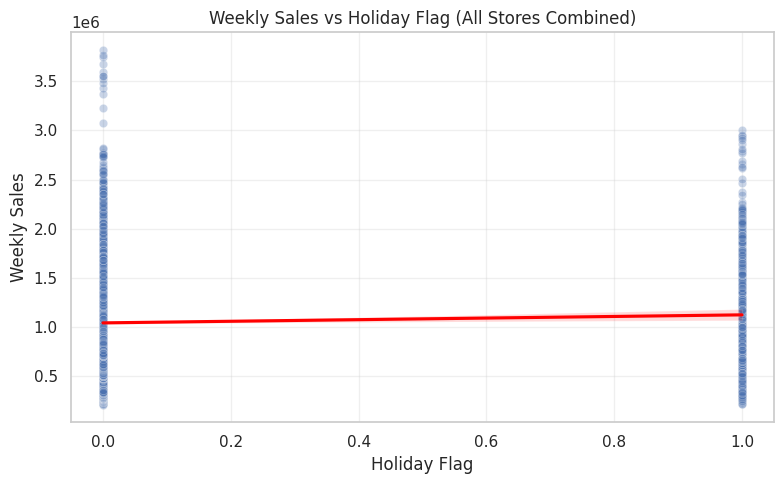

In [574]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='Holiday_Flag', y='Weekly_Sales', data=df, alpha=0.3)

sns.regplot(
    x='Holiday_Flag',
    y='Weekly_Sales',
    data=df,
    scatter=False,
    color='red'
)

plt.title("Weekly Sales vs Holiday Flag (All Stores Combined)")
plt.xlabel("Holiday Flag")
plt.ylabel("Weekly Sales")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


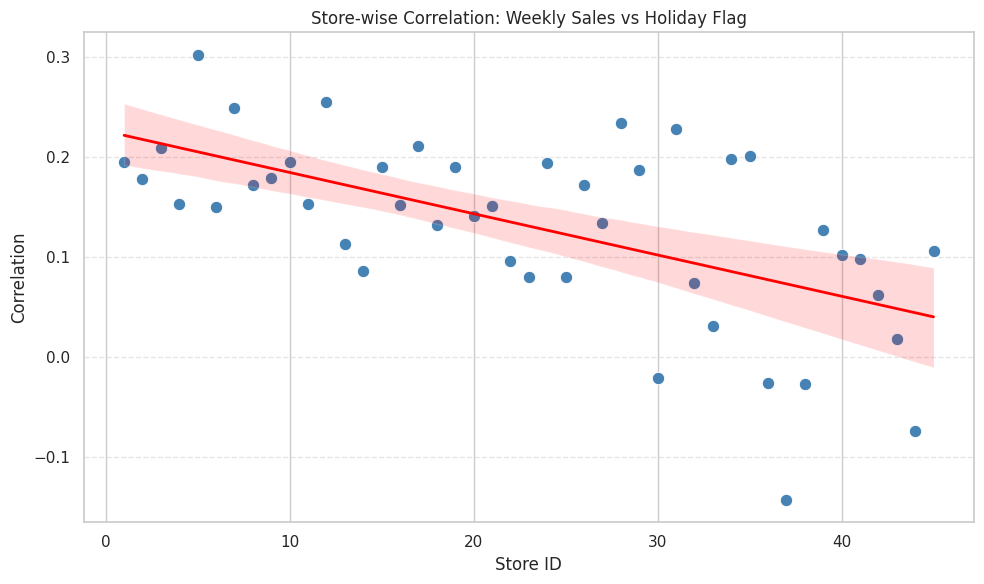

In [575]:
plt.figure(figsize=(10,6))

# Scatter plot: Store ID vs Correlation
sns.scatterplot(
    x=store_sales_holiday_corr.index,
    y=store_sales_holiday_corr.values,
    s=80,
    color='steelblue'
)

# Regression line (trend)
sns.regplot(
    x=store_sales_holiday_corr.index,
    y=store_sales_holiday_corr.values,
    scatter=False,
    color='red',
    line_kws={'linewidth':2}
)

plt.title('Store-wise Correlation: Weekly Sales vs Holiday Flag')
plt.xlabel('Store ID')
plt.ylabel('Correlation')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Weak positive correlation

In [576]:
# Add strongest negative stores
for store_id, corr_value in store_sales_holiday_corr.head(1).items():
    top_corr_list.append({
        'store_id': store_id,
        'column': 'Holiday_Flag',
        'correlation': corr_value
    })

# Add strongest positive stores
for store_id, corr_value in store_sales_holiday_corr.tail(1).items():
    top_corr_list.append({
        'store_id': store_id,
        'column': 'Holiday_Flag',
        'correlation': corr_value
    })


In [577]:
top_corr_list

[{'store_id': 38,
  'column': 'Unemployment',
  'correlation': -0.7852902748572036},
 {'store_id': 44,
  'column': 'Unemployment',
  'correlation': -0.7800764432910212},
 {'store_id': 35,
  'column': 'Unemployment',
  'correlation': 0.48386541981924264},
 {'store_id': 36, 'column': 'Unemployment', 'correlation': 0.8337336178415088},
 {'store_id': 36, 'column': 'CPI', 'correlation': -0.9150952776725542},
 {'store_id': 44, 'column': 'CPI', 'correlation': 0.7401498169960975},
 {'store_id': 38, 'column': 'CPI', 'correlation': 0.8128368242188552},
 {'store_id': 36, 'column': 'Fuel_Price', 'correlation': -0.7274618540899402},
 {'store_id': 35, 'column': 'Fuel_Price', 'correlation': -0.49819689903350917},
 {'store_id': 44, 'column': 'Fuel_Price', 'correlation': 0.6073673757269517},
 {'store_id': 38, 'column': 'Fuel_Price', 'correlation': 0.697184051977453},
 {'store_id': 37,
  'column': 'Holiday_Flag',
  'correlation': -0.14333628402087253},
 {'store_id': 5, 'column': 'Holiday_Flag', 'correla

In [578]:
df.groupby('Date')[['Weekly_Sales', 'Holiday_Flag']].sum()

,Weekly_Sales,Holiday_Flag
Date,,
2010-02-05,49750740.50,0
2010-02-12,48336677.63,45
2010-02-19,48276993.78,0
2010-02-26,43968571.13,0
2010-03-05,46871470.30,0
...,...,...
2012-09-28,43734899.40,0
2012-10-05,47566639.31,0
2012-10-12,46128514.25,0


In [579]:
df.groupby('Date')[['Weekly_Sales', 'Holiday_Flag']].sum()['Holiday_Flag'].unique()

array([ 0, 45])

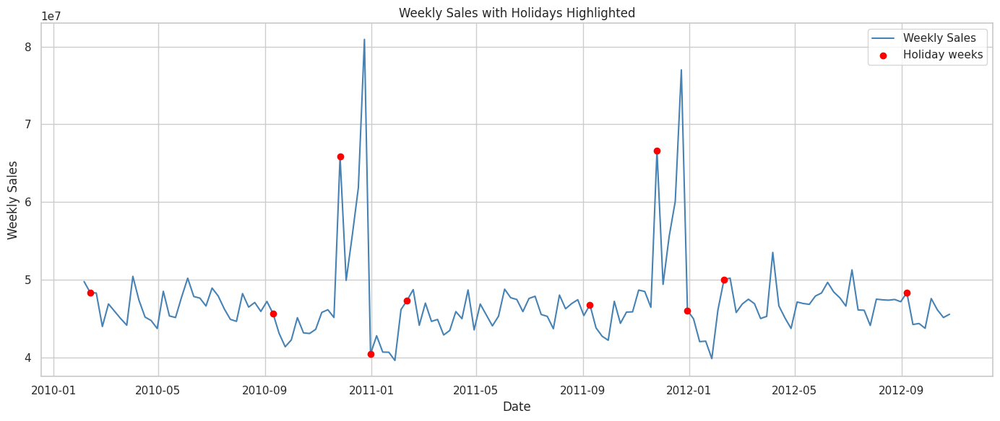

In [580]:
# Ensure Date is datetime and used as index
weekly = df.groupby('Date')[['Weekly_Sales', 'Holiday_Flag']].sum().sort_index()

plt.figure(figsize=(14, 6))

# 1. Plot all weekly sales as a line
plt.plot(weekly.index, weekly['Weekly_Sales'], color='steelblue', label='Weekly Sales')

# 2. Select holiday weeks (Holiday_Flag > 0)
holiday_weeks = weekly[weekly['Holiday_Flag'] > 0]

# 3. Overlay holiday points in a different color
plt.scatter(
    holiday_weeks.index,
    holiday_weeks['Weekly_Sales'],
    color='red',
    label='Holiday weeks',
    zorder=3
)

plt.title('Weekly Sales with Holidays Highlighted')
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.legend()
plt.tight_layout()
plt.show()

Although Holiday_Flag appears only 10–12 times in the 3-year dataset (four major holidays per year), these weeks coincide with the largest spikes in weekly sales across all stores. The holiday effect is consistent, domain-relevant, and statistically safe to include because Holiday_Flag has very low multicollinearity (VIF ≈ 1).

Therefore, Holiday_Flag was included as an exogenous variable in all SARIMAX models.
For stores with strong correlations to CPI, Fuel Price, or Unemployment, the corresponding economic variable was added along with Holiday_Flag. For all other stores, Holiday_Flag was used as the sole exogenous regressor.

### Global Prediction

In [581]:
import prophet

In [582]:
print(prophet.__version__)

1.2.1


In [583]:
from prophet import Prophet


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


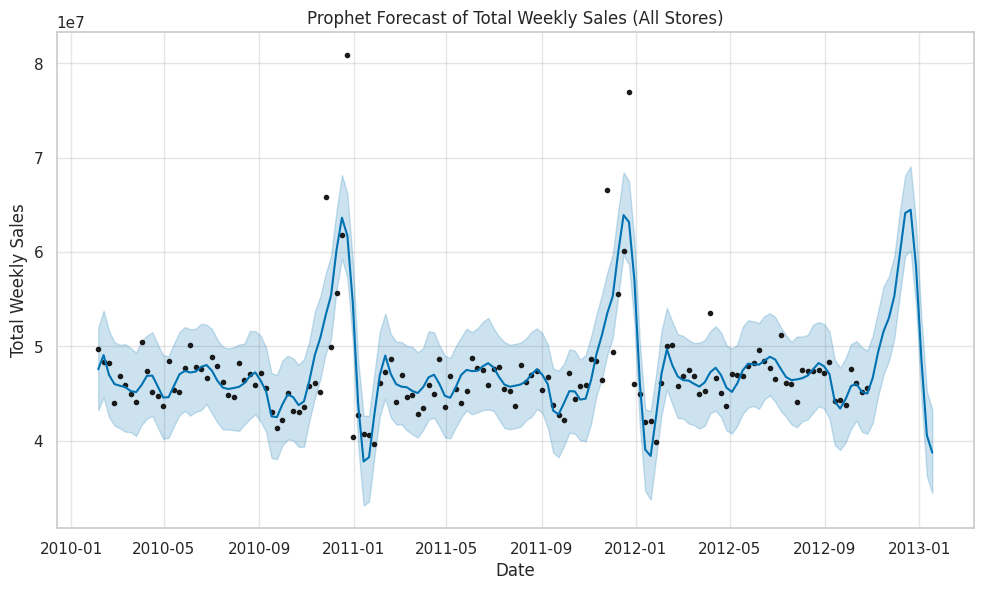

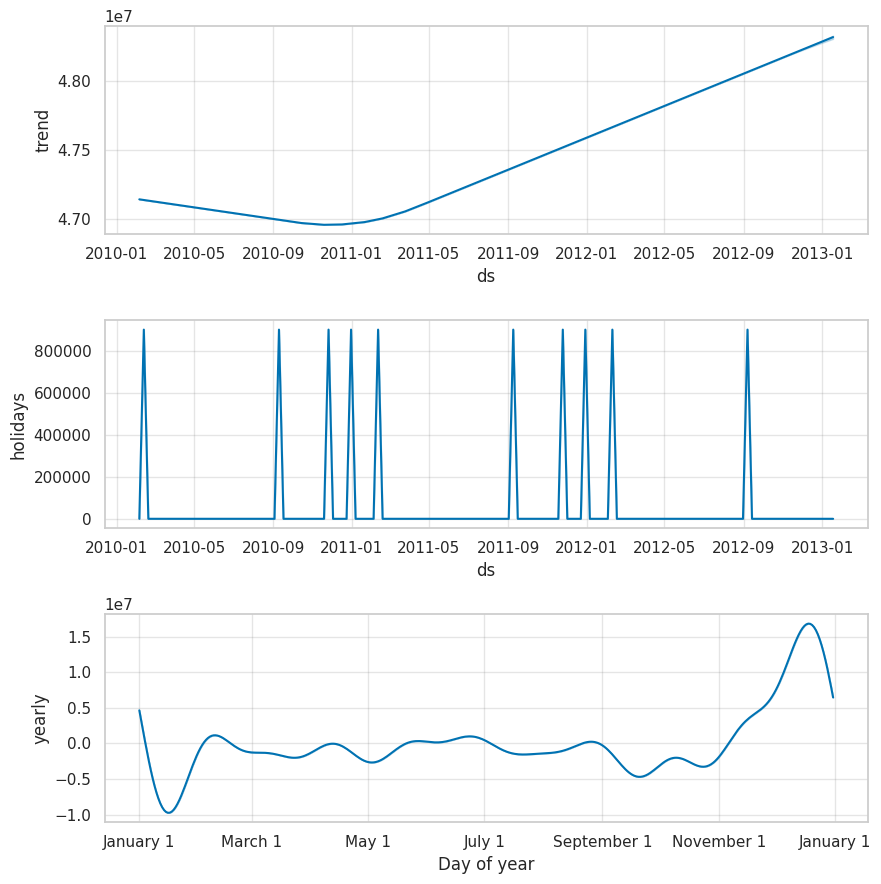

,ds,yhat,yhat_lower,yhat_upper
143,2012-11-02,4.666318e+07,4.188614e+07,5.114094e+07
144,2012-11-09,4.941455e+07,4.474019e+07,5.373838e+07
145,2012-11-16,5.160466e+07,4.699324e+07,5.635357e+07
146,2012-11-23,5.303113e+07,4.846610e+07,5.743613e+07
147,2012-11-30,5.536616e+07,5.088432e+07,5.960686e+07
148,2012-12-07,5.972001e+07,5.542287e+07,6.429222e+07
149,2012-12-14,6.414091e+07,5.961483e+07,6.815360e+07
150,2012-12-21,6.449237e+07,6.014140e+07,6.909159e+07
151,2012-12-28,5.846134e+07,5.428206e+07,6.309812e+07
152,2013-01-04,4.855577e+07,4.433834e+07,5.293248e+07


In [584]:
global_sales = df.groupby('Date')['Weekly_Sales'].sum().reset_index()

# Prophet format
global_sales = global_sales.rename(columns={'Date':'ds', 'Weekly_Sales':'y'})

# -------------------------
# PREPARE HOLIDAY DATAFRAME
# -------------------------
# Extract dates where Holiday_Flag = 1
holiday_df = df[df['Holiday_Flag'] == 1][['Date']].drop_duplicates()
holiday_df = holiday_df.rename(columns={'Date':'ds'})
holiday_df['holiday'] = 'holiday'

# -------------------------
# CREATE & FIT PROPHET MODEL
# -------------------------
global_prophet_model = Prophet(
    holidays=holiday_df
)

global_prophet_model.fit(global_sales)

# -------------------------
# FORECAST 12 WEEKS AHEAD
# -------------------------
global_prophet_future = global_prophet_model.make_future_dataframe(periods=12, freq='W-FRI')
global_prophet_forecast = global_prophet_model.predict(global_prophet_future)

# -------------------------
# PLOT FORECAST
# -------------------------
fig1 = global_prophet_model.plot(global_prophet_forecast)
plt.title("Prophet Forecast of Total Weekly Sales (All Stores)")
plt.xlabel("Date")
plt.ylabel("Total Weekly Sales")
plt.show()

# -------------------------
# PLOT COMPONENTS
# -------------------------
fig2 = global_prophet_model.plot_components(global_prophet_forecast)
plt.show()

# -------------------------
# SHOW FORECAST TABLE
# -------------------------
global_prophet_forecast[['ds','yhat','yhat_lower','yhat_upper']].tail(12)


In [783]:
with open(f"{BASE_PATH}/global_prophet_model.pkl", "wb") as f:
    pickle.dump(global_prophet_model, f)

In [784]:
with open(f"{BASE_PATH}/global_prophet_model.pkl", "rb") as f:
    retrieved_global_prophet_model = pickle.load(f)

In [785]:
global_prophet_forecast.to_csv(f"{BASE_PATH}/global_prophet_forecast.csv")

In [797]:
retrieved_global_prophet_forecast = pd.read_csv(f"{BASE_PATH}/global_prophet_forecast.csv", index_col=0, parse_dates=['ds'])

In [787]:
retrieved_global_prophet_forecast.index

Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,
       ...
       145, 146, 147, 148, 149, 150, 151, 152, 153, 154],
      dtype='int64', length=155)

In [788]:
global_prophet_forecast.index

RangeIndex(start=0, stop=155, step=1)

In [790]:
(retrieved_global_prophet_forecast.columns).equals(global_prophet_forecast.columns)

True

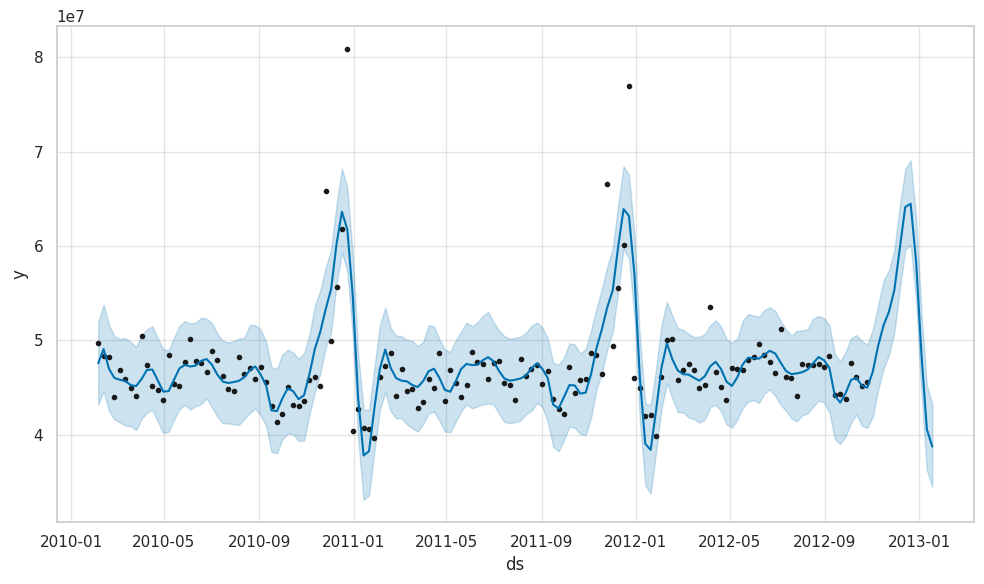

In [795]:
retrieved_global_prophet_model.plot(global_prophet_forecast)
plt.show()

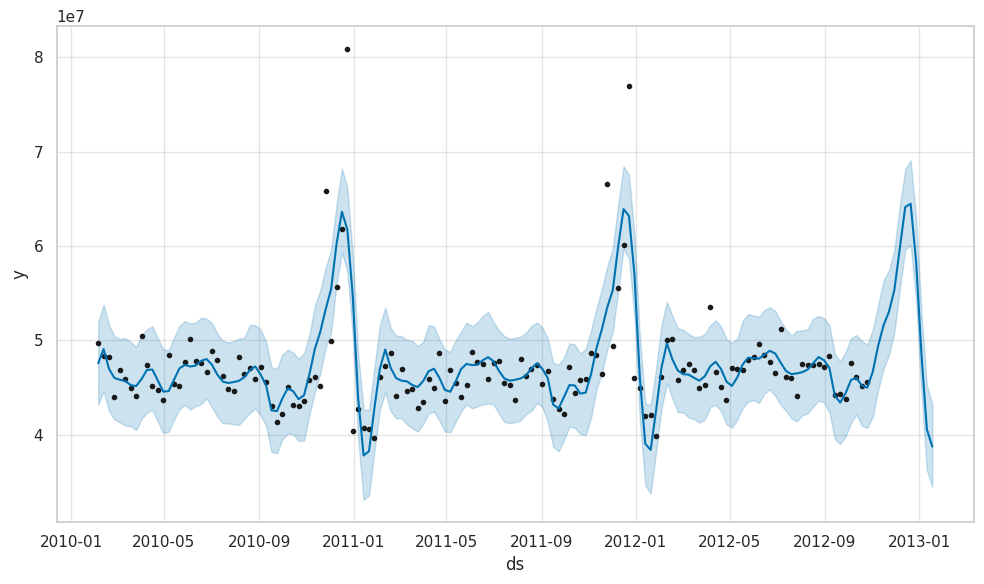

In [799]:
retrieved_global_prophet_model.plot(retrieved_global_prophet_forecast)
plt.show()

In [782]:
global_prophet_forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,holiday,holiday_lower,holiday_upper,holidays,holidays_lower,holidays_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2010-02-05,4.714397e+07,4.320891e+07,5.195393e+07,4.714397e+07,4.714397e+07,4.281757e+05,4.281757e+05,4.281757e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.281757e+05,4.281757e+05,4.281757e+05,0.0,0.0,0.0,4.757214e+07
1,2010-02-12,4.713922e+07,4.459496e+07,5.380065e+07,4.713922e+07,4.713922e+07,1.942807e+06,1.942807e+06,1.942807e+06,901558.812324,901558.812324,901558.812324,901558.812324,901558.812324,901558.812324,1.041248e+06,1.041248e+06,1.041248e+06,0.0,0.0,0.0,4.908202e+07
2,2010-02-19,4.713446e+07,4.249231e+07,5.165730e+07,4.713446e+07,4.713446e+07,-1.553260e+05,-1.553260e+05,-1.553260e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.553260e+05,-1.553260e+05,-1.553260e+05,0.0,0.0,0.0,4.697914e+07
3,2010-02-26,4.712971e+07,4.161447e+07,5.044342e+07,4.712971e+07,4.712971e+07,-1.118123e+06,-1.118123e+06,-1.118123e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.118123e+06,-1.118123e+06,-1.118123e+06,0.0,0.0,0.0,4.601159e+07
4,2010-03-05,4.712496e+07,4.130849e+07,5.015745e+07,4.712496e+07,4.712496e+07,-1.298248e+06,-1.298248e+06,-1.298248e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.298248e+06,-1.298248e+06,-1.298248e+06,0.0,0.0,0.0,4.582671e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,2012-12-21,4.826173e+07,6.014140e+07,6.909159e+07,4.825536e+07,4.826704e+07,1.623064e+07,1.623064e+07,1.623064e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.623064e+07,1.623064e+07,1.623064e+07,0.0,0.0,0.0,6.449237e+07
151,2012-12-28,4.827500e+07,5.428206e+07,6.309812e+07,4.826732e+07,4.828141e+07,1.018635e+07,1.018635e+07,1.018635e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.018635e+07,1.018635e+07,1.018635e+07,0.0,0.0,0.0,5.846134e+07
152,2013-01-04,4.828826e+07,4.433834e+07,5.293248e+07,4.827889e+07,4.829597e+07,2.675054e+05,2.675054e+05,2.675054e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.675054e+05,2.675054e+05,2.675054e+05,0.0,0.0,0.0,4.855577e+07
153,2013-01-11,4.830153e+07,3.622348e+07,4.520873e+07,4.829045e+07,4.831072e+07,-7.731514e+06,-7.731514e+06,-7.731514e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-7.731514e+06,-7.731514e+06,-7.731514e+06,0.0,0.0,0.0,4.057002e+07


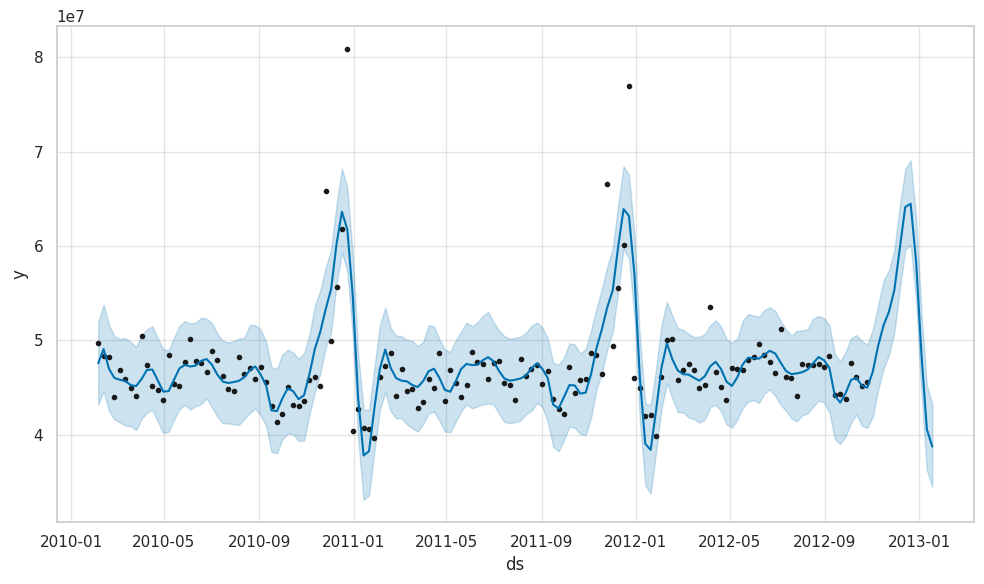

In [585]:
fig1 = global_prophet_model.plot(global_prophet_forecast)

In [586]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

In [587]:

global_actual = global_sales.set_index('ds').y

global_pred = global_prophet_forecast.set_index('ds').loc[global_actual.index, 'yhat']


In [588]:
mean_squared_error(global_actual, global_pred)

12163165404323.504

In [589]:
mean_absolute_percentage_error(global_actual, global_pred)

0.040046071805485625

4% only Mean absolute percentage error

### For individual stores

#### Manual ARIMA for Store 1

In [590]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

In [591]:
df_store1 = df[df['Store'] == 1]

In [592]:
df_store1.set_index('Date', inplace=True)

In [593]:
df_store1.sort_index(inplace=True)

In [594]:
df_store1['Weekly_Sales']

,Weekly_Sales
Date,
2010-02-05,1643690.90
2010-02-12,1641957.44
2010-02-19,1611968.17
2010-02-26,1409727.59
2010-03-05,1554806.68
...,...
2012-09-28,1437059.26
2012-10-05,1670785.97
2012-10-12,1573072.81


In [595]:
df_store1.index = pd.DatetimeIndex(df_store1.index, freq='W-FRI')

In [596]:
def check_stationarity(timeseries): # assuming timeseries has no null
  result = adfuller(timeseries) #defult autolag is 'AIC' only
  p_value = result[1]
  print(f'ADF Statistic: {result[0]}')
  print(f'p-value: {p_value}')
  if (p_value < 0.05):
    print("We reject the Null Hypothesis → Data is stationary")
  else:
    print("We fail to reject the Null Hypothesis → Data is non-stationary")

In [597]:
# -------------------------------
# Check Stationarity (ADF) for d value
# -------------------------------
adfuller(df_store1['Weekly_Sales'])

(np.float64(-5.102186145192288),
 np.float64(1.3877788330759434e-05),
 4,
 138,
 {'1%': np.float64(-3.47864788917503),
  '5%': np.float64(-2.882721765644168),
  '10%': np.float64(-2.578065326612056)},
 np.float64(3412.7325502876756))

In [598]:
check_stationarity(df_store1['Weekly_Sales'])

ADF Statistic: -5.102186145192288
p-value: 1.3877788330759434e-05
We reject the Null Hypothesis → Data is stationary


No need to differentiate. Data is already stationary

d = 0

<Figure size 1200x500 with 0 Axes>

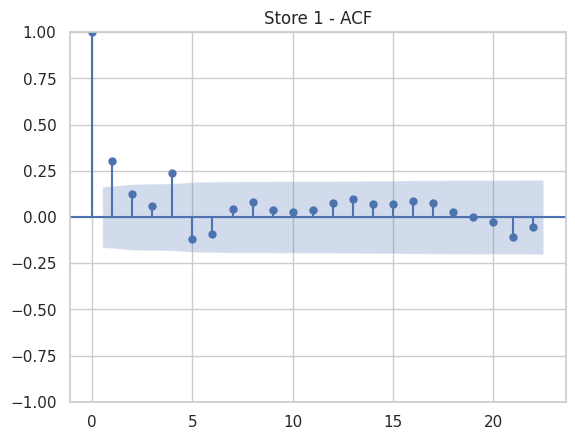

In [599]:
plt.figure(figsize=(12,5))
plot_acf(df_store1['Weekly_Sales'])
plt.title("Store 1 - ACF")
plt.show()

In [600]:
from statsmodels.tsa.stattools import acf, pacf

In [601]:
acf(df_store1['Weekly_Sales'])

array([ 1.00000000e+00,  3.01635656e-01,  1.26974514e-01,  5.95362841e-02,
        2.36146134e-01, -1.21624770e-01, -9.43666039e-02,  4.33021304e-02,
        7.96540288e-02,  4.05626132e-02,  2.61507459e-02,  3.56719033e-02,
        7.57698431e-02,  9.86570501e-02,  7.17244497e-02,  7.28252346e-02,
        8.65362111e-02,  7.69704528e-02,  2.51809071e-02,  9.58824335e-05,
       -2.83444094e-02, -1.07344425e-01])

<Figure size 1200x500 with 0 Axes>

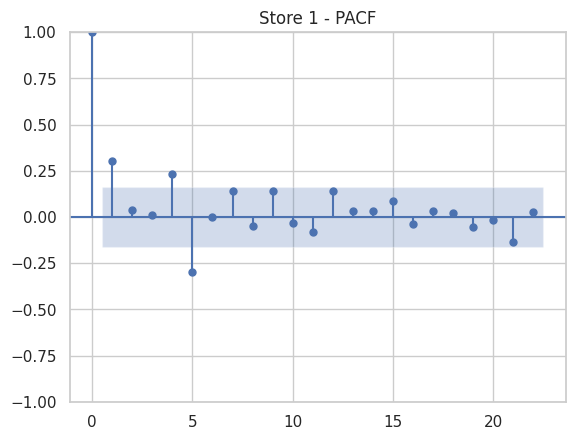

In [602]:
plt.figure(figsize=(12,5))
plot_pacf(df_store1['Weekly_Sales'])
plt.title("Store 1 - PACF")
plt.show()


In [603]:
pacf(df_store1['Weekly_Sales'])

array([ 1.        ,  0.30375985,  0.04021628,  0.01219543,  0.23927843,
       -0.30788835, -0.0014493 ,  0.14798536, -0.05206473,  0.1547872 ,
       -0.03652748, -0.08797706,  0.16184013,  0.03250986,  0.03380417,
        0.10062548, -0.04966531,  0.04265725,  0.02866535, -0.0672978 ,
       -0.0144685 , -0.16282794])

In [604]:
df_store1['Weekly_Sales']

,Weekly_Sales
Date,
2010-02-05,1643690.90
2010-02-12,1641957.44
2010-02-19,1611968.17
2010-02-26,1409727.59
2010-03-05,1554806.68
...,...
2012-09-28,1437059.26
2012-10-05,1670785.97
2012-10-12,1573072.81


In [605]:
from statsmodels.tsa.arima.model import ARIMA

In [606]:
store1_model = ARIMA(df_store1['Weekly_Sales'], order=(1,0,1))
store1_result = store1_model.fit()

In [607]:
store1_result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:           Weekly_Sales   No. Observations:                  143
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -1905.383
Date:                Sun, 30 Nov 2025   AIC                           3818.767
Time:                        06:36:02   BIC                           3830.618
Sample:                    02-05-2010   HQIC                          3823.583
                         - 10-26-2012                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.555e+06   2.24e+04     69.381      0.000    1.51e+06     1.6e+06
ar.L1          0.4740      0.313      1.517      0.129      -0.139       1.087
ma.L1         -0.1934      0.361     -0.536      0.592      -0.900       0.513
sigma2      2.227e+10      0.178   1.25e+11      0.000    2.23e+10    2.23e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):               263.14
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               0.82   Skew:                             1.65
Prob(H) (two-sided):                  0.48   Kurtosis:                         8.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.21e+30. Standard errors may be unstable.
"""

In [608]:
mean_squared_error(df_store1['Weekly_Sales'], store1_result.fittedvalues)

21910721599.250786

In [609]:
mean_absolute_percentage_error(df_store1['Weekly_Sales'], store1_result.fittedvalues)

0.06523226542357217

6% MAPE in store1 prediction using ARIMA

In [610]:
store1_result.fittedvalues

,0
Date,
2010-02-05,1.555264e+06
2010-02-12,1.581656e+06
2010-02-19,1.584736e+06
2010-02-26,1.576877e+06
2010-03-05,1.518602e+06
...,...
2012-09-28,1.540574e+06
2012-10-05,1.519252e+06
2012-10-12,1.580719e+06


Future 12 weeks forecast

In [611]:
store1_result.forecast(steps=12)

,predicted_mean
2012-11-02,1.535786e+06
2012-11-09,1.546032e+06
2012-11-16,1.550888e+06
2012-11-23,1.553190e+06
2012-11-30,1.554281e+06
2012-12-07,1.554798e+06
2012-12-14,1.555043e+06
2012-12-21,1.555160e+06
2012-12-28,1.555215e+06
2013-01-04,1.555241e+06


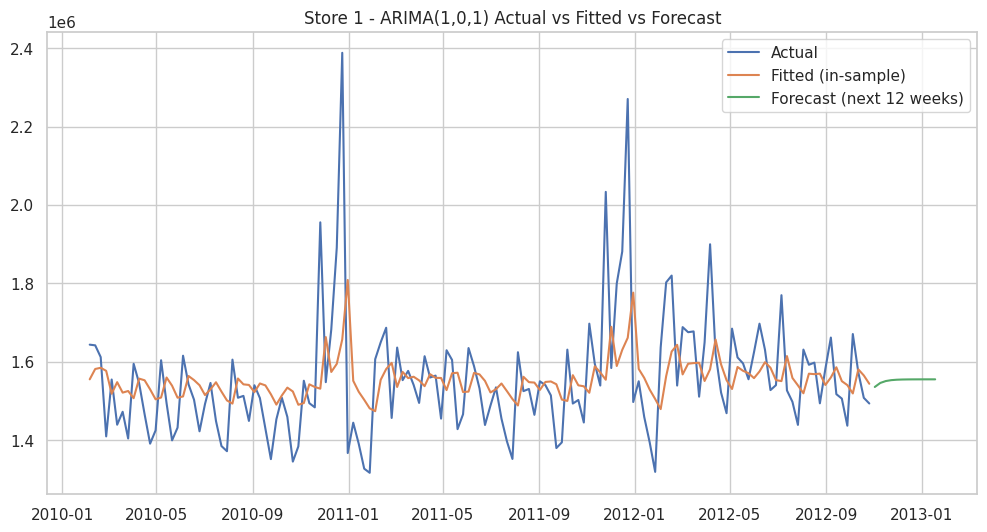

In [612]:
plt.figure(figsize=(12,6))
plt.plot(df_store1['Weekly_Sales'], label='Actual')
plt.plot(store1_result.fittedvalues, label='Fitted (in-sample)')
plt.plot(store1_result.forecast(steps=12), label='Forecast (next 12 weeks)')
plt.legend()
plt.title("Store 1 - ARIMA(1,0,1) Actual vs Fitted vs Forecast")
plt.show()


From plot we can see the next 12 weeks prediction is not good enough and a plain line

#### Auto Arima on Store 44

**Auto-ARIMA → SARIMAX Workflow**

1. Run `auto_arima()` to automatically find the optimal (p,d,q) and (P,D,Q,s).
2. Extract:
   - `auto_model.order`
   - `auto_model.seasonal_order`
3. Fit the real SARIMAX model using statsmodels:
   - `SARIMAX(y, exog, order, seasonal_order)`
4. Use SARIMAX for:
   - summary statistics
   - diagnostics
   - forecasting with confidence intervals
5. Auto-ARIMA is for *order selection*, SARIMAX is for *final modeling*.


In [613]:
!pip install pmdarima

In [614]:
from pmdarima import auto_arima

In [615]:
df_store44 = df[df['Store'] == 44]

In [616]:
df_store44.set_index('Date', inplace=True)

In [617]:
df_store1.index = pd.DatetimeIndex(df_store1.index, freq='W-FRI')

In [618]:
df_store44_weeklySales = df_store44['Weekly_Sales']

In [619]:
df[df['Store'] == 44]['Fuel_Price'].mean()

np.float64(3.2861468531468536)

In [620]:
store44_exog = df_store44['Fuel_Price']

In [621]:
store44_model = auto_arima(
    df_store44_weeklySales
)

In [622]:
store44_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  143
Model:               SARIMAX(1, 1, 1)   Log Likelihood               -1608.227
Date:                Sun, 30 Nov 2025   AIC                           3224.453
Time:                        06:36:12   BIC                           3236.276
Sample:                    02-05-2010   HQIC                          3229.258
                         - 10-26-2012                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    641.2568    963.685      0.665      0.506   -1247.531    2530.044
ar.L1          0.1155      0.072      1.607      0.108      -0.025       0.256
ma.L1         -0.5439      0.092     -5.917      0.000      -0.724      -0.364
sigma2      3.973e+08      0.003   1.29e+11      0.000    3.97e+08    3.97e+08
===================================================================================
Ljung-Box (L1) (Q):                  13.96   Jarque-Bera (JB):               526.30
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.56   Skew:                             0.45
Prob(H) (two-sided):                  0.05   Kurtosis:                        12.39
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.75e+27. Standard errors may be unstable.
"""

In [623]:
store44_model = auto_arima(
    df_store44_weeklySales,
    exogenous=store44_exog
)

In [624]:
store44_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  143
Model:               SARIMAX(1, 1, 1)   Log Likelihood               -1608.227
Date:                Sun, 30 Nov 2025   AIC                           3224.453
Time:                        06:36:15   BIC                           3236.276
Sample:                    02-05-2010   HQIC                          3229.258
                         - 10-26-2012                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    641.2568    963.685      0.665      0.506   -1247.531    2530.044
ar.L1          0.1155      0.072      1.607      0.108      -0.025       0.256
ma.L1         -0.5439      0.092     -5.917      0.000      -0.724      -0.364
sigma2      3.973e+08      0.003   1.29e+11      0.000    3.97e+08    3.97e+08
===================================================================================
Ljung-Box (L1) (Q):                  13.96   Jarque-Bera (JB):               526.30
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.56   Skew:                             0.45
Prob(H) (two-sided):                  0.05   Kurtosis:                        12.39
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.75e+27. Standard errors may be unstable.
"""

In [625]:
store44_model = auto_arima(
    df_store44_weeklySales,
    exogenous=store44_exog,
    seasonal=True,
    m=52,                # weekly seasonality
    start_p=0, start_q=0,
    max_p=4, max_q=4,
    start_P=0, start_Q=0,
    max_P=2, max_Q=2,
    d=None, D=None,
    trace=True,
    error_action='ignore',
    suppress_warnings=True,
    stepwise=True
)


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[52] intercept   : AIC=3253.446, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[52] intercept   : AIC=3215.694, Time=3.13 sec
 ARIMA(0,1,1)(0,0,1)[52] intercept   : AIC=3228.951, Time=4.63 sec
 ARIMA(0,1,0)(0,0,0)[52]             : AIC=3251.538, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[52] intercept   : AIC=3235.639, Time=0.18 sec
 ARIMA(1,1,0)(2,0,0)[52] intercept   : AIC=3216.983, Time=28.29 sec
 ARIMA(1,1,0)(1,0,1)[52] intercept   : AIC=3217.064, Time=4.01 sec
 ARIMA(1,1,0)(0,0,1)[52] intercept   : AIC=3218.313, Time=1.13 sec
 ARIMA(1,1,0)(2,0,1)[52] intercept   : AIC=inf, Time=40.17 sec
 ARIMA(0,1,0)(1,0,0)[52] intercept   : AIC=3237.629, Time=0.70 sec
 ARIMA(2,1,0)(1,0,0)[52] intercept   : AIC=3219.649, Time=1.23 sec
 ARIMA(1,1,1)(1,0,0)[52] intercept   : AIC=3231.202, Time=1.46 sec
 ARIMA(0,1,1)(1,0,0)[52] intercept   : AIC=3226.903, Time=1.18 sec
 ARIMA(2,1,1)(1,0,0)[52] intercept   : AIC=3233.759, Time=2.63 sec
 ARIMA(1,1,0)(1,0,0)[5

In [626]:
store44_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  143
Model:             SARIMAX(1, 1, 0)x(1, 0, 0, 52)   Log Likelihood               -1603.915
Date:                            Sun, 30 Nov 2025   AIC                           3213.829
Time:                                    06:38:15   BIC                           3222.697
Sample:                                02-05-2010   HQIC                          3217.433
                                     - 10-26-2012                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2670      0.014    -19.351      0.000      -0.294      -0.240
ar.S.L52       0.2710      0.019     14.016      0.000       0.233       0.309
sigma2      3.171e+08   5.37e-12    5.9e+19      0.000    3.17e+08    3.17e+08
===================================================================================
Ljung-Box (L1) (Q):                  27.09   Jarque-Bera (JB):               405.31
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.47   Skew:                            -0.27
Prob(H) (two-sided):                  0.01   Kurtosis:                        11.26
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.38e+34. Standard errors may be unstable.
"""

In [800]:
store44_model.params()

,0
ar.L1,-2.669664e-01
ar.S.L52,2.709705e-01
sigma2,3.171119e+08


**Understanding ARIMA/SARIMA Parameters: p, d, q, P, D, Q, s**

Time-series forecasting using ARIMA/SARIMA models is based on two sets of parameters:
non-seasonal components `(p, d, q)` and seasonal components `(P, D, Q)s`.

---

**1. Non-Seasonal Parameters (Short-Term Behavior)** — *(p, d, q)*

- **p – AutoRegressive (AR) order**  
  Number of lagged past values used.  
  Example: *p = 1* means the model uses last week’s sales to predict this week.

- **d – Differencing order**  
  Number of times the series is differenced to remove trend and achieve stationarity.  
  Example: *d = 1* means first differencing is applied.

- **q – Moving Average (MA) order**  
  Number of past error terms used.  
  Example: *q = 1* means the previous week's error influences this week’s prediction.

These parameters capture **short-range, week-to-week patterns**.

---

**2. Seasonal Parameters (Long-Term Yearly Behavior)** — *(P, D, Q)s*

Seasonal effects repeat after a fixed number of periods.  
For weekly Walmart sales, **s = 52** (annual cycle).

- **P – Seasonal AR order**  
  AR terms at seasonal lags.  
  Example: *P = 1* means the model uses sales from the same week last year (lag 52).

- **D – Seasonal differencing order**  
  Differences at seasonal intervals to remove repeated yearly structure.  
  Example: *D = 1* means `y[t] – y[t−52]`.

- **Q – Seasonal MA order**  
  MA terms at seasonal lags.  
  Example: *Q = 1* means the model uses the error from the same week last year.

These parameters capture **long-range, year-over-year patterns**, such as holiday peaks.

---

**3. Complete SARIMA Model Structure**

A full SARIMA model is written as:

$
\text{SARIMA}(p, d, q) \times (P, D, Q)_s
$

Example from this project:

$
\text{SARIMAX}(1, 1, 0) \times (1, 0, 0)_{52}
$

This means:
- ARIMA(1,1,0) handles week-to-week behavior  
- Seasonal AR(1) at lag 52 handles yearly repetition  
- Differencing is used to ensure stationarity  
- No seasonal differencing or seasonal MA terms were needed

---

**4. Reference Table**

| Parameter | Meaning | Typical Range (Walmart Weekly Data) |
|----------|---------|--------------------------------------|
| **p** | AR lag | 0–3 |
| **d** | differencing | 0 or 1 |
| **q** | MA lag | 0–2 |
| **P** | seasonal AR | **1** most common |
| **D** | seasonal differencing | 0 or 1 |
| **Q** | seasonal MA | 0 or 1 |
| **s** | seasonal period | **52 weeks** |

---

**Summary**

- Lowercase parameters `(p, d, q)` capture **short-term weekly behavior**.  
- Uppercase parameters `(P, D, Q)` capture **long-term yearly seasonality**.  
- `s` defines the seasonal cycle length (52 for weekly data).  
- SARIMA models combine both to produce accurate forecasts for seasonal retail data like Walmart weekly sales.


In [632]:
store44_order = store44_model.order
store44_seasonal_order = store44_model.seasonal_order

print("Order (p,d,q):", store44_order)
print("Seasonal (P,D,Q,s):", store44_seasonal_order)

Order (p,d,q): (1, 1, 0)
Seasonal (P,D,Q,s): (1, 0, 0, 52)


In [633]:
import statsmodels.api as sm

We set enforce_stationarity=False and enforce_invertibility=False to allow the SARIMAX model to estimate parameters freely without imposing unnecessary mathematical constraints.
These constraints often cause convergence failures or prevent the model from fitting realistic retail time-series data that naturally exhibit near-unit-root or boundary behaviors.
Disabling them improves numerical stability and yields better-fitting models.

In [634]:
store44_sarimax_model = sm.tsa.statespace.SARIMAX(
    df_store44_weeklySales,
    exog=store44_exog,
    order=store44_order,
    seasonal_order=store44_seasonal_order,
    enforce_stationarity=False,
    enforce_invertibility=False
)

store44_sarimax_results = store44_sarimax_model.fit()
print(store44_sarimax_results.summary())


/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


                                     SARIMAX Results                                      
Dep. Variable:                       Weekly_Sales   No. Observations:                  143
Model:             SARIMAX(1, 1, 0)x(1, 0, 0, 52)   Log Likelihood                -960.483
Date:                            Sun, 30 Nov 2025   AIC                           1928.966
Time:                                    06:41:57   BIC                           1938.920
Sample:                                02-05-2010   HQIC                          1932.978
                                     - 10-26-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Fuel_Price -1.627e+04   1.59e+04     -1.021      0.307   -4.75e+04     1.5e+04
ar.L1         -0.6196      0.100   

Just using dummy extended exog

In [635]:
store44_future_exog = store44_exog.tail(1).repeat(12).values.reshape(12, -1)

store44_forecast = store44_sarimax_results.get_forecast(steps=12, exog=store44_future_exog)
store44_pred_mean = store44_forecast.predicted_mean
store44_conf_int = store44_forecast.conf_int()

print(store44_pred_mean)

2012-11-02    338471.539161
2012-11-09    355400.726193
2012-11-16    345401.366782
2012-11-23    349555.030405
2012-11-30    330809.696471
2012-12-07    344378.516566
2012-12-14    346607.470196
2012-12-21    385396.013131
2012-12-28    317084.200746
2013-01-04    353734.693066
2013-01-11    345557.473961
2013-01-18    348330.387907
Freq: W-FRI, Name: predicted_mean, dtype: float64


In [636]:
store44_sarimax_results.forecast(steps=12, exog=store44_future_exog) == store44_pred_mean

,predicted_mean
2012-11-02,True
2012-11-09,True
2012-11-16,True
2012-11-23,True
2012-11-30,True
2012-12-07,True
2012-12-14,True
2012-12-21,True
2012-12-28,True
2013-01-04,True


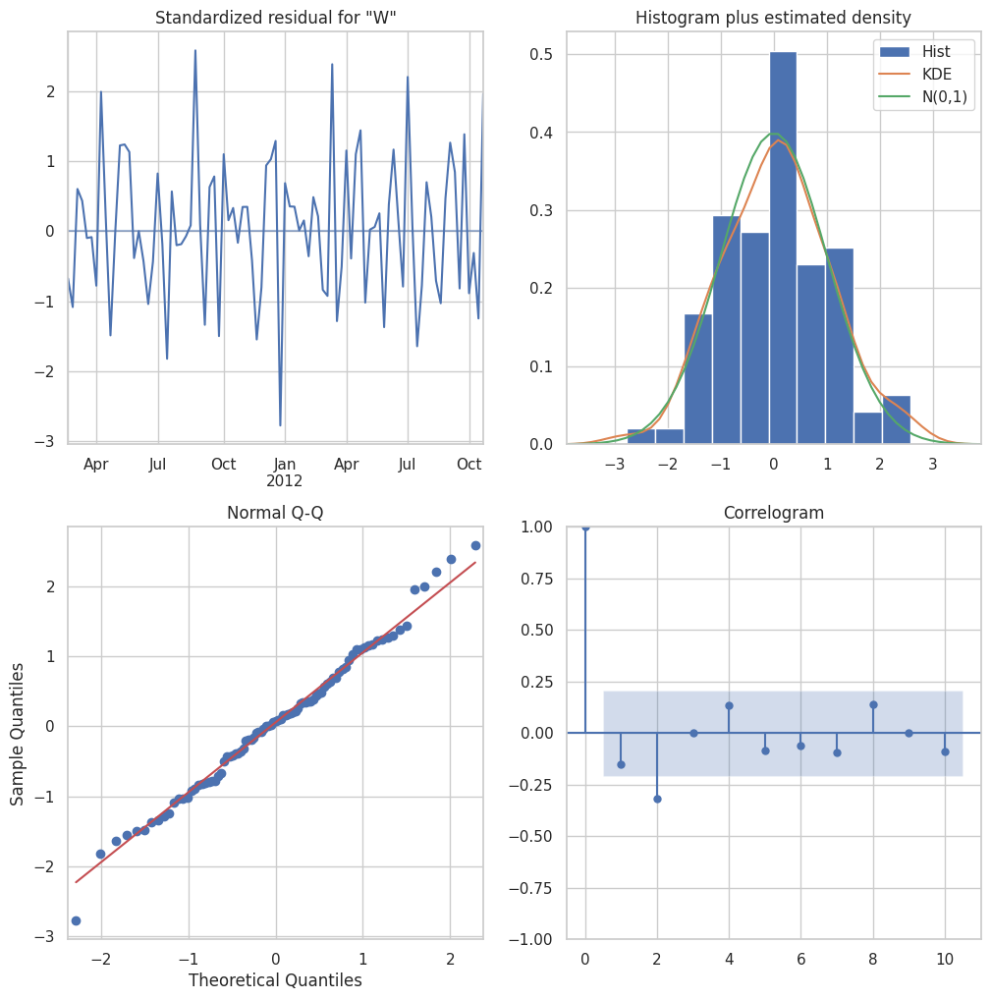

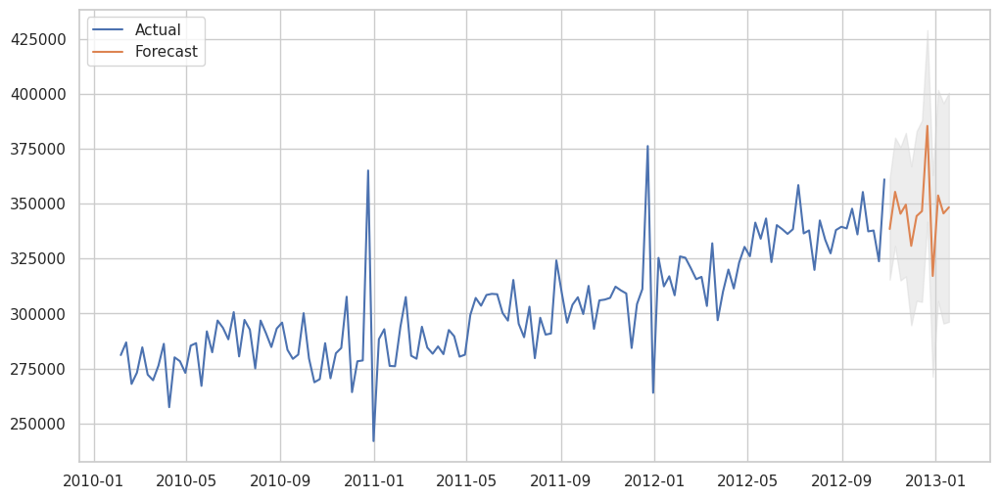

In [637]:
store44_sarimax_results.plot_diagnostics(figsize=(12,12))
plt.show()

plt.figure(figsize=(12,6))
plt.plot(df_store44_weeklySales, label="Actual")
plt.plot(store44_pred_mean.index, store44_pred_mean, label="Forecast")
plt.fill_between(
    store44_pred_mean.index,
    store44_conf_int.iloc[:,0],
    store44_conf_int.iloc[:,1],
    color="lightgray", alpha=0.4
)
plt.legend()
plt.show()


#### Filling for future exog columns

In [638]:
import holidays

In [639]:
df2 = df.copy()

In [640]:
def second_sunday_feb(year: int) -> pd.Timestamp:
    # All days in February for that year
    feb = pd.date_range(start=f'{year}-02-01', end=f'{year}-02-28', freq='D')
    # Filter Sundays (weekday() == 6 for Sunday in pandas)
    sundays = [d for d in feb if d.weekday() == 6]
    # Return the 2nd Sunday
    return sundays[1].date()

# Example
print(second_sunday_feb(2011))
print(second_sunday_feb(2012))

2011-02-13
2012-02-12


In [641]:
def get_US_holidays(year) :
    holidays_in_us = holidays.US(years=[year])
    holidays_in_us = {date: name for date, name in holidays_in_us.items() if name in {"Labor Day", "Thanksgiving Day"}}
    holidays_in_us_dates = list(holidays_in_us.keys())
    holidays_in_us_dates.append(second_sunday_feb(year))
    return holidays_in_us_dates

In [642]:
get_US_holidays(2010)

[datetime.date(2010, 9, 6),
 datetime.date(2010, 11, 25),
 datetime.date(2010, 2, 14)]

In [643]:
# Function: for a given Friday (or week index), check if any US holiday falls in that week
def is_holiday_week(ts):
    # ts is the index date (Friday in your weekly data)

    if ts.month == 12 and 25 <= ts.day <= 31:
        return 1

    monday = (ts - pd.Timedelta(days=ts.weekday())).date()
    sunday = monday + pd.Timedelta(days=6)
    # any holiday date between monday and sunday?
    for h_date in get_US_holidays(ts.year):
        if monday <= h_date <= sunday:
            return 1
    return 0

df2['Holiday_Flag_from_lib'] = df2['Date'].map(is_holiday_week)

In [644]:
(df2['Holiday_Flag'] == df2['Holiday_Flag_from_lib']).all()

np.True_

In [645]:
last_date = df_store1.index[-1]

# Generate next 12 Fridays
forecast_dates = pd.date_range(start=last_date + pd.Timedelta(weeks=1), periods=12, freq='W-FRI')

In [646]:
# Apply your is_holiday_week function to each future Friday
next_12weeks_holidays = [is_holiday_week(ts) for ts in forecast_dates]

# Build the exog dataframe for the next 12 weeks (start with Holiday_Flag)
next_12weeks_exog = pd.DataFrame(
    index=forecast_dates,
    data={
        'Holiday_Flag': next_12weeks_holidays
        # later you can add Temperature, CPI, Unemployment forecasts here
    }
)

next_12weeks_exog

,Holiday_Flag
2012-11-02,0
2012-11-09,0
2012-11-16,0
2012-11-23,1
2012-11-30,0
2012-12-07,0
2012-12-14,0
2012-12-21,0
2012-12-28,1
2013-01-04,0


In [647]:
num_cols

['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']

In [648]:
set(num_cols) - {'Weekly_Sales'}

{'CPI', 'Fuel_Price', 'Temperature', 'Unemployment'}

In [649]:
df_store44['Unemployment']

,Unemployment
Date,
2010-02-05,8.119
2010-02-12,8.119
2010-02-19,8.119
2010-02-26,8.119
2010-03-05,8.119
...,...
2012-09-28,5.407
2012-10-05,5.217
2012-10-12,5.217


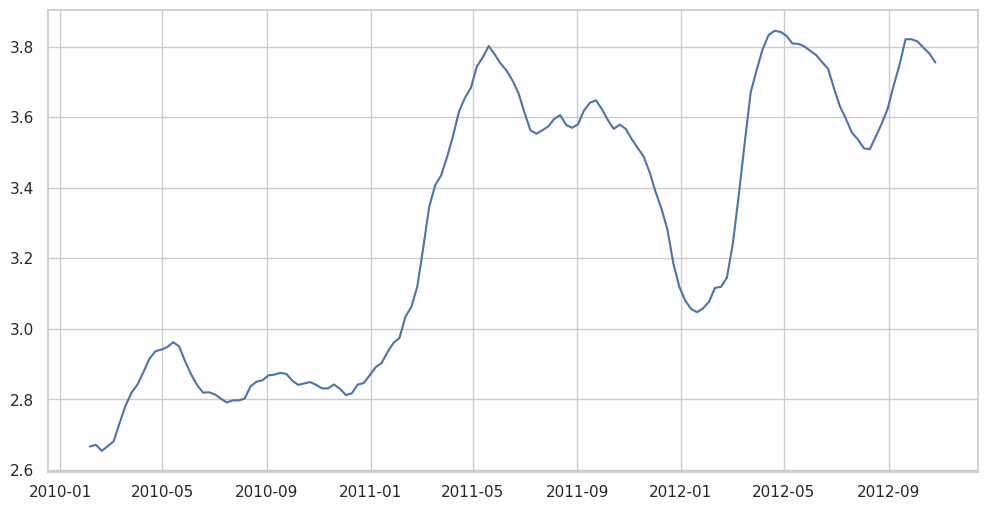

In [650]:
fig = plt.figure(figsize=(12,6))
plt.plot(df_store44['Fuel_Price'])

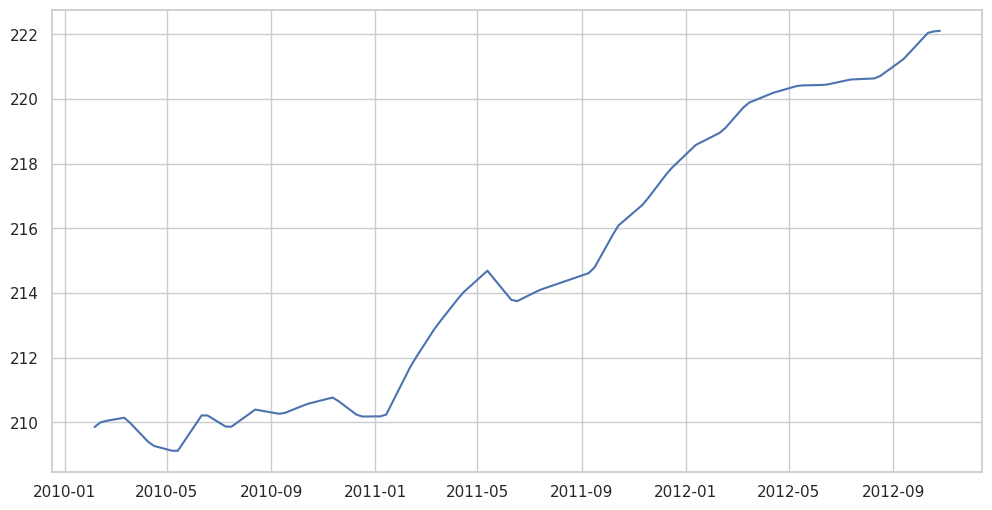

In [651]:
fig = plt.figure(figsize=(12,6))
plt.plot(df[df['Store']==36][['Date','CPI']].copy().set_index('Date'))

<Figure size 640x480 with 0 Axes>

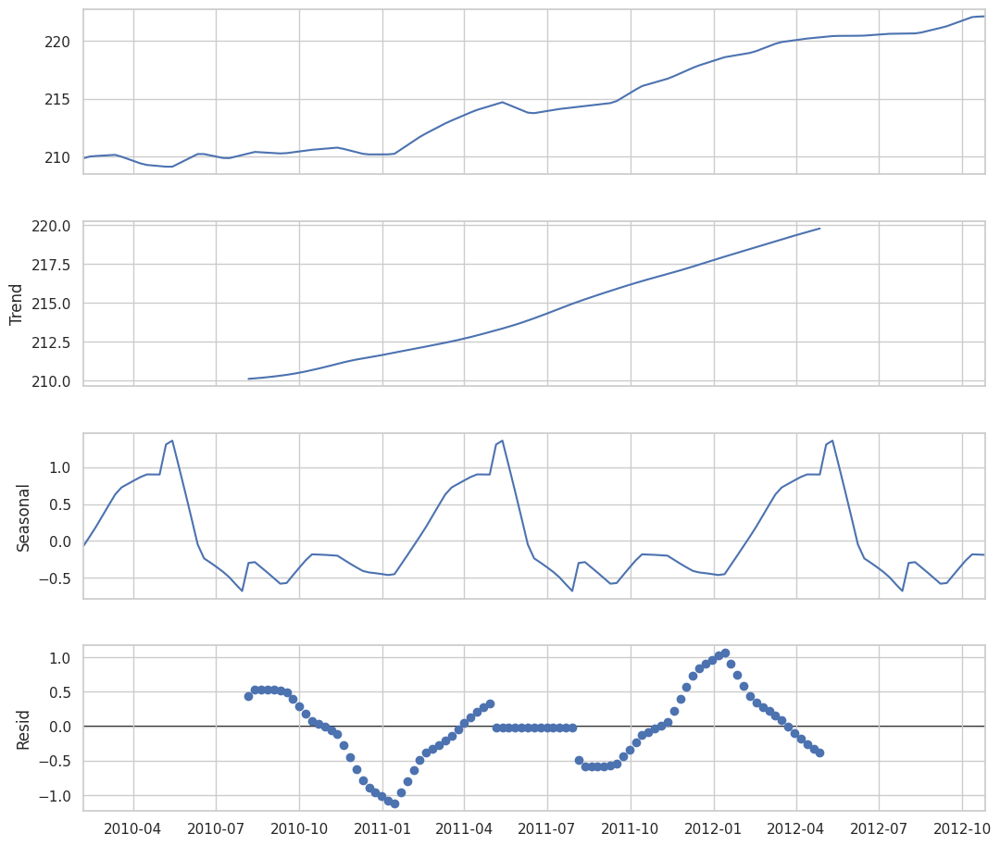

In [652]:
from statsmodels.tsa.seasonal import seasonal_decompose

CPI_decomposition = seasonal_decompose(df[df['Store']==36][['Date','CPI']].copy().set_index('Date'), period=52)
fig = plt.figure()
fig = CPI_decomposition.plot()
fig.set_size_inches(12, 10)
plt.show()

<Figure size 640x480 with 0 Axes>

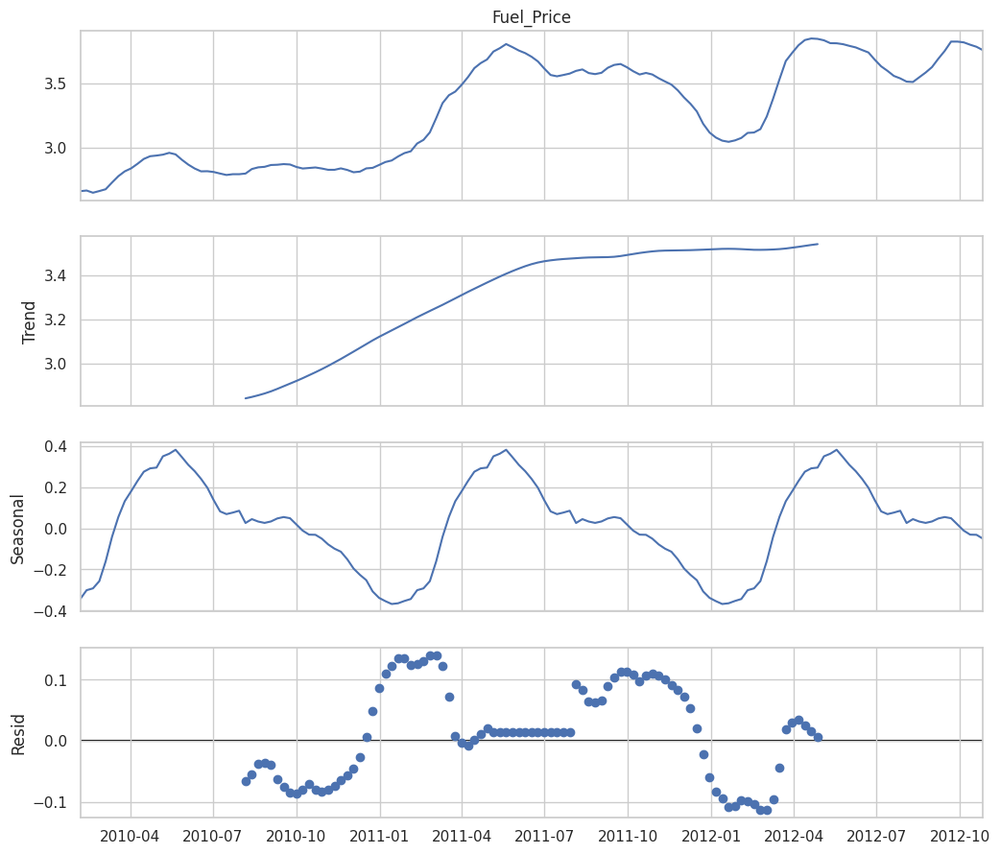

In [653]:
Fuel_Price_decomposition = seasonal_decompose(df_store44['Fuel_Price'], period=52)
fig = plt.figure()
fig = Fuel_Price_decomposition.plot()
fig.set_size_inches(12, 10)
plt.show()

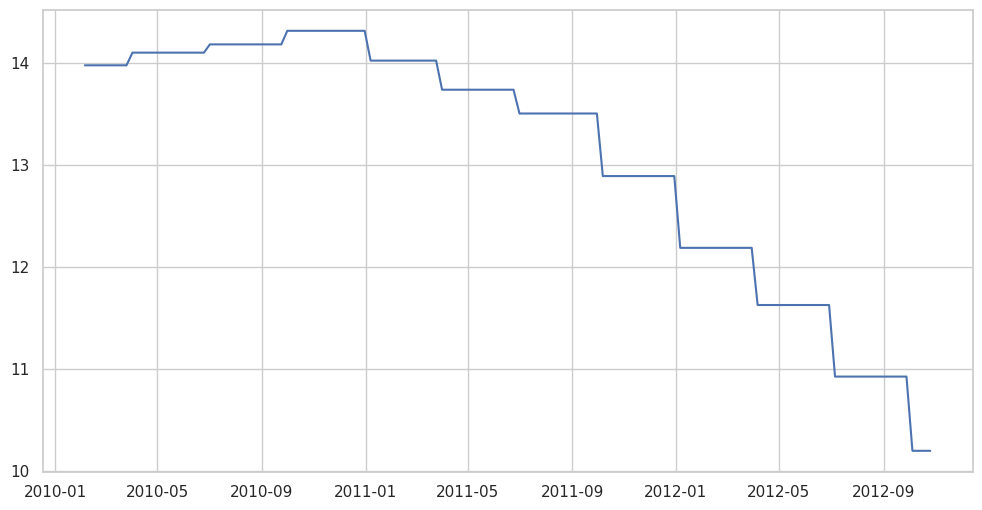

In [654]:
fig = plt.figure(figsize=(12,6))
plt.plot(df[df['Store']==38][['Date','Unemployment']].copy().set_index('Date'))

In [656]:
store44_fuel_price_auto_arima = auto_arima(
        df_store44['Fuel_Price'],
        seasonal=True,
        m=52,                # yearly cycle
        start_p=0, start_q=0,
        max_p=2, max_q=2,
        d=None, D=None,
        stepwise=True,
        suppress_warnings=True,
        trace=True
    )

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[52] intercept   : AIC=-532.922, Time=5.49 sec
 ARIMA(0,1,0)(0,0,0)[52] intercept   : AIC=-506.687, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[52] intercept   : AIC=-687.397, Time=7.39 sec
 ARIMA(0,1,1)(0,0,1)[52] intercept   : AIC=inf, Time=3.37 sec
 ARIMA(0,1,0)(0,0,0)[52]             : AIC=-503.579, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[52] intercept   : AIC=-677.597, Time=0.06 sec
 ARIMA(1,1,0)(2,0,0)[52] intercept   : AIC=inf, Time=35.64 sec
 ARIMA(1,1,0)(1,0,1)[52] intercept   : AIC=inf, Time=10.37 sec
 ARIMA(1,1,0)(0,0,1)[52] intercept   : AIC=-685.668, Time=3.11 sec
 ARIMA(1,1,0)(2,0,1)[52] intercept   : AIC=-684.710, Time=20.50 sec
 ARIMA(0,1,0)(1,0,0)[52] intercept   : AIC=-534.575, Time=5.39 sec
 ARIMA(2,1,0)(1,0,0)[52] intercept   : AIC=-689.311, Time=6.76 sec
 ARIMA(2,1,0)(0,0,0)[52] intercept   : AIC=-679.225, Time=0.21 sec
 ARIMA(2,1,0)(2,0,0)[52] intercept   : AIC=-688.409, Time=40.97 sec
 ARIMA(2,1,0)(1,0,1)[52] inter

In [658]:
pd.DataFrame(store44_exog)

,Fuel_Price
Date,
2010-02-05,2.666
2010-02-12,2.671
2010-02-19,2.654
2010-02-26,2.667
2010-03-05,2.681
...,...
2012-09-28,3.821
2012-10-05,3.815
2012-10-12,3.797


In [659]:
store44_sales_auto_arima = auto_arima(
        df_store44['Weekly_Sales'],
        X=pd.DataFrame(store44_exog),
        m=52,                # yearly cycle
        start_p=0, start_q=0,
        max_p=2, max_q=2,
        trace=True
    )

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[52] intercept   : AIC=3243.616, Time=1.52 sec
 ARIMA(0,1,0)(0,0,0)[52] intercept   : AIC=3255.279, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[52] intercept   : AIC=3226.049, Time=1.26 sec
 ARIMA(0,1,1)(0,0,1)[52] intercept   : AIC=3244.216, Time=2.48 sec
 ARIMA(0,1,0)(0,0,0)[52]             : AIC=3816.139, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[52] intercept   : AIC=3235.517, Time=0.26 sec
 ARIMA(1,1,0)(2,0,0)[52] intercept   : AIC=3227.246, Time=7.49 sec
 ARIMA(1,1,0)(1,0,1)[52] intercept   : AIC=3227.390, Time=2.09 sec
 ARIMA(1,1,0)(0,0,1)[52] intercept   : AIC=3228.111, Time=1.09 sec
 ARIMA(1,1,0)(2,0,1)[52] intercept   : AIC=inf, Time=47.00 sec
 ARIMA(0,1,0)(1,0,0)[52] intercept   : AIC=3242.061, Time=0.92 sec
 ARIMA(2,1,0)(1,0,0)[52] intercept   : AIC=3232.832, Time=1.57 sec
 ARIMA(1,1,1)(1,0,0)[52] intercept   : AIC=3247.429, Time=2.86 sec
 ARIMA(0,1,1)(1,0,0)[52] intercept   : AIC=3220.708, Time=5.06 sec
 ARIMA(0,1,1)(0,0,0)[52

In [660]:
store44_sales_auto_arima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  143
Model:             SARIMAX(0, 1, 1)x(1, 0, [], 52)   Log Likelihood               -1605.354
Date:                             Sun, 30 Nov 2025   AIC                           3220.708
Time:                                     06:49:52   BIC                           3235.487
Sample:                                 02-05-2010   HQIC                          3226.713
                                      - 10-26-2012                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    732.8727   1344.615      0.545      0.586   -1902.525    3368.270
Fuel_Price -1.603e+04   1.14e+04     -1.405      0.160   -3.84e+04    6337.187
ma.L1         -0.2809      0.036     -7.838      0.000      -0.351      -0.211
ar.S.L52       0.2116      0.024      8.728      0.000       0.164       0.259
sigma2      3.805e+08      4.985   7.63e+07      0.000     3.8e+08     3.8e+08
===================================================================================
Ljung-Box (L1) (Q):                  25.84   Jarque-Bera (JB):               477.10
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.49   Skew:                            -0.11
Prob(H) (two-sided):                  0.02   Kurtosis:                        11.98
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.01e+24. Standard errors may be unstable.
"""

In [661]:
store44_sales_auto_arima.params()

,0
intercept,7.328727e+02
Fuel_Price,-1.602869e+04
ma.L1,-2.809026e-01
ar.S.L52,2.115568e-01
sigma2,3.804562e+08


In [662]:
store44_sales_auto_arima.predict_in_sample(X=pd.DataFrame(store44_exog))

,predicted_mean
2010-02-05,-41802.957163
2010-02-12,198067.285800
2010-02-19,263265.131479
2010-02-26,267360.298114
2010-03-05,272177.828247
...,...
2012-09-28,337761.396066
2012-10-05,353815.070512
2012-10-12,338805.775424
2012-10-19,341846.893609


In [663]:
pd.DataFrame(store44_exog).columns

Index(['Fuel_Price'], dtype='object')

In [664]:
pd.DataFrame(store44_sales_auto_arima.predict_in_sample(X=pd.DataFrame(store44_exog)))

,predicted_mean
2010-02-05,-41802.957163
2010-02-12,198067.285800
2010-02-19,263265.131479
2010-02-26,267360.298114
2010-03-05,272177.828247
...,...
2012-09-28,337761.396066
2012-10-05,353815.070512
2012-10-12,338805.775424
2012-10-19,341846.893609


In [665]:
(store44_sales_auto_arima.predict_in_sample(X=pd.DataFrame(store44_exog)).index == df_store44.index).all()

np.True_

In [666]:
mean_absolute_percentage_error(store44_sales_auto_arima.predict_in_sample(X=pd.DataFrame(store44_exog)), df_store44['Weekly_Sales'])

0.09565293807442458

In [667]:
((df_store1['Weekly_Sales'] - store44_sales_auto_arima.predict_in_sample(X=pd.DataFrame(store44_exog)))/df_store44['Weekly_Sales']).mean() * 100

np.float64(415.9109724899162)

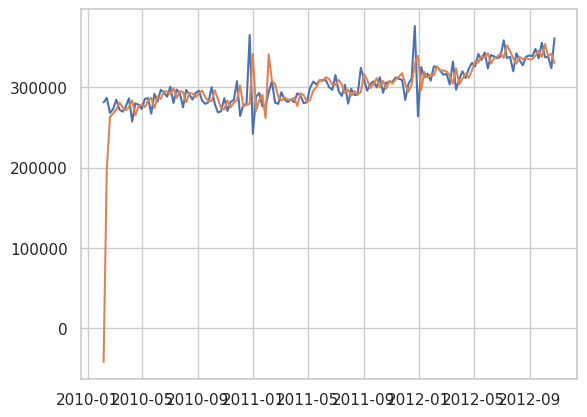

In [668]:
plt.plot(df_store44['Weekly_Sales'])
plt.plot(store44_sales_auto_arima.predict_in_sample(X=pd.DataFrame(store44_exog)))

### Predicting for all 45 stores

In [732]:
import pickle
import os

In [670]:
final_selected_exog = [{'store_id': 36, 'column': 'CPI', 'correlation': -0.9150952776725542},

{'store_id': 38, 'column': 'Unemployment', 'correlation': -0.7852902748572036},

{'store_id': 44, 'column': 'Fuel_Price', 'correlation': 0.6073673757269517}]

In [671]:
final_selected_exog

[{'store_id': 36, 'column': 'CPI', 'correlation': -0.9150952776725542},
 {'store_id': 38,
  'column': 'Unemployment',
  'correlation': -0.7852902748572036},
 {'store_id': 44, 'column': 'Fuel_Price', 'correlation': 0.6073673757269517}]

In [728]:
next_12weeks_exog.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 12 entries, 2012-11-02 to 2013-01-18
Freq: W-FRI
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   Holiday_Flag  12 non-null     int64
dtypes: int64(1)
memory usage: 192.0 bytes


In [729]:
next_12weeks_exog.index = pd.DatetimeIndex(next_12weeks_exog.index, freq='W-FRI')

In [731]:
next_12weeks_exog.sort_index(inplace=True)

In [730]:
print(next_12weeks_exog)

            Holiday_Flag
2012-11-02             0
2012-11-09             0
2012-11-16             0
2012-11-23             1
2012-11-30             0
2012-12-07             0
2012-12-14             0
2012-12-21             0
2012-12-28             1
2013-01-04             0
2013-01-11             0
2013-01-18             0


In [727]:
def predict_using_auto_arima(input_series, exog_df=None, future_exog_df=None, m=1):
    auto_arima_model = auto_arima(
        input_series,
        X=exog_df,
        m=m,
        start_p=0, start_q=0,
        max_p=2, max_q=2
    )

    predicted = auto_arima_model.predict_in_sample(X=exog_df)

    mse = mean_squared_error(input_series, predicted)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(input_series, predicted)

    print(f"MSE for {input_series.name} : {mse}")
    print(f"RMSE for {input_series.name} : {rmse}")
    print(f"MAPE for {input_series.name} : {mape}")

    future_predicted = auto_arima_model.predict(n_periods=12, X=future_exog_df)

    return auto_arima_model, predicted, future_predicted

In [733]:
def get_auto_arima_results(store_id, col_name, input_series, future_index, exog_df=None, future_exog_df=None, m=1):

    prefix = f"{store_id}_{col_name}"
    model_path   = f"{BASE_PATH}/{prefix}_auto_arima_model.pkl"
    pred_path    = f"{BASE_PATH}/{prefix}_predicted.csv"
    fut_pred_path = f"{BASE_PATH}/{prefix}_future_predicted.csv"

    if os.path.exists(model_path) and os.path.exists(pred_path) and os.path.exists(fut_pred_path):
        # LOAD FROM DRIVE
        with open(model_path, "rb") as f:
            auto_arima_model = pickle.load(f)

        predicted = pd.read_csv(pred_path, index_col=0).squeeze("columns")
        future_predicted = pd.read_csv(fut_pred_path, index_col=0).squeeze("columns")

        # Ensure arrays for further use
        predicted = predicted.values
        future_predicted = future_predicted.values
    else:
        # FIT AND SAVE
        print(f"Auto Arima for store {store_id} - column {col_name}")
        auto_arima_model, predicted, future_predicted = predict_using_auto_arima(
            input_series,
            exog_df=exog_df,
            future_exog_df=future_exog_df,
            m=m
        )
        print("------------------------------------------------------------------------------")

        # Save model
        with open(model_path, "wb") as f:
            pickle.dump(auto_arima_model, f)

        # Save predictions with index
        pd.Series(predicted, index=input_series.index, name=col_name).to_csv(pred_path)
        pd.Series(future_predicted, index=future_index, name=col_name).to_csv(fut_pred_path)

    return auto_arima_model, predicted, future_predicted

In [734]:
default_exog_column = 'Holiday_Flag'

In [735]:
default_historic_exog = df[['Date',default_exog_column]].drop_duplicates()
default_historic_exog.set_index('Date', inplace=True)
default_historic_exog.index = pd.DatetimeIndex(default_historic_exog.index, freq='W-FRI')
default_historic_exog.sort_index(inplace=True)

In [736]:
default_historic_exog.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 143 entries, 2010-02-05 to 2012-10-26
Freq: W-FRI
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   Holiday_Flag  143 non-null    int64
dtypes: int64(1)
memory usage: 2.2 KB


In [737]:
default_historic_exog

,Holiday_Flag
Date,
2010-02-05,0
2010-02-12,1
2010-02-19,0
2010-02-26,0
2010-03-05,0
...,...
2012-09-28,0
2012-10-05,0
2012-10-12,0


In [738]:
def get_df_store(df, store_id):
    df_store = df[df['Store'] == store_id].copy()
    if 'Date' in df_store.columns:
        df_store.set_index('Date', inplace=True)
        df_store.index = pd.DatetimeIndex(df_store.index, freq='W-FRI')
        df_store.sort_index(inplace=True)
    return df_store

In [739]:
def build_exog(df_store, store_id):
    # 1) Work on a copy
    exog_future = next_12weeks_exog.copy()
    historic_exog = default_historic_exog.copy()

    # 2) Find config for this store_id, if any
    cfg = next((d for d in final_selected_exog if d['store_id'] == store_id), None)
    if cfg is None:
        # No extra columns needed, just return copy
        return historic_exog, exog_future

    col_name = cfg['column']

    # 3) Check if column exists

    if col_name not in df_store.columns:
        raise ValueError(f"Column {col_name} not found for Store {store_id}")

    historic_exog[col_name] = df_store[col_name]

    # 4) Get

    m=52

    if col_name == 'Unemployment':
        m=1

    auto_arima_model, predicted, future_predicted = get_auto_arima_results(
       store_id=store_id,
       col_name=col_name,
       input_series=df_store[col_name],
       future_index=exog_future.index,
       m=m
       )

    # Build a Series with same index as exog_future
    future_series = pd.Series(future_predicted, index=exog_future.index, name=col_name)

    # 5) Combine with exog_future
    exog_future[col_name] = future_series

    # 6) Validation checks
    # Future exog checks
    if exog_future.isnull().any().any():
        raise ValueError("exog_future has NaNs after adding extra columns.")

    if len(exog_future) != 12:
        raise ValueError(f"exog_future must have 12 rows, found {len(exog_future)}.")

    if not exog_future.index.equals(next_12weeks_exog.index):
        raise ValueError("exog_future index mismatch after adding extra columns.")

    # Historic exog checks
    if historic_exog.isnull().any().any():
        raise ValueError("historic_exog has NaNs after adding extra columns.")

    if not historic_exog.index.is_monotonic_increasing:
        raise ValueError("historic_exog index must be sorted and increasing.")

    return historic_exog, exog_future

In [740]:
def get_predictions_for_a_store(df, store_id) :
    df_store = get_df_store(df, store_id)
    historic_exog, exog_future = build_exog(df_store, store_id)

    auto_arima_model, predicted, future_predicted = get_auto_arima_results(
        store_id=store_id,
        col_name='Weekly_Sales',
        input_series=df_store['Weekly_Sales'],
        future_index=next_12weeks_exog.index,
        exog_df=historic_exog,
        future_exog_df=exog_future,
        m=52
    )
    return predicted, future_predicted

In [741]:
store_weekly

Store,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-02-05,1643690.90,2136989.46,461622.22,2135143.87,317173.10,1652635.10,496725.44,1004137.09,549505.55,2193048.75,1528008.64,1100046.37,1967220.53,2623469.95,652122.44,477409.30,789036.02,1205307.50,1507637.17,2401395.47,798593.88,1033017.37,1364721.58,1388725.63,677231.63,1034119.21,1874289.79,1672352.29,538634.46,465108.52,1469252.05,1087616.19,274593.43,956228.96,1230613.50,467546.74,536006.73,358496.14,1230596.80,1001943.80,1086533.18,543384.01,647029.28,281090.95,890689.51
2010-02-12,1641957.44,2137809.50,420728.96,2188307.39,311825.70,1606283.86,524104.92,994801.40,552677.48,2176028.52,1574684.08,1117863.33,2030933.46,1704218.84,682447.10,472044.28,841951.91,1187880.70,1536549.95,2109107.90,809321.44,1022571.25,1380892.08,1414107.10,583364.02,1015684.09,1745362.72,1558968.49,529672.95,497374.57,1543947.23,1123566.12,294882.83,994610.99,1168815.31,469563.70,529852.70,342214.90,1266229.07,955338.29,1075656.34,575709.96,682918.99,286857.13,656988.64
2010-02-19,1611968.17,2124451.54,421642.19,2049860.26,303447.57,1567138.07,506760.54,963960.37,511327.90,2113432.58,1503298.70,1095421.65,1970274.64,2204556.70,660838.75,469868.70,800714.00,1150663.42,1515976.11,2161549.76,867283.25,988467.61,1319588.04,1385362.49,676260.67,999348.55,1945070.33,1491300.42,542399.07,463513.26,1473386.75,1082559.06,296850.83,983963.07,1270658.64,470281.03,510382.50,327237.92,1230591.97,916289.20,1052034.74,508794.87,658997.55,267956.30,841264.04
2010-02-26,1409727.59,1865097.27,407204.86,1925728.84,270281.63,1432953.21,496083.24,847592.11,473773.27,2006774.96,1336404.65,1048617.17,1817850.32,2095591.63,564883.20,443242.17,749549.55,1068157.45,1373270.06,1898193.95,749597.24,899761.48,1198709.65,1158722.74,628516.57,855385.01,1390934.27,1542173.33,488417.61,472330.71,1344354.41,1053247.10,284052.77,905756.13,1020651.74,447519.44,513615.82,334222.73,1168582.02,863917.41,991941.73,491510.58,618702.79,273079.07,741891.65
2010-03-05,1554806.68,1991013.13,415202.04,1971057.44,288855.71,1601348.82,491419.55,881503.95,507297.88,1987090.09,1426622.65,1077018.27,1939980.43,2237544.75,605325.43,444181.85,783300.05,1179738.50,1495844.57,2119213.72,747444.32,1009201.24,1311175.93,1412387.37,665750.06,1005669.58,1313729.72,1608435.45,535087.91,472591.07,1384870.51,1066566.74,291484.89,918295.79,1162610.27,480203.43,519255.68,372239.89,1266254.21,990152.28,1063557.49,554972.42,658600.05,284617.27,777951.22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-09-28,1437059.26,1746470.56,389813.02,2027620.23,310141.68,1369131.46,525545.76,884724.41,516361.06,1694862.41,1227430.73,880415.67,1927664.11,1522512.20,553901.97,469607.73,972716.24,1002856.20,1338299.02,2008350.58,647097.65,976479.51,1319035.06,1259278.36,683300.84,964726.37,1540687.63,1129508.61,489674.23,425410.04,1279080.58,1157111.15,242813.51,928629.31,814099.86,270677.98,527953.14,398468.08,1495607.07,919595.44,1307928.01,505978.46,577792.32,355307.94,713173.95
2012-10-05,1670785.97,1998321.04,443557.65,2209835.43,343048.29,1518177.71,505830.56,976436.02,606755.30,1758971.38,1422794.26,979825.92,2041918.74,1687592.16,573498.64,471281.68,952609.17,1092204.79,1408016.10,2246411.89,651768.91,1009887.36,1464616.59,1416720.54,699536.73,1095504.26,1591816.88,1462941.03,520632.80,446751.45,1363365.05,1202775.24,265444.90,968896.68,866064.40,277137.86,546122.37,458479.01,1574408.67,1069112.00,1400160.95,593162.53,642614.89,337390.44,733455.07
2012-10-12,1573072.81,1900745.13,410804.39,2133026.07,325345.41,1459396.84,503463.93,927511.99,558464.80,1713889.11,1311965.09,934917.47,1999079.44,1639585.61,551799.63,491817.19,919878.34,1074079.00,1352809.50,2162951.36,653043.44,1004039.84,1412925.25,

In [742]:
# All stores share identical dates
historic_index = (
    df[['Date']]
    .drop_duplicates()
    .sort_values('Date')
)

historic_index = pd.DatetimeIndex(historic_index['Date'], freq='W-FRI')

In [743]:
historic_index

DatetimeIndex(['2010-02-05', '2010-02-12', '2010-02-19', '2010-02-26',
               '2010-03-05', '2010-03-12', '2010-03-19', '2010-03-26',
               '2010-04-02', '2010-04-09',
               ...
               '2012-08-24', '2012-08-31', '2012-09-07', '2012-09-14',
               '2012-09-21', '2012-09-28', '2012-10-05', '2012-10-12',
               '2012-10-19', '2012-10-26'],
              dtype='datetime64[ns]', name='Date', length=143, freq='W-FRI')

In [744]:
future_index = next_12weeks_exog.index
future_index = pd.DatetimeIndex(future_index, freq='W-FRI')

In [745]:
future_index

DatetimeIndex(['2012-11-02', '2012-11-09', '2012-11-16', '2012-11-23',
               '2012-11-30', '2012-12-07', '2012-12-14', '2012-12-21',
               '2012-12-28', '2013-01-04', '2013-01-11', '2013-01-18'],
              dtype='datetime64[ns]', freq='W-FRI')

In [746]:
historic_predictions_df = pd.DataFrame(index=historic_index)
future_predictions_df   = pd.DataFrame(index=future_index)

In [747]:
from tqdm import tqdm
import traceback

store_ids = sorted(df['Store'].unique())

failed_stores = []

for sid in tqdm(store_ids, desc="Processing Stores"):
    try:
        # Run forecasting for this store
        predicted, future_predicted = get_predictions_for_a_store(df, sid)

        # Save predictions
        historic_predictions_df[sid] = predicted
        future_predictions_df[sid]   = future_predicted

    except Exception as e:
        print("\n" + "="*60)
        print(f"ERROR in store {sid}: {e}")
        print("="*60 + '\n')
        traceback.print_exc()
        failed_stores.append((sid, str(e)))
        continue

print("\nLoop Finished.")
print("Failed Stores:", failed_stores)

Processing Stores:   0%|          | 0/45 [00:00<?, ?it/s]

Auto Arima for store 1 - column Weekly_Sales
MSE for Weekly_Sales : 38963331615.21182
RMSE for Weekly_Sales : 197391.31595693826
MAPE for Weekly_Sales : 0.06393063361460116
------------------------------------------------------------------------------


Processing Stores:   2%|▏         | 1/45 [05:24<3:57:51, 324.35s/it]

Auto Arima for store 2 - column Weekly_Sales
MSE for Weekly_Sales : 158170238947.1691
RMSE for Weekly_Sales : 397706.2219115626
MAPE for Weekly_Sales : 0.09997546175477186
------------------------------------------------------------------------------


Processing Stores:   4%|▍         | 2/45 [08:18<2:49:07, 235.99s/it]

Auto Arima for store 3 - column Weekly_Sales
MSE for Weekly_Sales : 2796459504.887795
RMSE for Weekly_Sales : 52881.56110486712
MAPE for Weekly_Sales : 0.061665637170109526
------------------------------------------------------------------------------


Processing Stores:   7%|▋         | 3/45 [15:26<3:46:38, 323.78s/it]

Auto Arima for store 4 - column Weekly_Sales
MSE for Weekly_Sales : 78055027156.26343
RMSE for Weekly_Sales : 279383.29791929835
MAPE for Weekly_Sales : 0.06191649889737816
------------------------------------------------------------------------------


Processing Stores:   9%|▉         | 4/45 [19:23<3:17:51, 289.55s/it]

Auto Arima for store 5 - column Weekly_Sales


Processing Stores:  11%|█         | 5/45 [20:44<2:22:51, 214.29s/it]

MSE for Weekly_Sales : 1689449604.7792144
RMSE for Weekly_Sales : 41102.9147966323
MAPE for Weekly_Sales : 0.06538964113869147
------------------------------------------------------------------------------
Auto Arima for store 6 - column Weekly_Sales
MSE for Weekly_Sales : 109420057362.22696
RMSE for Weekly_Sales : 330787.0271976018
MAPE for Weekly_Sales : 0.10479333350874878
------------------------------------------------------------------------------


Processing Stores:  13%|█▎        | 6/45 [22:01<1:48:57, 167.63s/it]

Auto Arima for store 7 - column Weekly_Sales
MSE for Weekly_Sales : 6254372236.214967
RMSE for Weekly_Sales : 79084.58911959376
MAPE for Weekly_Sales : 0.073242484493179
------------------------------------------------------------------------------


Processing Stores:  16%|█▌        | 7/45 [26:31<2:07:19, 201.03s/it]

Auto Arima for store 8 - column Weekly_Sales
MSE for Weekly_Sales : 33115425029.177917
RMSE for Weekly_Sales : 181976.44086303568
MAPE for Weekly_Sales : 0.09974207500496982
------------------------------------------------------------------------------


Processing Stores:  18%|█▊        | 8/45 [29:16<1:56:47, 189.40s/it]

Auto Arima for store 9 - column Weekly_Sales
MSE for Weekly_Sales : 5228574274.687512
RMSE for Weekly_Sales : 72308.88102223344
MAPE for Weekly_Sales : 0.06835865020519465
------------------------------------------------------------------------------


Processing Stores:  20%|██        | 9/45 [34:34<2:17:52, 229.80s/it]

Auto Arima for store 10 - column Weekly_Sales
MSE for Weekly_Sales : 173493036005.10352
RMSE for Weekly_Sales : 416524.95243995107
MAPE for Weekly_Sales : 0.09799964353518949
------------------------------------------------------------------------------


Processing Stores:  22%|██▏       | 10/45 [35:48<1:45:53, 181.54s/it]

Auto Arima for store 11 - column Weekly_Sales
MSE for Weekly_Sales : 78248833381.86993
RMSE for Weekly_Sales : 279729.9293637882
MAPE for Weekly_Sales : 0.10059286040962796
------------------------------------------------------------------------------


Processing Stores:  24%|██▍       | 11/45 [39:09<1:46:23, 187.74s/it]

Auto Arima for store 12 - column Weekly_Sales
MSE for Weekly_Sales : 44277864199.86697
RMSE for Weekly_Sales : 210423.06004776893
MAPE for Weekly_Sales : 0.10112460371134657
------------------------------------------------------------------------------


Processing Stores:  27%|██▋       | 12/45 [40:21<1:23:51, 152.48s/it]

Auto Arima for store 13 - column Weekly_Sales
MSE for Weekly_Sales : 178060688002.77402
RMSE for Weekly_Sales : 421972.3782462236
MAPE for Weekly_Sales : 0.09707609600363842
------------------------------------------------------------------------------


Processing Stores:  29%|██▉       | 13/45 [41:29<1:07:36, 126.75s/it]

Auto Arima for store 14 - column Weekly_Sales
MSE for Weekly_Sales : 108334125360.72159
RMSE for Weekly_Sales : 329141.4974759664
MAPE for Weekly_Sales : 0.07995581248197066
------------------------------------------------------------------------------


Processing Stores:  31%|███       | 14/45 [46:43<1:34:45, 183.40s/it]

Auto Arima for store 15 - column Weekly_Sales
MSE for Weekly_Sales : 21641548914.027996
RMSE for Weekly_Sales : 147110.66893338496
MAPE for Weekly_Sales : 0.10943037154556184
------------------------------------------------------------------------------


Processing Stores:  33%|███▎      | 15/45 [48:01<1:15:48, 151.62s/it]

Auto Arima for store 16 - column Weekly_Sales
MSE for Weekly_Sales : 13139513343.973156
RMSE for Weekly_Sales : 114627.71629921428
MAPE for Weekly_Sales : 0.11552776447253688
------------------------------------------------------------------------------


Processing Stores:  36%|███▌      | 16/45 [49:25<1:03:26, 131.27s/it]

Auto Arima for store 17 - column Weekly_Sales
MSE for Weekly_Sales : 13929640731.134945
RMSE for Weekly_Sales : 118023.89898293882
MAPE for Weekly_Sales : 0.0754685241166192
------------------------------------------------------------------------------


Processing Stores:  38%|███▊      | 17/45 [53:50<1:20:01, 171.48s/it]

Auto Arima for store 18 - column Weekly_Sales
MSE for Weekly_Sales : 64551633205.861946
RMSE for Weekly_Sales : 254070.13442327682
MAPE for Weekly_Sales : 0.13628382316934165
------------------------------------------------------------------------------


Processing Stores:  40%|████      | 18/45 [55:08<1:04:28, 143.28s/it]

Auto Arima for store 19 - column Weekly_Sales
MSE for Weekly_Sales : 91944425752.74721
RMSE for Weekly_Sales : 303223.39248934475
MAPE for Weekly_Sales : 0.10166969570064718
------------------------------------------------------------------------------


Processing Stores:  42%|████▏     | 19/45 [56:25<53:28, 123.40s/it]  

Auto Arima for store 20 - column Weekly_Sales
MSE for Weekly_Sales : 196719460718.7001
RMSE for Weekly_Sales : 443530.67618677753
MAPE for Weekly_Sales : 0.10227665143350462
------------------------------------------------------------------------------


Processing Stores:  44%|████▍     | 20/45 [59:27<58:47, 141.08s/it]

Auto Arima for store 21 - column Weekly_Sales
MSE for Weekly_Sales : 29225046346.915695
RMSE for Weekly_Sales : 170953.34552712238
MAPE for Weekly_Sales : 0.10802884395215778
------------------------------------------------------------------------------


Processing Stores:  47%|████▋     | 21/45 [1:00:41<48:22, 120.93s/it]

Auto Arima for store 22 - column Weekly_Sales
MSE for Weekly_Sales : 52784661220.785965
RMSE for Weekly_Sales : 229749.12670298872
MAPE for Weekly_Sales : 0.1048907737325978
------------------------------------------------------------------------------


Processing Stores:  49%|████▉     | 22/45 [1:02:05<42:05, 109.82s/it]

Auto Arima for store 23 - column Weekly_Sales
MSE for Weekly_Sales : 105417859136.49918
RMSE for Weekly_Sales : 324681.1653553362
MAPE for Weekly_Sales : 0.12367726457984564
------------------------------------------------------------------------------


Processing Stores:  51%|█████     | 23/45 [1:03:27<37:11, 101.45s/it]

Auto Arima for store 24 - column Weekly_Sales
MSE for Weekly_Sales : 80315135149.60617
RMSE for Weekly_Sales : 283399.2504393866
MAPE for Weekly_Sales : 0.10381058592952994
------------------------------------------------------------------------------


Processing Stores:  53%|█████▎    | 24/45 [1:04:51<33:39, 96.16s/it] 

Auto Arima for store 25 - column Weekly_Sales
MSE for Weekly_Sales : 24894911742.377853
RMSE for Weekly_Sales : 157781.21479560822
MAPE for Weekly_Sales : 0.10830909234625863
------------------------------------------------------------------------------


Processing Stores:  56%|█████▌    | 25/45 [1:06:05<29:50, 89.53s/it]

Auto Arima for store 26 - column Weekly_Sales
MSE for Weekly_Sales : 40976422859.88937
RMSE for Weekly_Sales : 202426.3393432025
MAPE for Weekly_Sales : 0.10299648487169455
------------------------------------------------------------------------------


Processing Stores:  58%|█████▊    | 26/45 [1:07:25<27:28, 86.74s/it]

Auto Arima for store 27 - column Weekly_Sales
MSE for Weekly_Sales : 146692331932.42252
RMSE for Weekly_Sales : 383004.3497565302
MAPE for Weekly_Sales : 0.11502051707947109
------------------------------------------------------------------------------


Processing Stores:  60%|██████    | 27/45 [1:08:47<25:33, 85.22s/it]

Auto Arima for store 28 - column Weekly_Sales
MSE for Weekly_Sales : 67539419176.99436
RMSE for Weekly_Sales : 259883.47230440486
MAPE for Weekly_Sales : 0.0997258042629865
------------------------------------------------------------------------------


Processing Stores:  62%|██████▏   | 28/45 [1:18:39<1:07:13, 237.28s/it]

Auto Arima for store 29 - column Weekly_Sales
MSE for Weekly_Sales : 15916020018.791838
RMSE for Weekly_Sales : 126158.70964302005
MAPE for Weekly_Sales : 0.10640243105443488
------------------------------------------------------------------------------


Processing Stores:  64%|██████▍   | 29/45 [1:19:55<50:24, 189.01s/it]  

Auto Arima for store 30 - column Weekly_Sales
MSE for Weekly_Sales : 2036393973.1610026
RMSE for Weekly_Sales : 45126.42211787904
MAPE for Weekly_Sales : 0.04212009664999614
------------------------------------------------------------------------------


Processing Stores:  67%|██████▋   | 30/45 [1:21:25<39:48, 159.23s/it]

Auto Arima for store 31 - column Weekly_Sales
MSE for Weekly_Sales : 73061733971.63133
RMSE for Weekly_Sales : 270299.34141915943
MAPE for Weekly_Sales : 0.09663359803995734
------------------------------------------------------------------------------


Processing Stores:  69%|██████▉   | 31/45 [1:24:18<38:06, 163.32s/it]

Auto Arima for store 32 - column Weekly_Sales
MSE for Weekly_Sales : 57359646712.577385
RMSE for Weekly_Sales : 239498.74052398978
MAPE for Weekly_Sales : 0.09465224145485805
------------------------------------------------------------------------------


Processing Stores:  71%|███████   | 32/45 [1:25:36<29:52, 137.87s/it]

Auto Arima for store 33 - column Weekly_Sales
MSE for Weekly_Sales : 976955359.3296965
RMSE for Weekly_Sales : 31256.285117231968
MAPE for Weekly_Sales : 0.07045295477421461
------------------------------------------------------------------------------


Processing Stores:  73%|███████▎  | 33/45 [1:29:18<32:34, 162.91s/it]

Auto Arima for store 34 - column Weekly_Sales
MSE for Weekly_Sales : 36658025722.837074
RMSE for Weekly_Sales : 191462.85729309765
MAPE for Weekly_Sales : 0.09300726716416627
------------------------------------------------------------------------------


Processing Stores:  76%|███████▌  | 34/45 [1:32:05<30:08, 164.40s/it]

Auto Arima for store 35 - column Weekly_Sales
MSE for Weekly_Sales : 35149476139.818
RMSE for Weekly_Sales : 187481.93550264515
MAPE for Weekly_Sales : 0.09746217921156722
------------------------------------------------------------------------------


Processing Stores:  78%|███████▊  | 35/45 [1:33:22<23:00, 138.10s/it]

Auto Arima for store 36 - column CPI
MSE for CPI : 307.69829762382085
RMSE for CPI : 17.54133112462737
MAPE for CPI : 0.007173478447509367
------------------------------------------------------------------------------
Auto Arima for store 36 - column Weekly_Sales
MSE for Weekly_Sales : 399448823.4920764
RMSE for Weekly_Sales : 19986.215837223324
MAPE for Weekly_Sales : 0.03908345259459025
------------------------------------------------------------------------------


Processing Stores:  80%|████████  | 36/45 [1:48:15<54:40, 364.55s/it]

Auto Arima for store 37 - column Weekly_Sales
MSE for Weekly_Sales : 2616428859.084919
RMSE for Weekly_Sales : 51151.039667683384
MAPE for Weekly_Sales : 0.041113926222197755
------------------------------------------------------------------------------


Processing Stores:  82%|████████▏ | 37/45 [1:52:22<43:54, 329.32s/it]

Auto Arima for store 38 - column Unemployment
MSE for Unemployment : 1.7237717617188715
RMSE for Unemployment : 1.3129248880719993
MAPE for Unemployment : 0.014360426117145667
------------------------------------------------------------------------------
Auto Arima for store 38 - column Weekly_Sales
MSE for Weekly_Sales : 32350689263.464893
RMSE for Weekly_Sales : 179862.973575622
MAPE for Weekly_Sales : 0.10309945991525434
------------------------------------------------------------------------------


Processing Stores:  84%|████████▍ | 38/45 [1:55:25<33:16, 285.22s/it]

Auto Arima for store 39 - column Weekly_Sales
MSE for Weekly_Sales : 37834203650.87287
RMSE for Weekly_Sales : 194510.1633613855
MAPE for Weekly_Sales : 0.06919613504937137
------------------------------------------------------------------------------


Processing Stores:  87%|████████▋ | 39/45 [1:58:47<26:03, 260.51s/it]

Auto Arima for store 40 - column Weekly_Sales
MSE for Weekly_Sales : 39945747772.548256
RMSE for Weekly_Sales : 199864.32341102866
MAPE for Weekly_Sales : 0.10433340412493666
------------------------------------------------------------------------------


Processing Stores:  89%|████████▉ | 40/45 [2:00:07<17:11, 206.21s/it]

Auto Arima for store 41 - column Weekly_Sales
MSE for Weekly_Sales : 30088874229.255188
RMSE for Weekly_Sales : 173461.4488272688
MAPE for Weekly_Sales : 0.06989199227330227
------------------------------------------------------------------------------


Processing Stores:  91%|█████████ | 41/45 [2:01:44<11:33, 173.48s/it]

Auto Arima for store 42 - column Weekly_Sales
MSE for Weekly_Sales : 4011097252.0881977
RMSE for Weekly_Sales : 63333.22391990003
MAPE for Weekly_Sales : 0.06594373728466237
------------------------------------------------------------------------------


Processing Stores:  93%|█████████▎| 42/45 [2:04:40<08:42, 174.19s/it]

Auto Arima for store 43 - column Weekly_Sales
MSE for Weekly_Sales : 4494989739.163762
RMSE for Weekly_Sales : 67044.68464512129
MAPE for Weekly_Sales : 0.0556982064121126
------------------------------------------------------------------------------


Processing Stores:  96%|█████████▌| 43/45 [2:06:28<05:08, 154.49s/it]

Auto Arima for store 44 - column Fuel_Price
MSE for Fuel_Price : 0.050114936360231815
RMSE for Fuel_Price : 0.22386365573766506
MAPE for Fuel_Price : 0.01166022987722425
------------------------------------------------------------------------------
Auto Arima for store 44 - column Weekly_Sales
MSE for Weekly_Sales : 1073460921.3584595
RMSE for Weekly_Sales : 32763.71348547749
MAPE for Weekly_Sales : 0.0507513463581179
------------------------------------------------------------------------------


Processing Stores:  98%|█████████▊| 44/45 [2:13:40<03:57, 237.71s/it]

Auto Arima for store 45 - column Weekly_Sales
MSE for Weekly_Sales : 32015709201.655773
RMSE for Weekly_Sales : 178929.34136595868
MAPE for Weekly_Sales : 0.1032012984824889
------------------------------------------------------------------------------


Processing Stores: 100%|██████████| 45/45 [2:14:57<00:00, 179.94s/it]


Loop Finished.
Failed Stores: []


##### Errors

The Mean Abs Percentage Error is maximum **upto 10%** only from above console. That is **less than 11%** in all predictions

In [748]:
historic_predictions_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 143 entries, 2010-02-05 to 2012-10-26
Freq: W-FRI
Data columns (total 45 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   1       143 non-null    float64
 1   2       143 non-null    float64
 2   3       143 non-null    float64
 3   4       143 non-null    float64
 4   5       143 non-null    float64
 5   6       143 non-null    float64
 6   7       143 non-null    float64
 7   8       143 non-null    float64
 8   9       143 non-null    float64
 9   10      143 non-null    float64
 10  11      143 non-null    float64
 11  12      143 non-null    float64
 12  13      143 non-null    float64
 13  14      143 non-null    float64
 14  15      143 non-null    float64
 15  16      143 non-null    float64
 16  17      143 non-null    float64
 17  18      143 non-null    float64
 18  19      143 non-null    float64
 19  20      143 non-null    float64
 20  21      143 non-null    float64
 21  22      

In [749]:
future_predictions_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 12 entries, 2012-11-02 to 2013-01-18
Freq: W-FRI
Data columns (total 45 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   1       12 non-null     float64
 1   2       12 non-null     float64
 2   3       12 non-null     float64
 3   4       12 non-null     float64
 4   5       12 non-null     float64
 5   6       12 non-null     float64
 6   7       12 non-null     float64
 7   8       12 non-null     float64
 8   9       12 non-null     float64
 9   10      12 non-null     float64
 10  11      12 non-null     float64
 11  12      12 non-null     float64
 12  13      12 non-null     float64
 13  14      12 non-null     float64
 14  15      12 non-null     float64
 15  16      12 non-null     float64
 16  17      12 non-null     float64
 17  18      12 non-null     float64
 18  19      12 non-null     float64
 19  20      12 non-null     float64
 20  21      12 non-null     float64
 21  22      1

In [750]:
historic_predictions_df.to_csv(f"{BASE_PATH}/historic_predictions.csv")
future_predictions_df.to_csv(f"{BASE_PATH}/future_predictions.csv")

In [751]:
retrieved_historic_predictions_df = pd.read_csv(f"{BASE_PATH}/historic_predictions.csv", index_col=0)
historic_predictions_df.equals(retrieved_historic_predictions_df)

False

In [752]:
retrieved_historic_predictions_df

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-02-05,0.000000e+00,1.797481e+06,0.000000,0.000000e+00,0.000000,1.457822e+06,0.000000,8.409907e+05,0.000000,1.758914e+06,1.259266e+06,9.362495e+05,1.869410e+06,0.000000e+00,5.777010e+05,4.852095e+05,0.000000,1.006696e+06,1.344476e+06,1.956676e+06,7.004532e+05,9.589636e+05,1.293330e+06,1.262584e+06,6.603591e+05,9.353976e+05,1.653151e+06,1.218900e+06,5.010317e+05,0.000000,1.283643e+06,1.091341e+06,0.000000,8.961387e+05,0.000000e+00,364078.653496,0.000000,-1.760258e+06,0.000000e+00,9.015821e+05,0.000000e+00,0.000000,0.000000,-31096.927661,7.334513e+05
2010-02-12,1.189097e+06,3.831560e+06,356231.517547,1.470523e+06,217401.906619,3.134406e+06,415460.306003,1.788003e+06,411173.171905,3.836249e+06,2.682991e+06,2.054943e+06,3.975793e+06,1.359177e+06,1.284012e+06,1.052076e+06,461783.635283,2.181258e+06,2.900032e+06,4.143185e+06,1.522437e+06,2.040772e+06,2.759166e+06,2.729622e+06,1.400438e+06,1.999816e+06,3.539826e+06,2.672840e+06,1.106646e+06,459032.728477,2.756495e+06,2.295423e+06,244090.776317,1.928935e+06,8.302310e+05,461214.479591,449835.715441,3.523886e+05,8.893164e+05,1.899572e+06,6.383250e+05,507693.861462,571943.675989,205913.140084,1.556381e+06
2010-02-19,1.270787e+06,2.024597e+06,340851.674261,1.687615e+06,242943.026409,1.491754e+06,430908.401997,9.821425e+05,430707.050706,1.899181e+06,1.367097e+06,1.049097e+06,2.002478e+06,1.872039e+06,5.784718e+05,4.950633e+05,572830.294331,9.809718e+05,1.527242e+06,2.243783e+06,7.332724e+05,1.001200e+06,1.229607e+06,1.346986e+06,6.408550e+05,1.011902e+06,1.698815e+06,1.281824e+06,5.216712e+05,503450.361523,1.464789e+06,1.185539e+06,224164.506428,1.044768e+06,8.661755e+05,469927.143309,510449.043950,3.483224e+05,1.015354e+06,9.970377e+05,8.250498e+05,359564.316556,603397.144630,294715.024940,8.104478e+05
2010-02-26,1.334474e+06,1.821980e+06,361502.992005,1.704005e+06,274310.577913,1.456148e+06,457185.779220,8.760196e+05,431811.676492,1.740812e+06,1.210095e+06,9.306698e+05,1.871614e+06,1.818228e+06,5.775955e+05,4.856375e+05,642572.313634,1.011091e+06,1.345987e+06,2.033627e+06,6.942857e+05,9.594918e+05,1.297490e+06,1.260121e+06,6.612042e+05,9.363734e+05,1.646884e+06,1.215808e+06,5.002902e+05,463513.260000,1.360952e+06,1.099620e+06,272797.806187,9.320847e+05,1.048018e+06,469341.122847,514022.180345,3.272379e+05,1.048806e+06,9.097460e+05,9.255501e+05,507692.416671,658024.211266,274020.217917,7.308130e+05
2010-03-05,1.264704e+06,1.775003e+06,363242.524934,1.696381e+06,272237.074562,1.458337e+06,460894.658599,8.311006e+05,421962.128399,1.736442e+06,1.264821e+06,9.220428e+05,1.873089e+06,1.946084e+06,5.777173e+05,4.859298e+05,669874.364087,1.008174e+06,1.340818e+06,1.954840e+06,6.979076e+05,9.614414e+05,1.288763e+06,1.269089e+06,6.595788e+05,9.416936e+05,1.659664e+06,1.131871e+06,5.014564e+05,472330.710000,1.257531e+06,1.095069e+06,267899.854077,8.899298e+05,1.035946e+06,458620.256457,517436.994272,3.342227e+05,1.037030e+06,9.062155e+05,9.543417e+05,514150.522692,626593.331896,271831.893457,7.325028e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-09-28,1.517384e+06,1.677696e+06,412646.041897,2.073176e+06,311209.074504,1.378507e+06,513724.959410,8.190734e+05,538162.279197,1.695965e+06,1.223845e+06,9.032061e+05,1.861308e+06,1.601977e+06,5.417197e+05,4.649144e+05,943770.871007,9.164986e+05,1.328478e+06,1.936051e+06,6.733852e+05,9.640513e+05,1.308598e+06,1.259075e+06,6.470882e+05,9.516921e+05,1.637048e+06,1.136341e+06,4.692373e+05,442703.048836,1.291032e+06,1.091101e+06,252367.888308,8.769825e+05,8.201571e+05,284635.426862,526167.457823,4.097568e+05,1.514079e+06,9.108304e+05,1.289889e+06,526138.298373,597162.936426,336500.957575,7.183952e+05
2012-10-05,1.594171e+06,1.804463e+06,413

In [753]:
retrieved_historic_predictions_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 143 entries, 2010-02-05 to 2012-10-26
Data columns (total 45 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   1       143 non-null    float64
 1   2       143 non-null    float64
 2   3       143 non-null    float64
 3   4       143 non-null    float64
 4   5       143 non-null    float64
 5   6       143 non-null    float64
 6   7       143 non-null    float64
 7   8       143 non-null    float64
 8   9       143 non-null    float64
 9   10      143 non-null    float64
 10  11      143 non-null    float64
 11  12      143 non-null    float64
 12  13      143 non-null    float64
 13  14      143 non-null    float64
 14  15      143 non-null    float64
 15  16      143 non-null    float64
 16  17      143 non-null    float64
 17  18      143 non-null    float64
 18  19      143 non-null    float64
 19  20      143 non-null    float64
 20  21      143 non-null    float64
 21  22      143 non-null    floa

In [754]:
retrieved_historic_predictions_df.index = pd.DatetimeIndex(historic_predictions_df.index, freq='W-FRI')

In [757]:
(retrieved_historic_predictions_df.index).equals(historic_predictions_df.index)

True

In [758]:
np.allclose(retrieved_historic_predictions_df.values, historic_predictions_df.values)

True

In [759]:
retrieved_future_predictions_df = pd.read_csv(f"{BASE_PATH}/future_predictions.csv", index_col=0)
future_predictions_df.equals(retrieved_future_predictions_df)

False

In [761]:
retrieved_future_predictions_df.index = pd.DatetimeIndex(retrieved_future_predictions_df.index, freq='W-FRI')

In [762]:
(retrieved_future_predictions_df.index).equals(future_predictions_df.index)

True

In [763]:
np.allclose(retrieved_future_predictions_df, future_predictions_df)

True

In [766]:
store_weekly.index = pd.DatetimeIndex(store_weekly.index, freq='W-FRI')

In [768]:
store_weekly.index

DatetimeIndex(['2010-02-05', '2010-02-12', '2010-02-19', '2010-02-26',
               '2010-03-05', '2010-03-12', '2010-03-19', '2010-03-26',
               '2010-04-02', '2010-04-09',
               ...
               '2012-08-24', '2012-08-31', '2012-09-07', '2012-09-14',
               '2012-09-21', '2012-09-28', '2012-10-05', '2012-10-12',
               '2012-10-19', '2012-10-26'],
              dtype='datetime64[ns]', name='Date', length=143, freq='W-FRI')

In [769]:
(store_weekly.index).equals(historic_predictions_df.index)

True

In [771]:
(store_weekly.columns).equals(historic_predictions_df.columns)

True

In [764]:
historic_predictions_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 143 entries, 2010-02-05 to 2012-10-26
Freq: W-FRI
Data columns (total 45 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   1       143 non-null    float64
 1   2       143 non-null    float64
 2   3       143 non-null    float64
 3   4       143 non-null    float64
 4   5       143 non-null    float64
 5   6       143 non-null    float64
 6   7       143 non-null    float64
 7   8       143 non-null    float64
 8   9       143 non-null    float64
 9   10      143 non-null    float64
 10  11      143 non-null    float64
 11  12      143 non-null    float64
 12  13      143 non-null    float64
 13  14      143 non-null    float64
 14  15      143 non-null    float64
 15  16      143 non-null    float64
 16  17      143 non-null    float64
 17  18      143 non-null    float64
 18  19      143 non-null    float64
 19  20      143 non-null    float64
 20  21      143 non-null    float64
 21  22      

##### **Plots**

In [772]:
import matplotlib.pyplot as plt

def plot_store_forecast(store_id, store_weekly, historic_df, future_df):
    """
    Plots Actual vs Predicted (historic) and Future Forecast for a single store.

    store_id       : integer store number
    store_weekly   : df of actual sales (columns = store_id)
    historic_df    : historic predictions df
    future_df      : future predictions df
    """
    actual = store_weekly[store_id]
    historic_pred = historic_df[store_id]
    future_pred = future_df[store_id]

    plt.figure(figsize=(14,6))

    # Plot actual sales
    plt.plot(actual.index, actual.values, label="Actual", color="black", linewidth=1.8)

    # Plot historic predictions
    plt.plot(historic_pred.index, historic_pred.values,
             label="Predicted (Historic)", color="blue", alpha=0.8)

    # Plot future predictions
    plt.plot(future_pred.index, future_pred.values,
             label="Forecast (Future 12 Weeks)", color="red", linestyle="--", linewidth=2)

    plt.title(f"Store {store_id}: Actual vs Predicted & 12-Week Forecast")
    plt.xlabel("Date")
    plt.ylabel("Weekly Sales")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

Plotting Store 1...


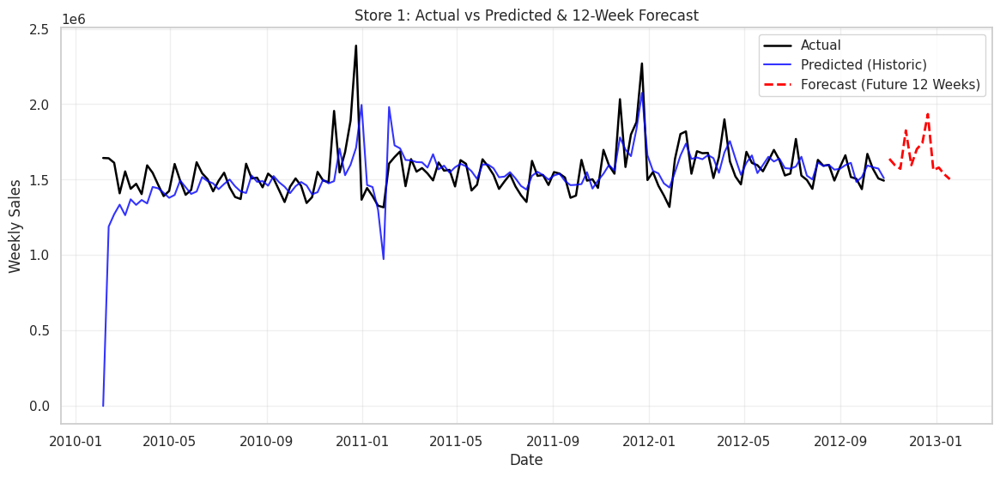

Plotting Store 2...


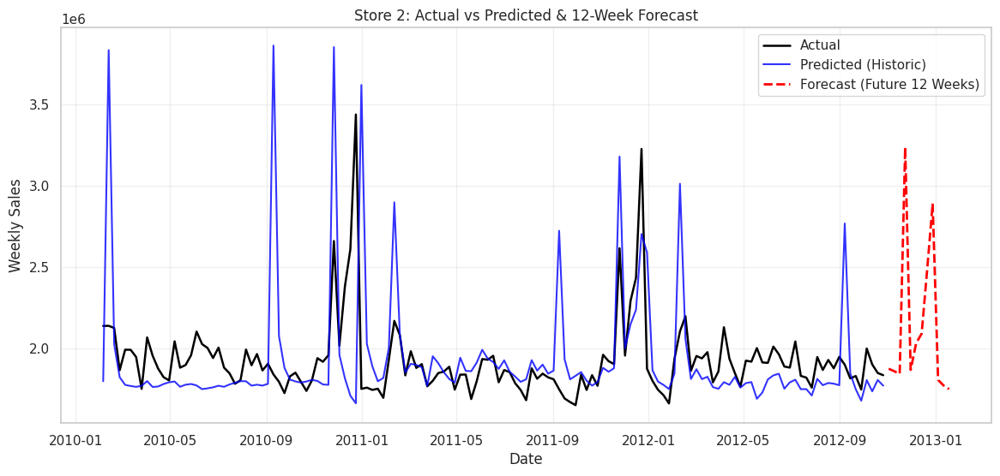

Plotting Store 3...


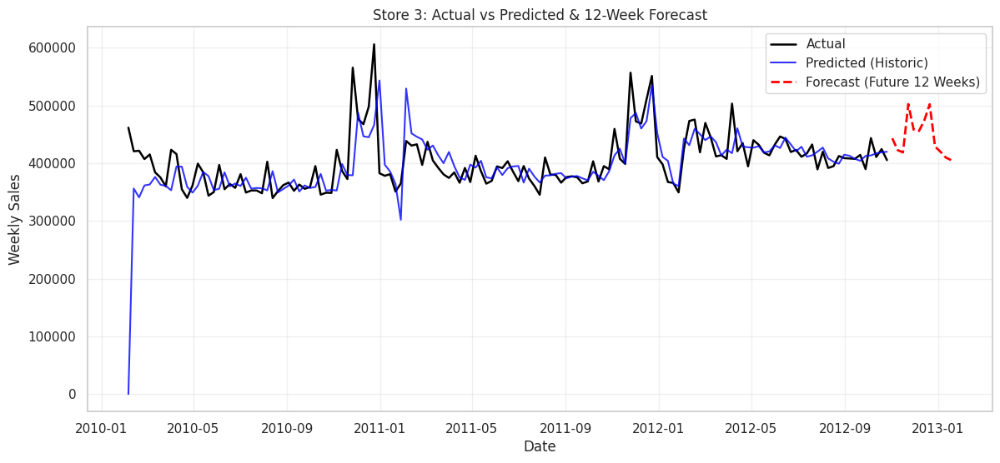

Plotting Store 4...


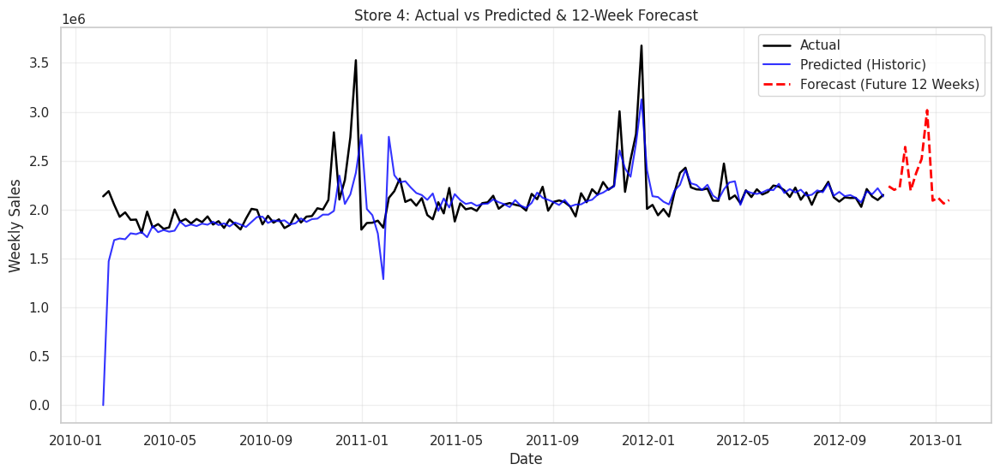

Plotting Store 5...


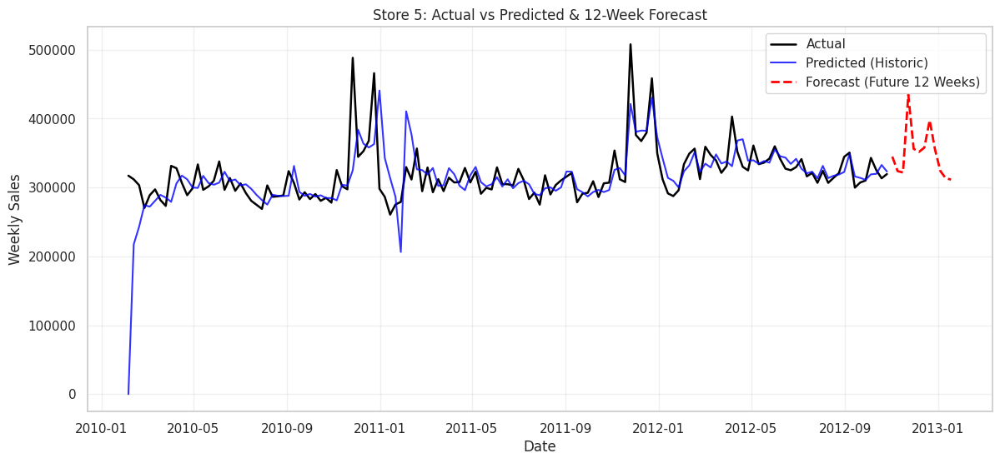

Plotting Store 6...


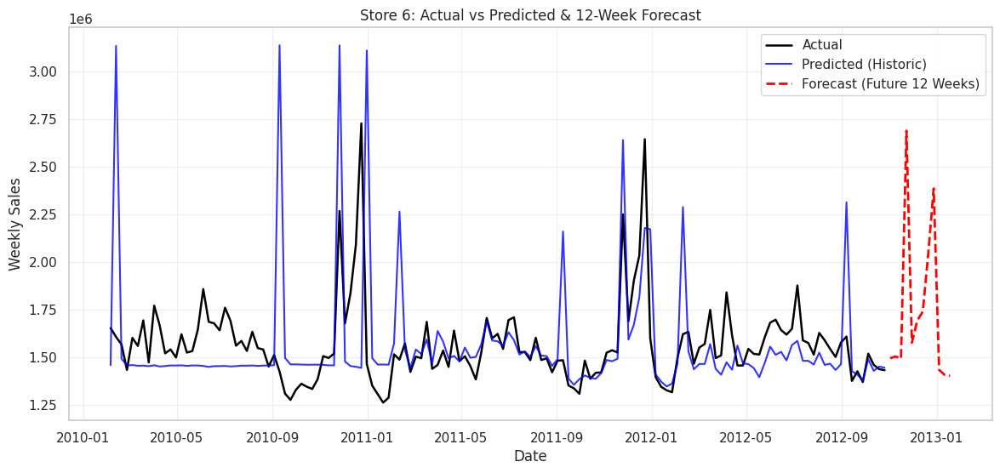

Plotting Store 7...


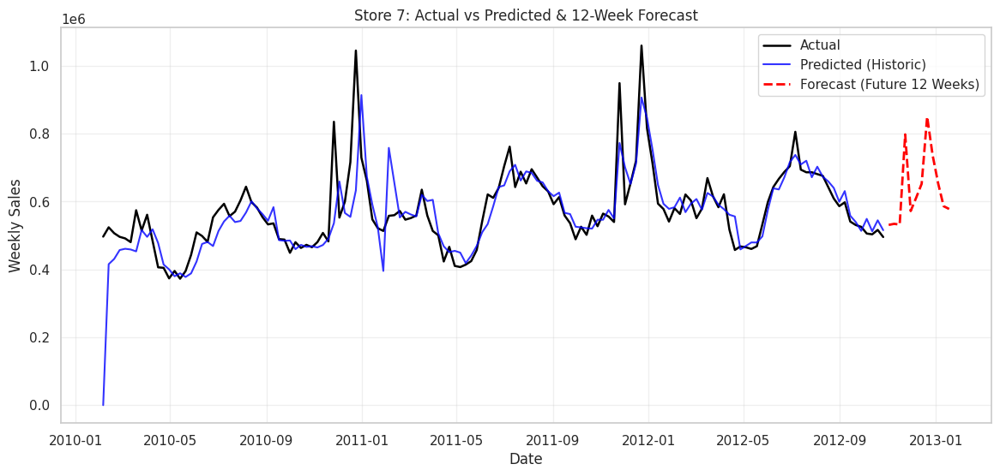

Plotting Store 8...


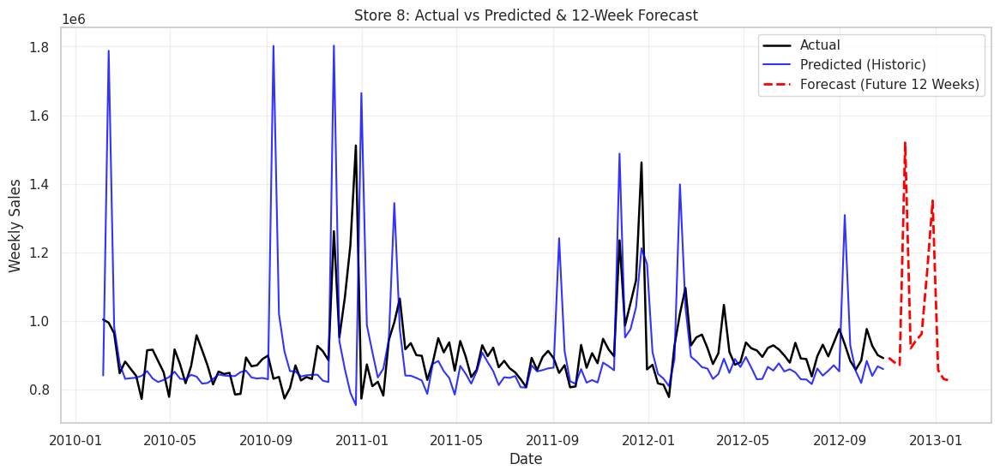

Plotting Store 9...


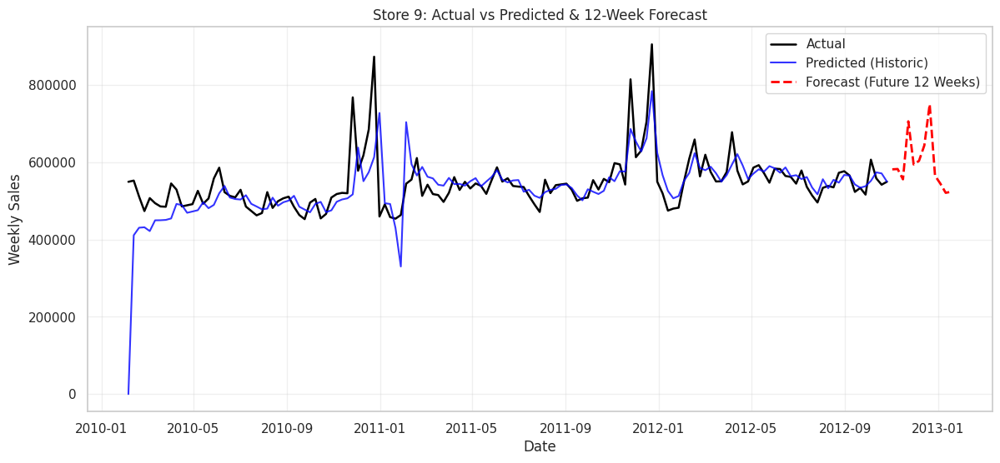

Plotting Store 10...


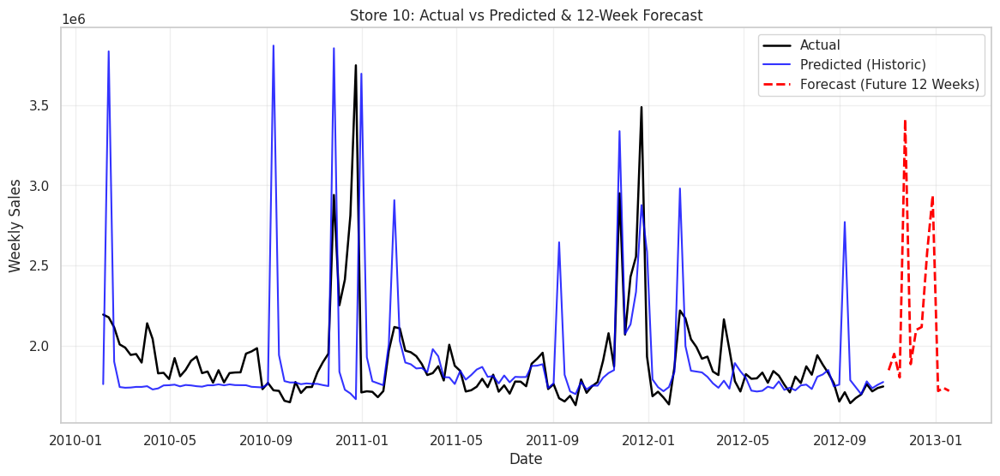

Plotting Store 11...


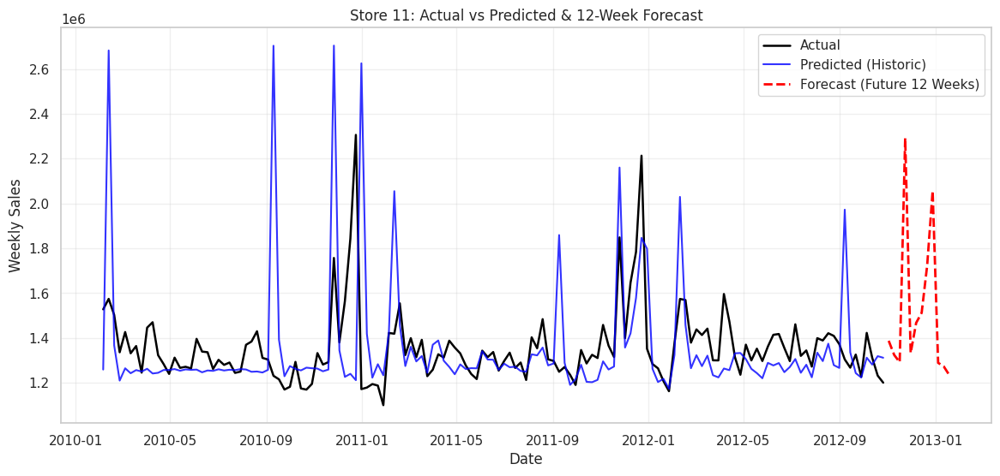

Plotting Store 12...


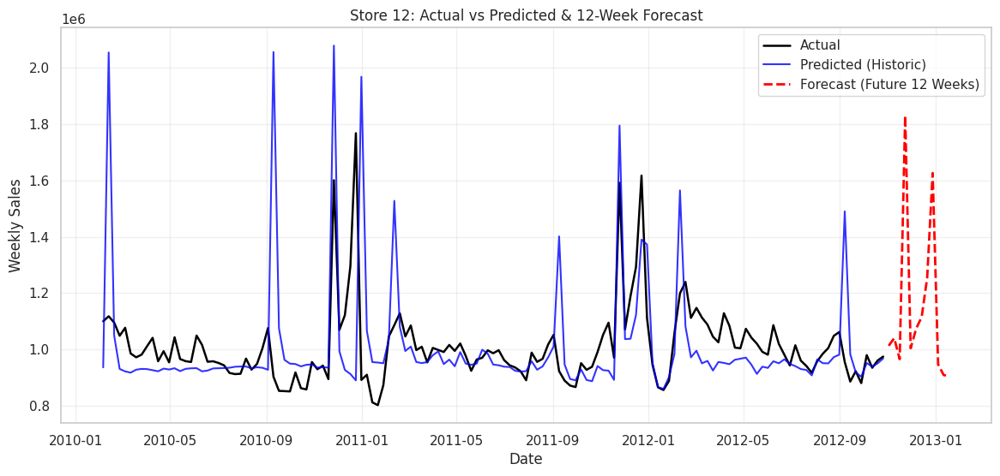

Plotting Store 13...


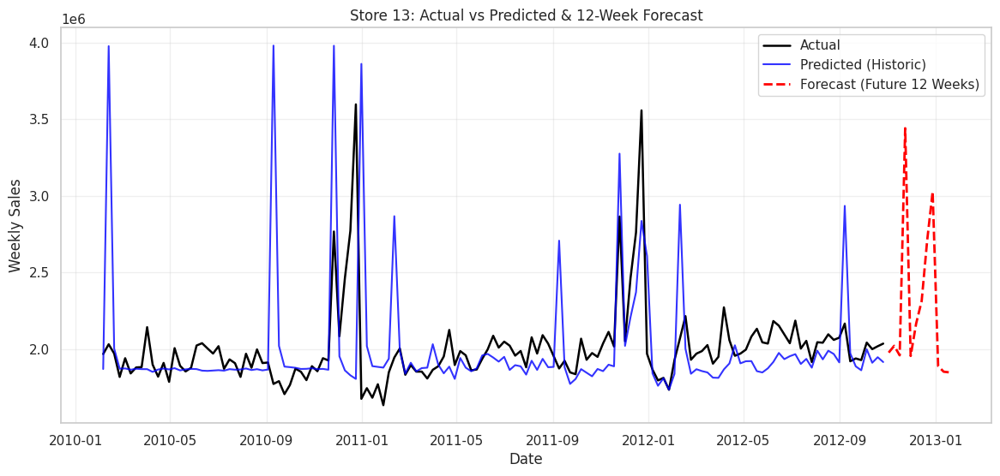

Plotting Store 14...


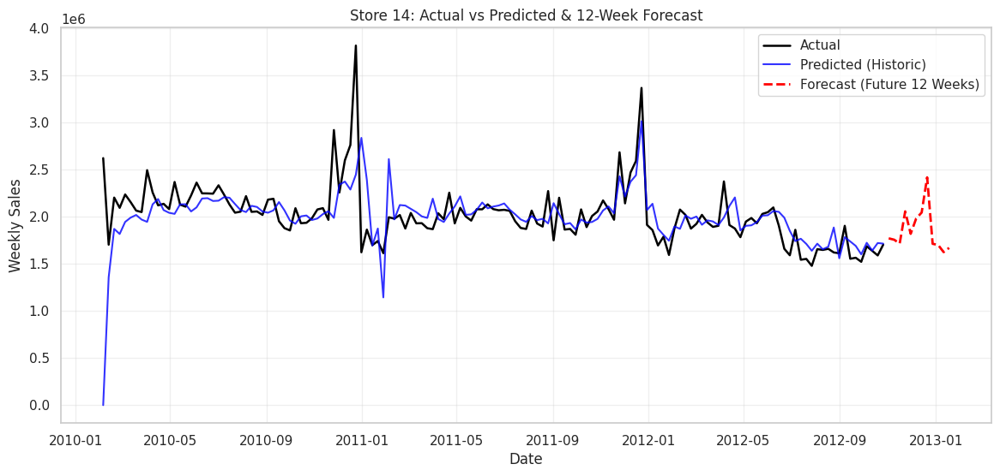

Plotting Store 15...


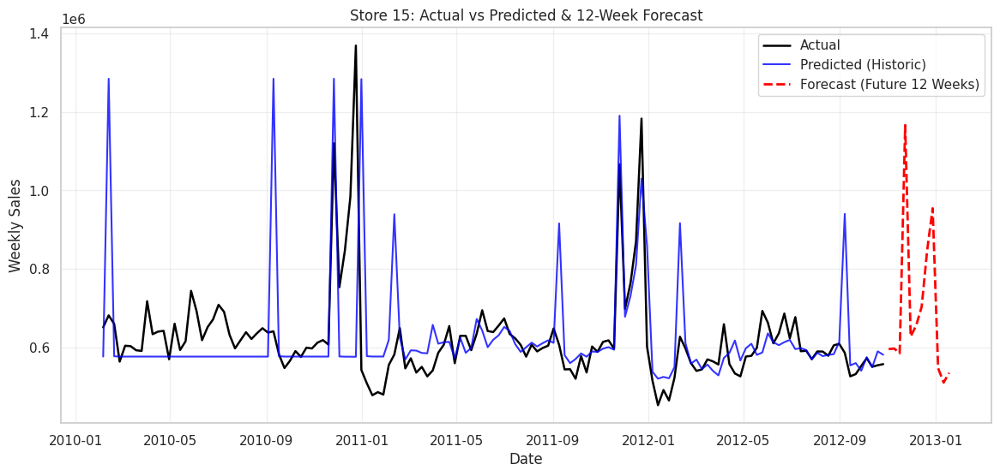

Plotting Store 16...


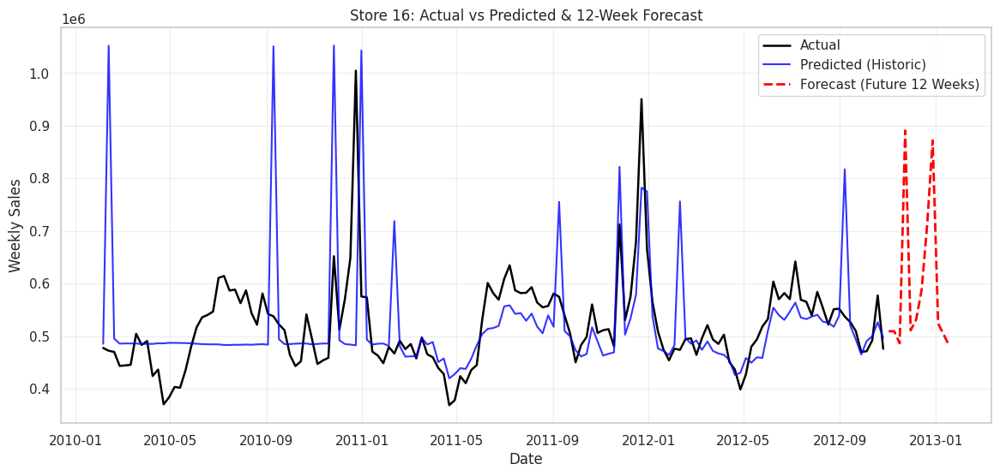

Plotting Store 17...


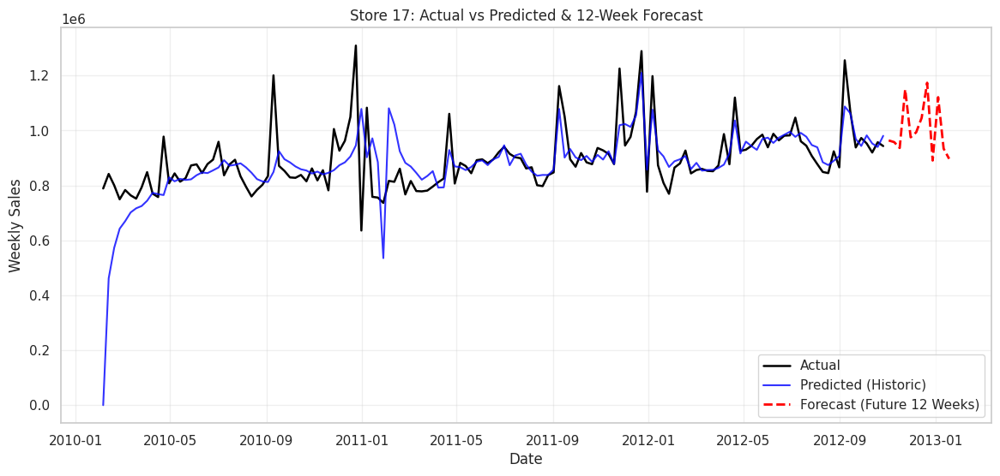

Plotting Store 18...


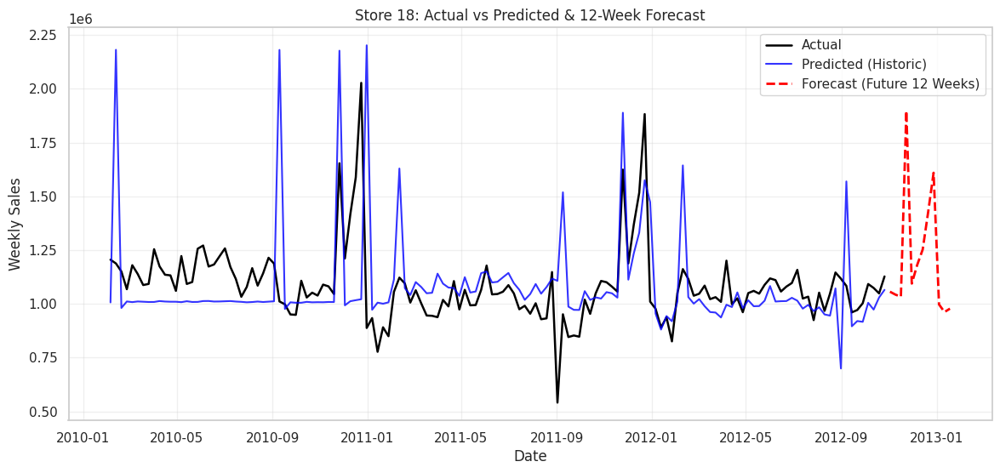

Plotting Store 19...


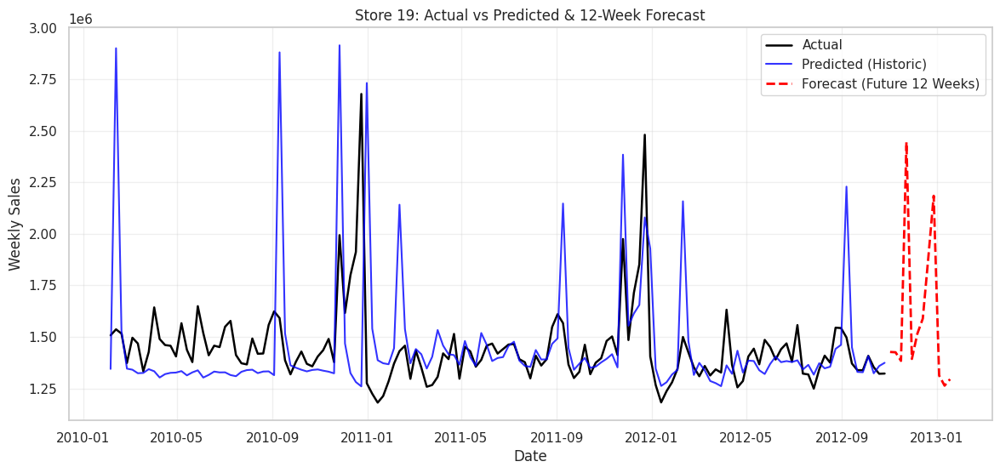

Plotting Store 20...


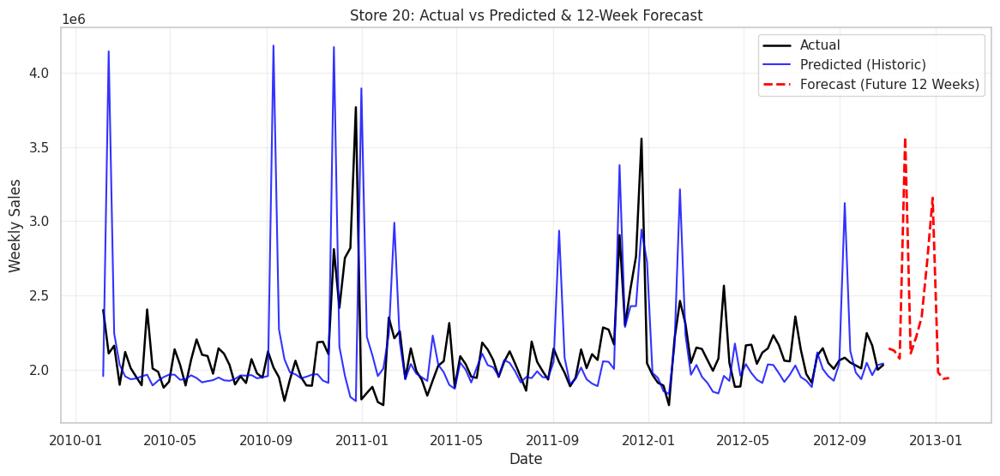

Plotting Store 21...


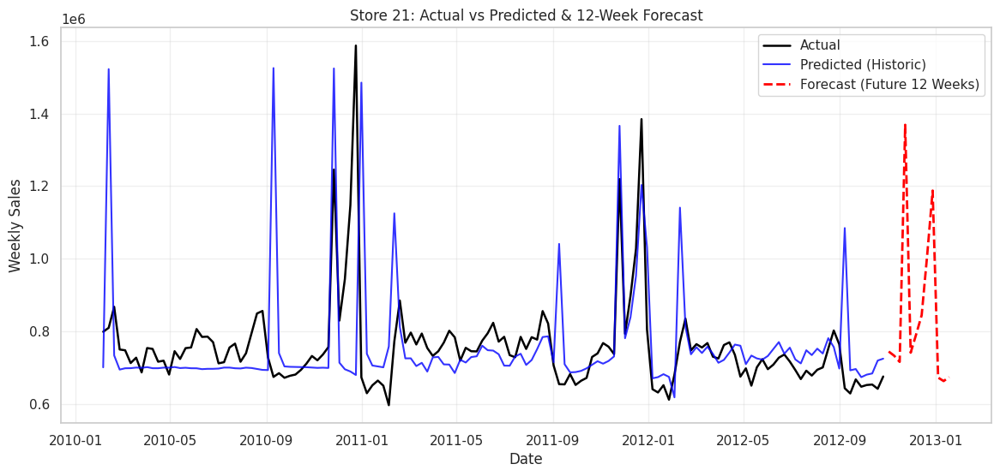

Plotting Store 22...


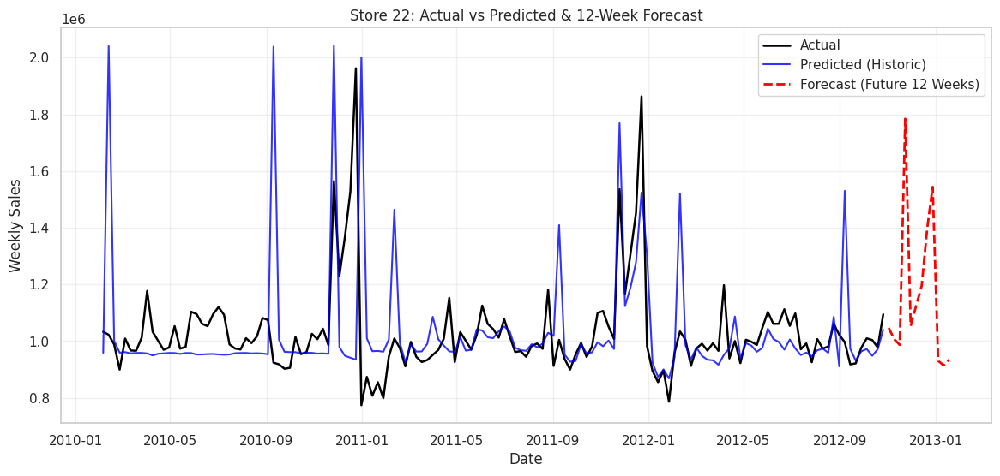

Plotting Store 23...


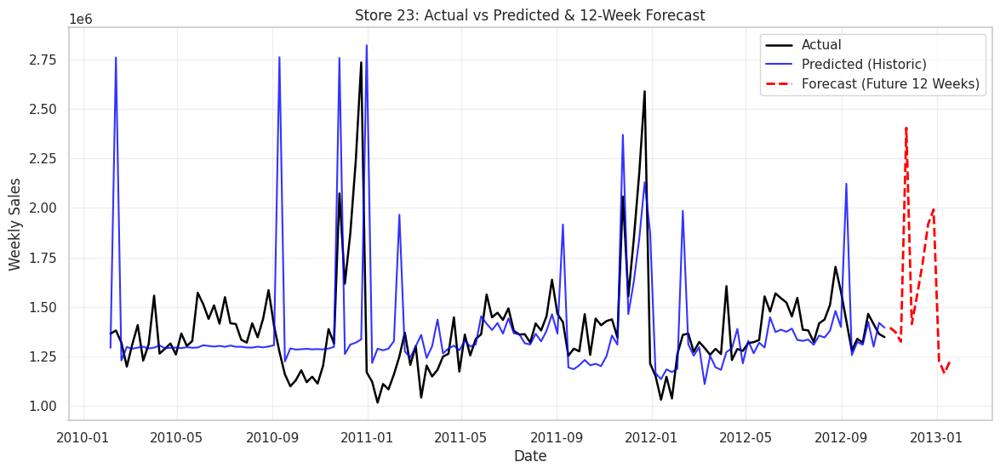

Plotting Store 24...


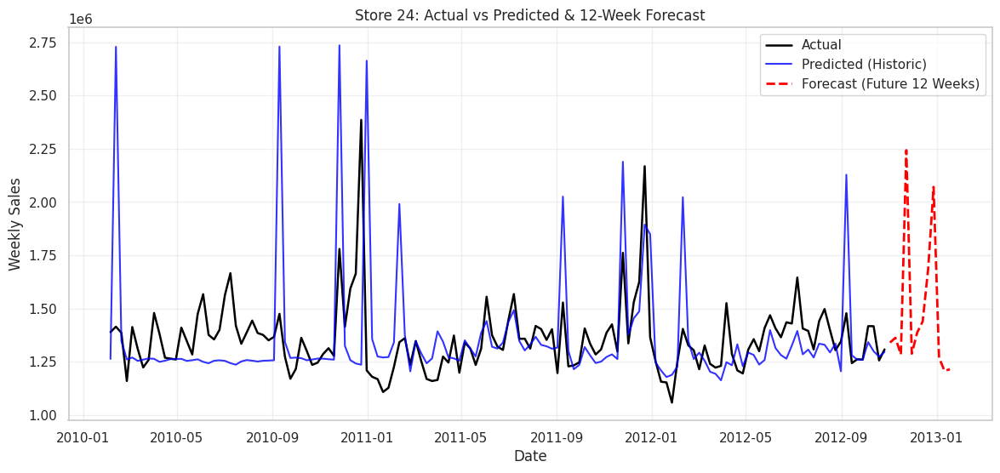

Plotting Store 25...


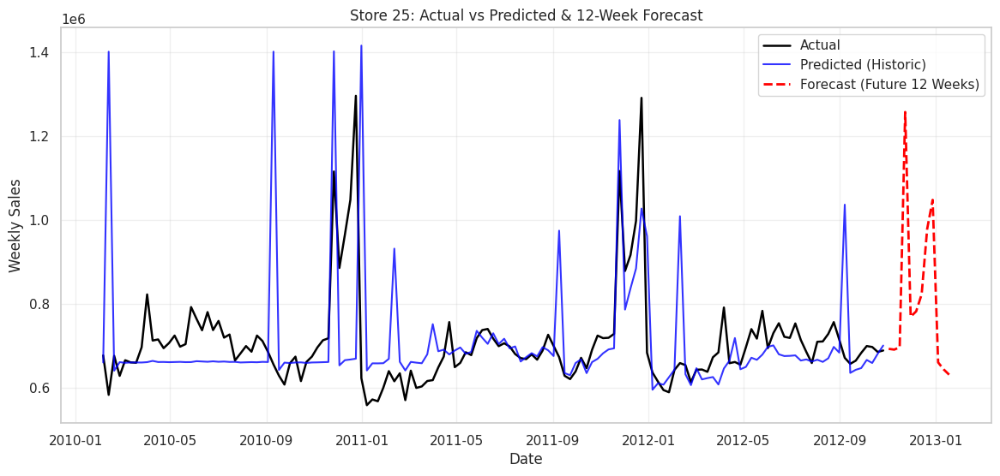

Plotting Store 26...


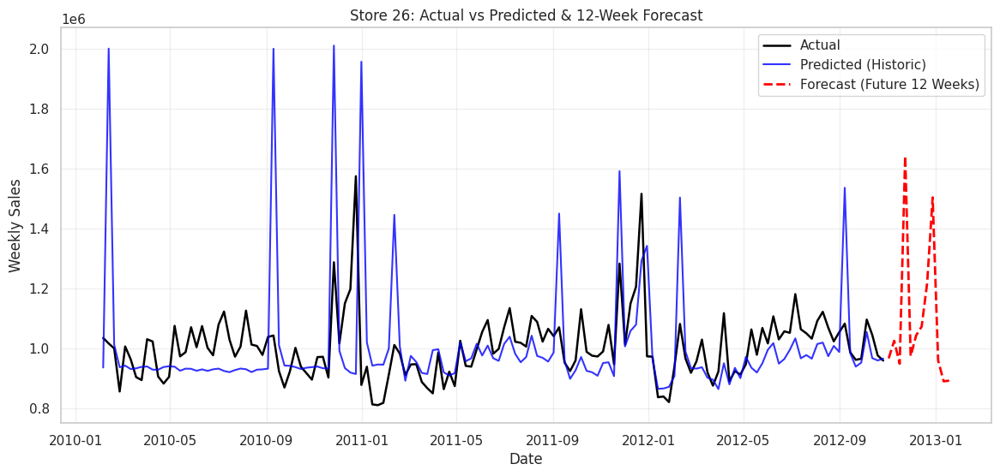

Plotting Store 27...


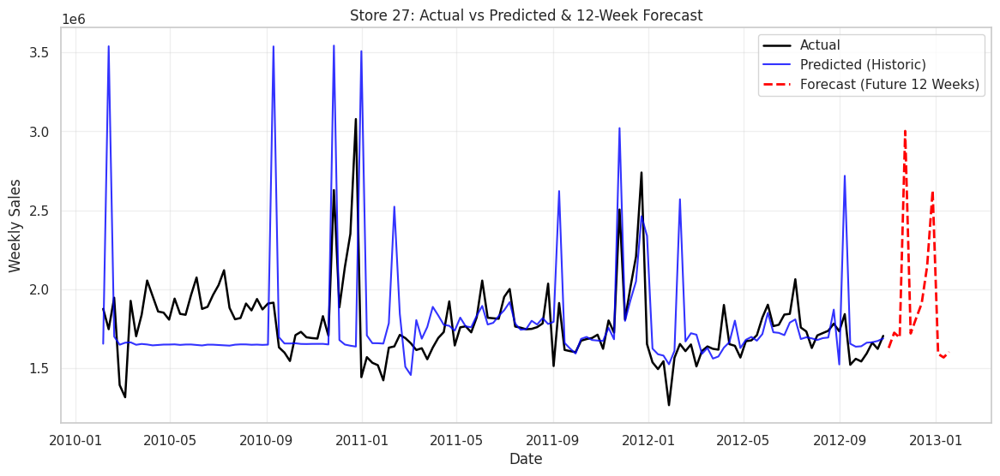

Plotting Store 28...


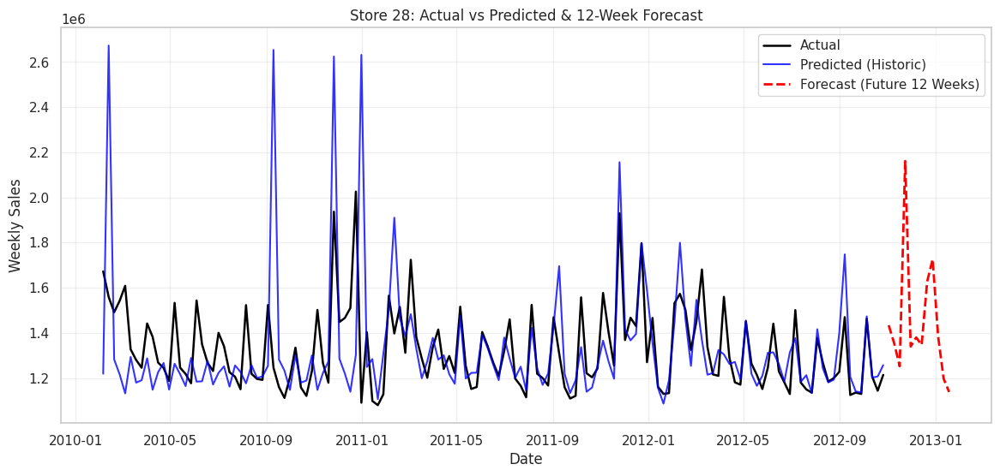

Plotting Store 29...


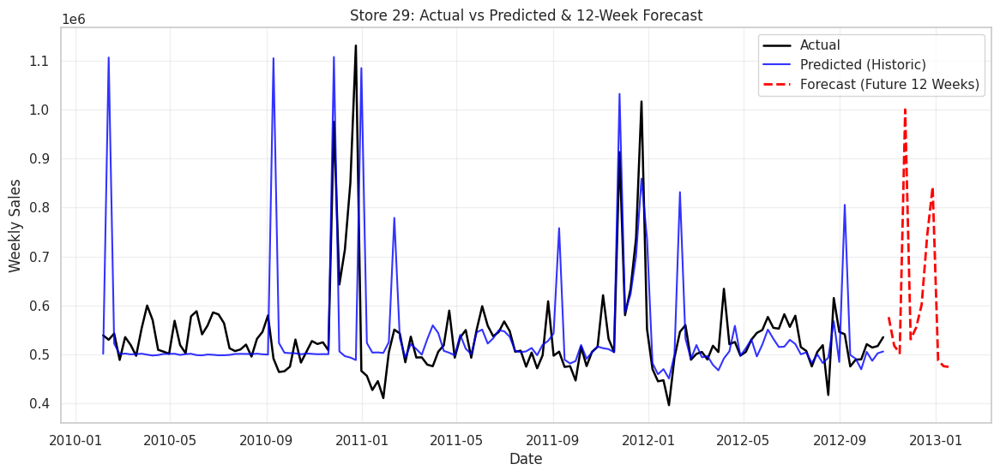

Plotting Store 30...


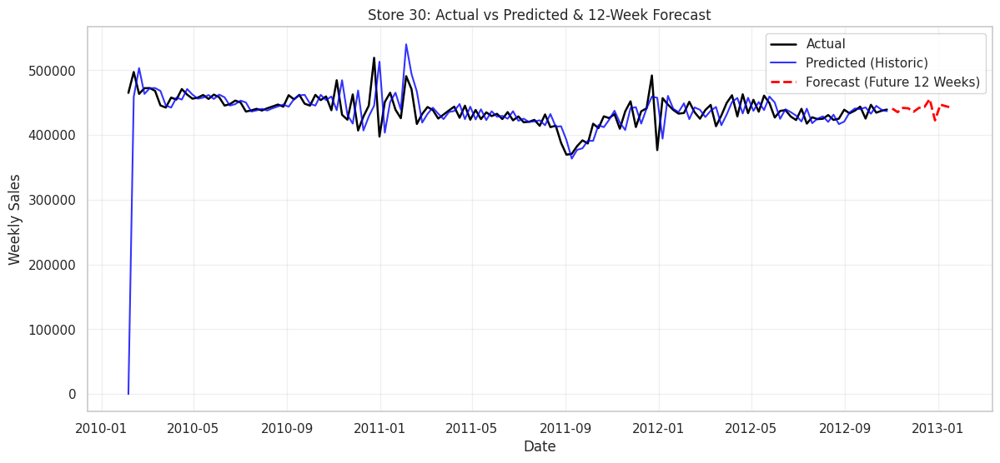

Plotting Store 31...


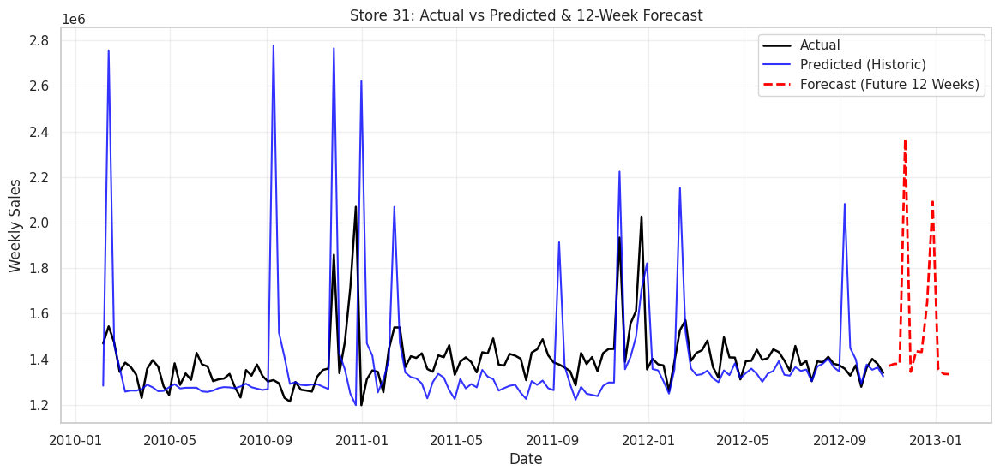

Plotting Store 32...


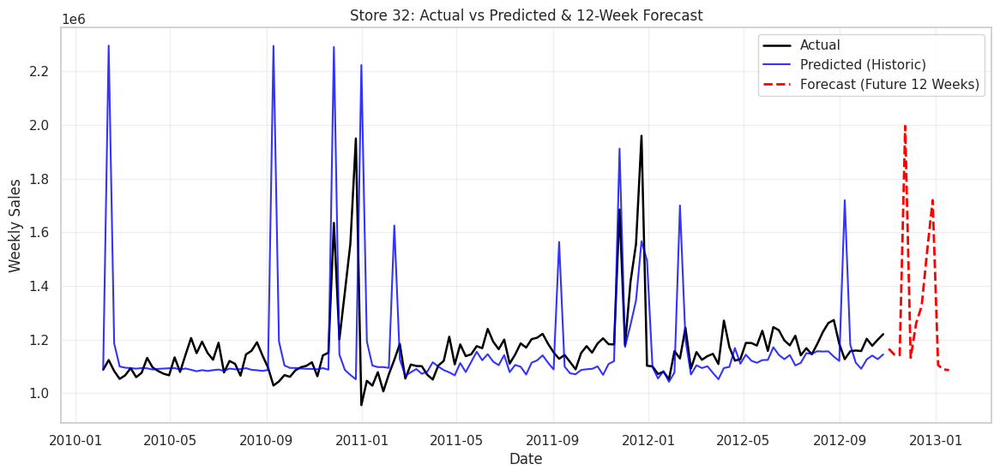

Plotting Store 33...


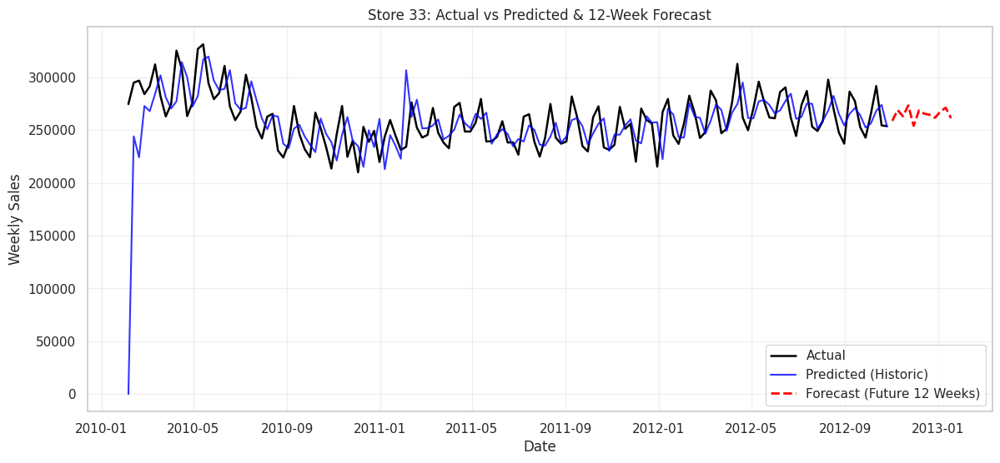

Plotting Store 34...


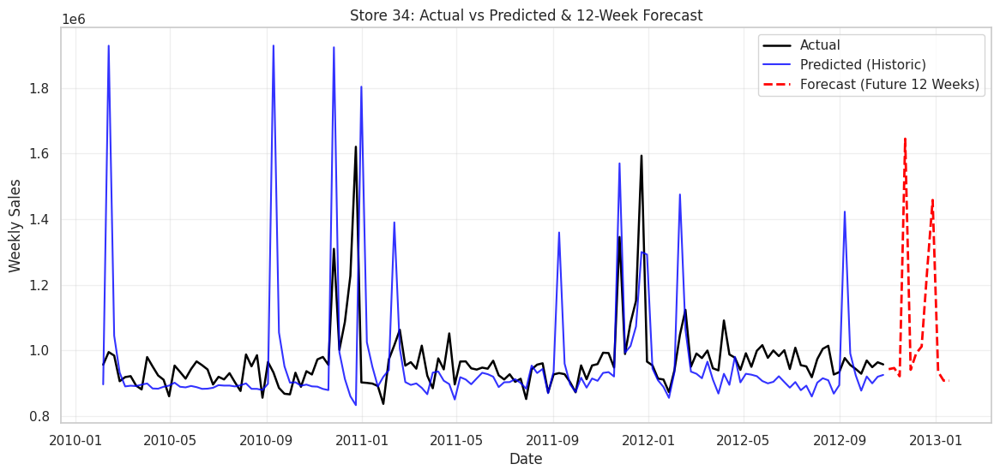

Plotting Store 35...


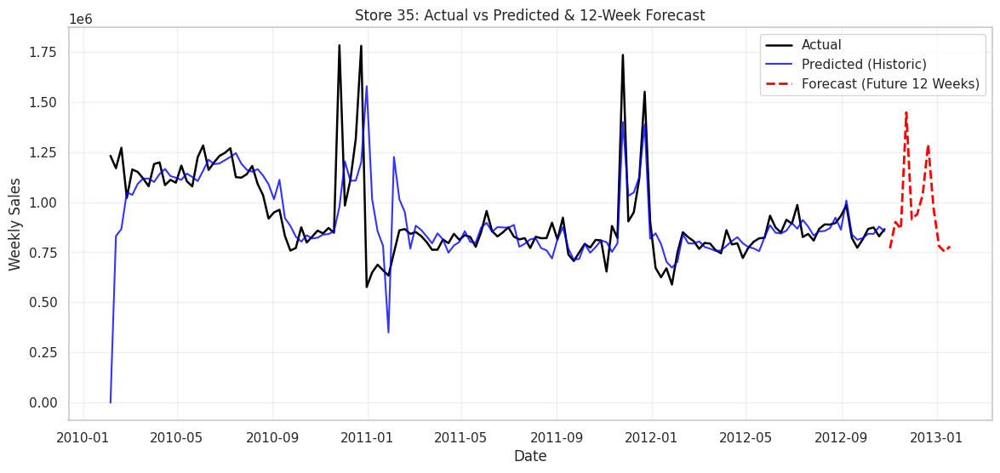

Plotting Store 36...


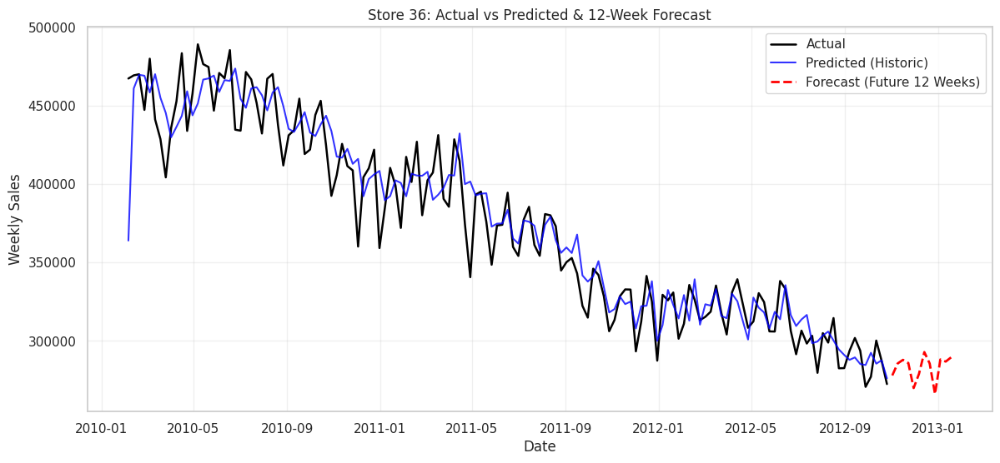

Plotting Store 37...


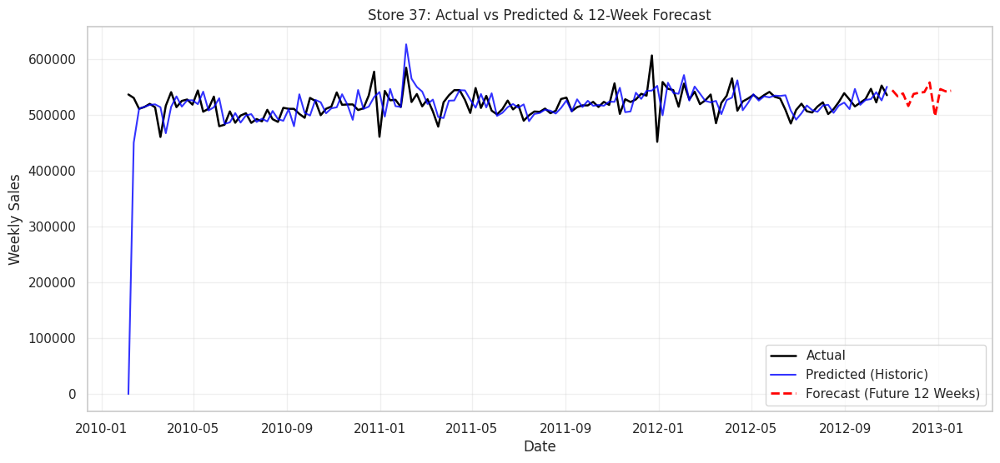

Plotting Store 38...


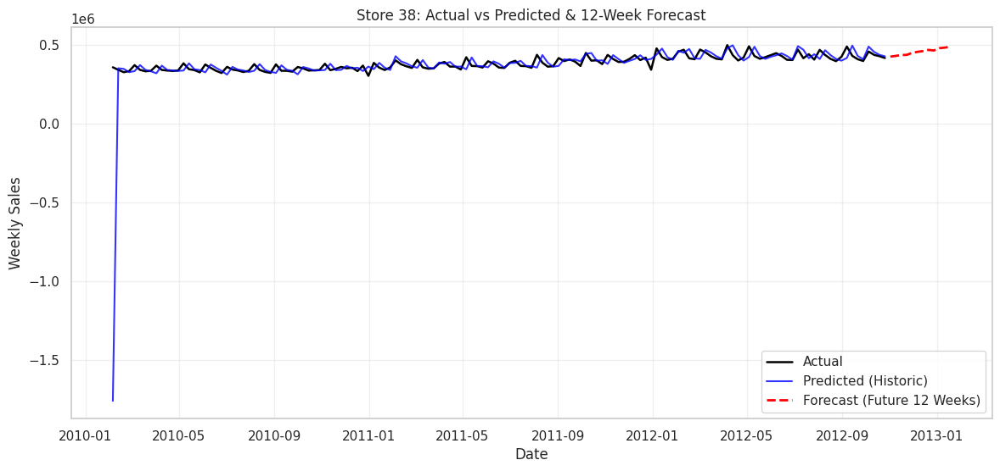

Plotting Store 39...


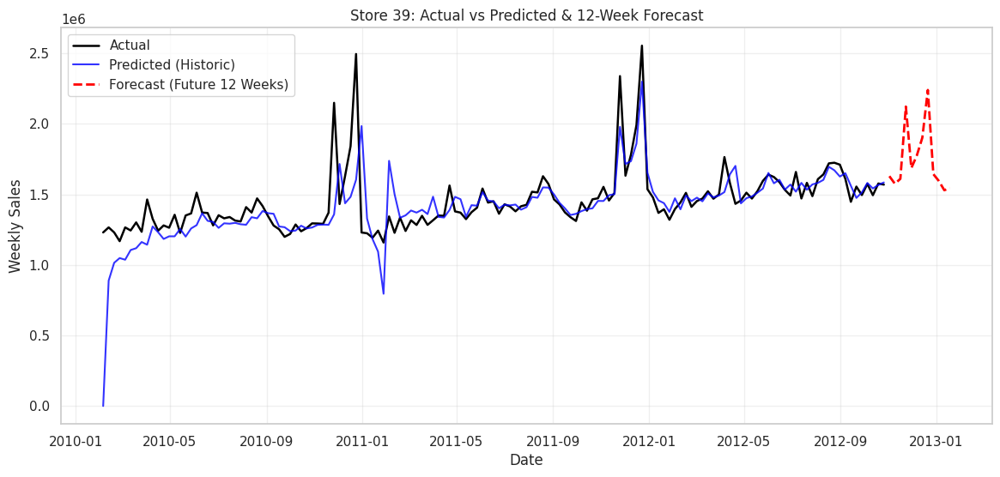

Plotting Store 40...


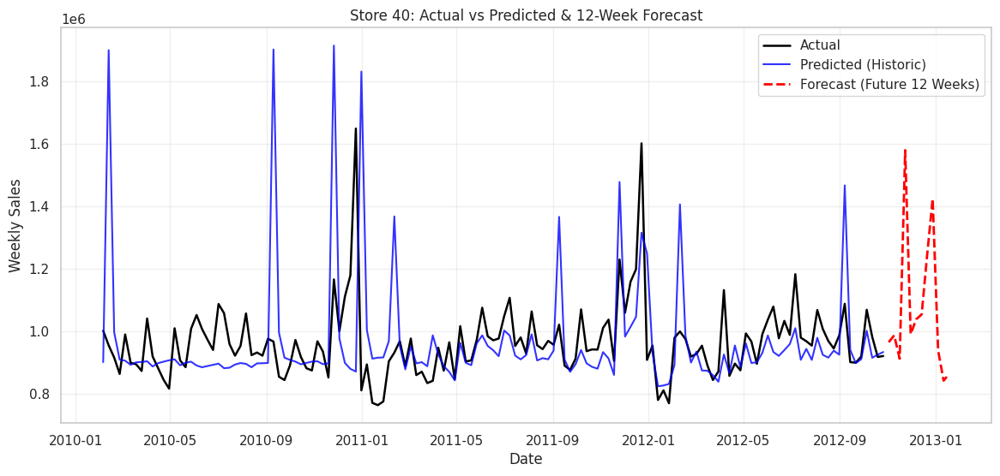

Plotting Store 41...


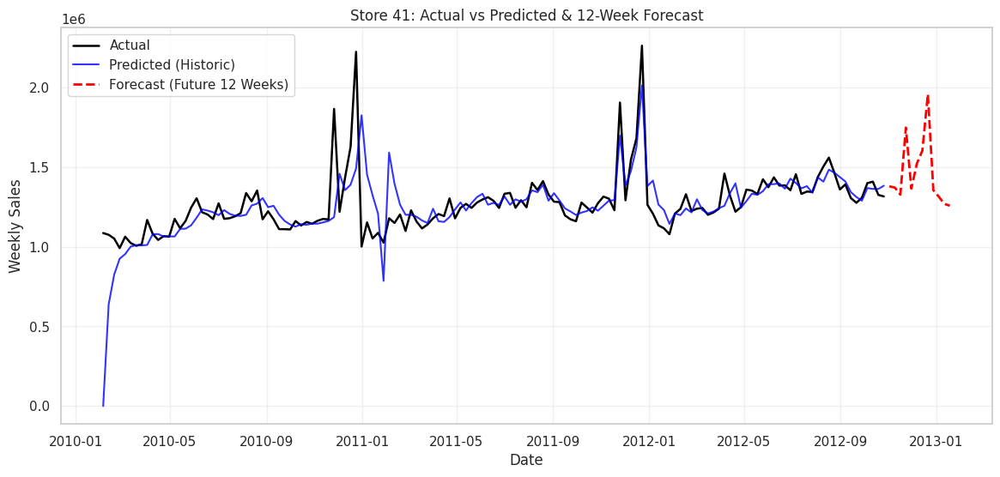

Plotting Store 42...


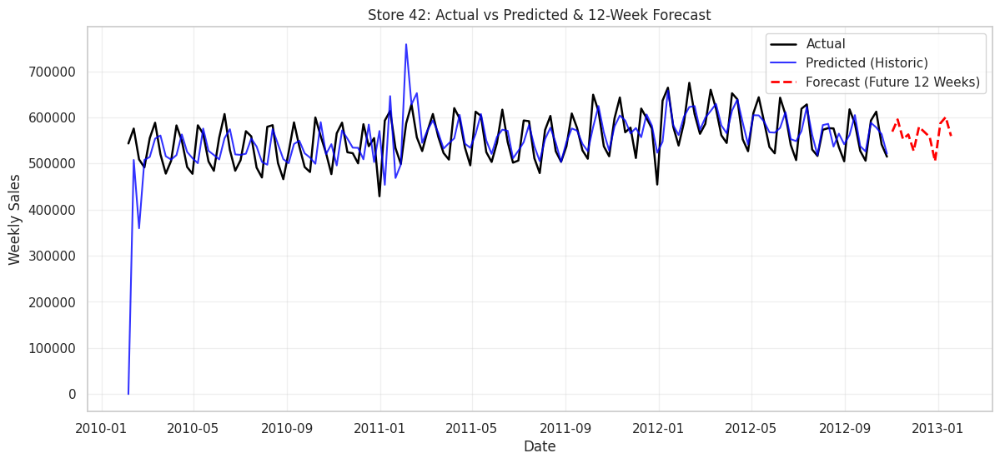

Plotting Store 43...


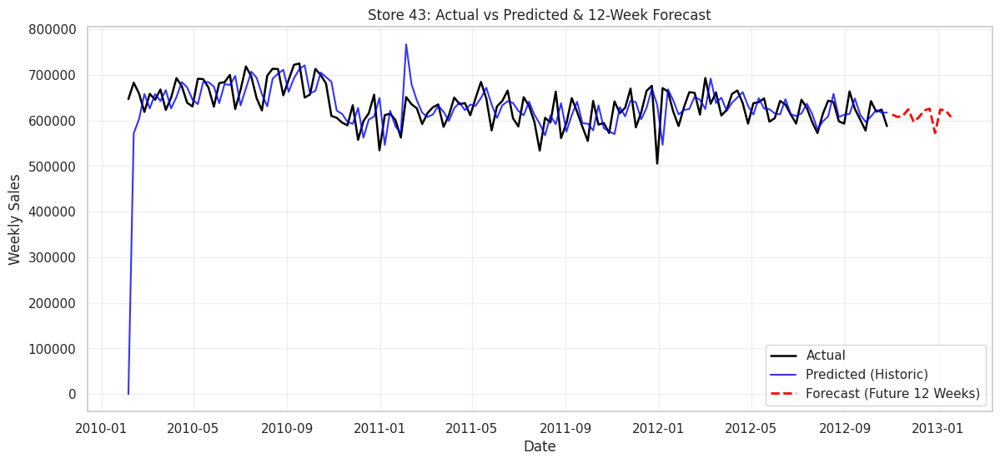

Plotting Store 44...


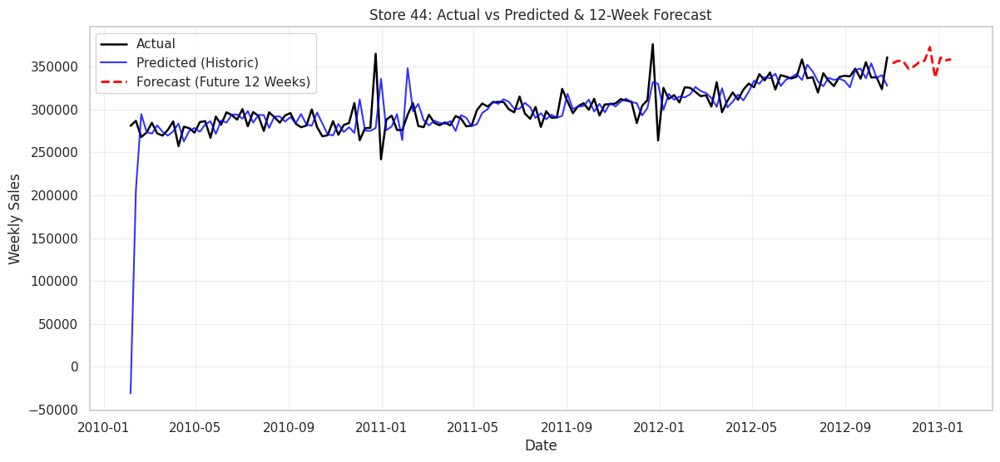

Plotting Store 45...


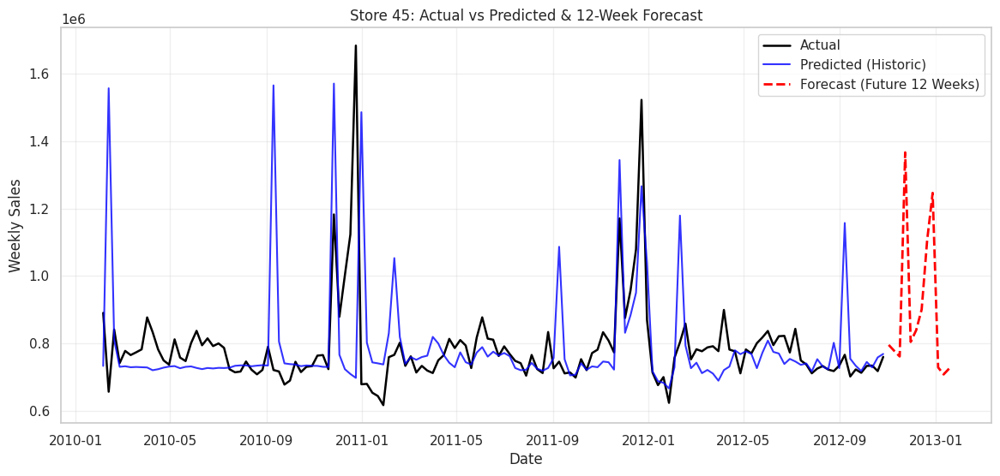

In [773]:
store_ids = sorted(store_weekly.columns)

for sid in store_ids:
    print(f"Plotting Store {sid}...")
    plot_store_forecast(
        sid,
        store_weekly,
        historic_predictions_df,
        future_predictions_df
    )